In [6]:
from google.colab import drive
drive.mount('/content/drive')

# set base path to your folder (edit <your_name>)
BASE = '/content/drive/MyDrive/ds_likitha_sai_turaga/'
CSV_DIR = BASE + 'csv/'
OUT_DIR = BASE + 'output/'

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [8]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

### Import Dataset

In [9]:
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 50)

In [11]:
hist_df = pd.read_csv(CSV_DIR+'/historical_data.csv', parse_dates=['Timestamp IST'], date_parser=lambda x: pd.to_datetime(x, format='%d-%m-%Y %H:%M'))
hist_df.shape

/tmp/ipython-input-2511160278.py:1: FutureWarning: The argument 'date_parser' is deprecated and will be removed in a future version. Please use 'date_format' instead, or read your data in as 'object' dtype and then call 'to_datetime'.
  hist_df = pd.read_csv(CSV_DIR+'/historical_data.csv', parse_dates=['Timestamp IST'], date_parser=lambda x: pd.to_datetime(x, format='%d-%m-%Y %H:%M'))


(211224, 16)

In [12]:
fear_greed_index = pd.read_csv(CSV_DIR+'/fear_greed_index.csv', parse_dates=['date'], date_parser=lambda x: pd.to_datetime(x, format='%Y-%m-%d'))
fear_greed_index.shape

/tmp/ipython-input-3202582596.py:1: FutureWarning: The argument 'date_parser' is deprecated and will be removed in a future version. Please use 'date_format' instead, or read your data in as 'object' dtype and then call 'to_datetime'.
  fear_greed_index = pd.read_csv(CSV_DIR+'/fear_greed_index.csv', parse_dates=['date'], date_parser=lambda x: pd.to_datetime(x, format='%Y-%m-%d'))


(2644, 4)

### Understand the Dataset

In [ ]:
fear_greed_index.head()

,timestamp,value,classification,date
0,1517463000,30,Fear,2018-02-01
1,1517549400,15,Extreme Fear,2018-02-02
2,1517635800,40,Fear,2018-02-03
3,1517722200,24,Extreme Fear,2018-02-04
4,1517808600,11,Extreme Fear,2018-02-05


In [ ]:
fear_greed_index.groupby('date').size().to_frame().sort_index(ascending=False).head()

,0
date,
2025-05-02,1
2025-05-01,1
2025-04-30,1
2025-04-29,1
2025-04-28,1


In [ ]:
hist_df['Execution_Date'] = pd.to_datetime(hist_df['Timestamp IST'].dt.date)
hist_df.head()

,Account,Coin,Execution Price,Size Tokens,Size USD,Side,Timestamp IST,Start Position,Direction,Closed PnL,Transaction Hash,Order ID,Crossed,Fee,Trade ID,Timestamp,Execution_Date
0,0xae5eacaf9c6b9111fd53034a602c192a04e082ed,@107,7.9769,986.87,7872.16,BUY,2024-12-02 22:50:00,0.000000,Buy,0.0,0xec09451986a1874e3a980418412fcd0201f500c95bac...,52017706630,True,0.345404,8.950000e+14,1.730000e+12,2024-12-02
1,0xae5eacaf9c6b9111fd53034a602c192a04e082ed,@107,7.9800,16.00,127.68,BUY,2024-12-02 22:50:00,986.524596,Buy,0.0,0xec09451986a1874e3a980418412fcd0201f500c95bac...,52017706630,True,0.005600,4.430000e+14,1.730000e+12,2024-12-02
2,0xae5eacaf9c6b9111fd53034a602c192a04e082ed,@107,7.9855,144.09,1150.63,BUY,2024-12-02 22:50:00,1002.518996,Buy,0.0,0xec09451986a1874e3a980418412fcd0201f500c95bac...,52017706630,True,0.050431,6.600000e+14,1.730000e+12,2024-12-02
3,0xae5eacaf9c6b9111fd53034a602c192a04e082ed,@107,7.9874,142.98,1142.04,BUY,2024-12-02 22:50:00,1146.558564,Buy,0.0,0xec09451986a1874e3a980418412fcd0201f500c95bac...,52017706630,True,0.050043,1.080000e+15,1.730000e+12,2024-12-02
4,0xae5eacaf9c6b9111fd53034a602c192a04e082ed,@107,7.9894,8.73,69.75,BUY,2024-12-02 22:50:00,1289.488521,Buy,0.0,0xec09451986a1874e3a980418412fcd0201f500c95bac...,52017706630,True,0.003055,1.050000e+15,1.730000e+12,2024-12-02


In [ ]:
hist_df = pd.merge(hist_df, fear_greed_index, left_on='Execution_Date', right_on='date', how='left')
hist_df.head()

,Account,Coin,Execution Price,Size Tokens,Size USD,Side,Timestamp IST,Start Position,Direction,Closed PnL,Transaction Hash,Order ID,Crossed,Fee,Trade ID,Timestamp,Execution_Date,timestamp,value,classification,date
0,0xae5eacaf9c6b9111fd53034a602c192a04e082ed,@107,7.9769,986.87,7872.16,BUY,2024-12-02 22:50:00,0.000000,Buy,0.0,0xec09451986a1874e3a980418412fcd0201f500c95bac...,52017706630,True,0.345404,8.950000e+14,1.730000e+12,2024-12-02,1.733117e+09,80.0,Extreme Greed,2024-12-02
1,0xae5eacaf9c6b9111fd53034a602c192a04e082ed,@107,7.9800,16.00,127.68,BUY,2024-12-02 22:50:00,986.524596,Buy,0.0,0xec09451986a1874e3a980418412fcd0201f500c95bac...,52017706630,True,0.005600,4.430000e+14,1.730000e+12,2024-12-02,1.733117e+09,80.0,Extreme Greed,2024-12-02
2,0xae5eacaf9c6b9111fd53034a602c192a04e082ed,@107,7.9855,144.09,1150.63,BUY,2024-12-02 22:50:00,1002.518996,Buy,0.0,0xec09451986a1874e3a980418412fcd0201f500c95bac...,52017706630,True,0.050431,6.600000e+14,1.730000e+12,2024-12-02,1.733117e+09,80.0,Extreme Greed,2024-12-02
3,0xae5eacaf9c6b9111fd53034a602c192a04e082ed,@107,7.9874,142.98,1142.04,BUY,2024-12-02 22:50:00,1146.558564,Buy,0.0,0xec09451986a1874e3a980418412fcd0201f500c95bac...,52017706630,True,0.050043,1.080000e+15,1.730000e+12,2024-12-02,1.733117e+09,80.0,Extreme Greed,2024-12-02
4,0xae5eacaf9c6b9111fd53034a602c192a04e082ed,@107,7.9894,8.73,69.75,BUY,2024-12-02 22:50:00,1289.488521,Buy,0.0,0xec09451986a1874e3a980418412fcd0201f500c95bac...,52017706630,True,0.003055,1.050000e+15,1.730000e+12,2024-12-02,1.733117e+09,80.0,Extreme Greed,2024-12-02


In [ ]:
hist_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 211224 entries, 0 to 211223
Data columns (total 21 columns):
 #   Column            Non-Null Count   Dtype         
---  ------            --------------   -----         
 0   Account           211224 non-null  object        
 1   Coin              211224 non-null  object        
 2   Execution Price   211224 non-null  float64       
 3   Size Tokens       211224 non-null  float64       
 4   Size USD          211224 non-null  float64       
 5   Side              211224 non-null  object        
 6   Timestamp IST     211224 non-null  datetime64[ns]
 7   Start Position    211224 non-null  float64       
 8   Direction         211224 non-null  object        
 9   Closed PnL        211224 non-null  float64       
 10  Transaction Hash  211224 non-null  object        
 11  Order ID          211224 non-null  int64         
 12  Crossed           211224 non-null  bool          
 13  Fee               211224 non-null  float64       
 14  Trad

In [ ]:
hist_df.drop(['Timestamp','date','timestamp'], axis=1, inplace=True)

In [ ]:
hist_df.head()

,Account,Coin,Execution Price,Size Tokens,Size USD,Side,Timestamp IST,Start Position,Direction,Closed PnL,Transaction Hash,Order ID,Crossed,Fee,Trade ID,Execution_Date,value,classification
0,0xae5eacaf9c6b9111fd53034a602c192a04e082ed,@107,7.9769,986.87,7872.16,BUY,2024-12-02 22:50:00,0.000000,Buy,0.0,0xec09451986a1874e3a980418412fcd0201f500c95bac...,52017706630,True,0.345404,8.950000e+14,2024-12-02,80.0,Extreme Greed
1,0xae5eacaf9c6b9111fd53034a602c192a04e082ed,@107,7.9800,16.00,127.68,BUY,2024-12-02 22:50:00,986.524596,Buy,0.0,0xec09451986a1874e3a980418412fcd0201f500c95bac...,52017706630,True,0.005600,4.430000e+14,2024-12-02,80.0,Extreme Greed
2,0xae5eacaf9c6b9111fd53034a602c192a04e082ed,@107,7.9855,144.09,1150.63,BUY,2024-12-02 22:50:00,1002.518996,Buy,0.0,0xec09451986a1874e3a980418412fcd0201f500c95bac...,52017706630,True,0.050431,6.600000e+14,2024-12-02,80.0,Extreme Greed
3,0xae5eacaf9c6b9111fd53034a602c192a04e082ed,@107,7.9874,142.98,1142.04,BUY,2024-12-02 22:50:00,1146.558564,Buy,0.0,0xec09451986a1874e3a980418412fcd0201f500c95bac...,52017706630,True,0.050043,1.080000e+15,2024-12-02,80.0,Extreme Greed
4,0xae5eacaf9c6b9111fd53034a602c192a04e082ed,@107,7.9894,8.73,69.75,BUY,2024-12-02 22:50:00,1289.488521,Buy,0.0,0xec09451986a1874e3a980418412fcd0201f500c95bac...,52017706630,True,0.003055,1.050000e+15,2024-12-02,80.0,Extreme Greed


In [ ]:
hist_df[['Order ID', 'Trade ID']] = hist_df[['Order ID', 'Trade ID']].astype(str)

In [ ]:
hist_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 211224 entries, 0 to 211223
Data columns (total 18 columns):
 #   Column            Non-Null Count   Dtype         
---  ------            --------------   -----         
 0   Account           211224 non-null  object        
 1   Coin              211224 non-null  object        
 2   Execution Price   211224 non-null  float64       
 3   Size Tokens       211224 non-null  float64       
 4   Size USD          211224 non-null  float64       
 5   Side              211224 non-null  object        
 6   Timestamp IST     211224 non-null  datetime64[ns]
 7   Start Position    211224 non-null  float64       
 8   Direction         211224 non-null  object        
 9   Closed PnL        211224 non-null  float64       
 10  Transaction Hash  211224 non-null  object        
 11  Order ID          211224 non-null  object        
 12  Crossed           211224 non-null  bool          
 13  Fee               211224 non-null  float64       
 14  Trad

### Understand the Columns and data distribution

In [ ]:
hist_df.Account.value_counts(normalize=True)

0xbee1707d6b44d4d52bfe19e41f8a828645437aab    0.190244
0xbaaaf6571ab7d571043ff1e313a9609a10637864    0.100330
0xa0feb3725a9335f49874d7cd8eaad6be45b27416    0.073879
0x8477e447846c758f5a675856001ea72298fd9cb5    0.071005
0xb1231a4a2dd02f2276fa3c5e2a2f3436e6bfed23    0.069751
0x28736f43f1e871e6aa8b1148d38d4994275d72c4    0.063018
0x513b8629fe877bb581bf244e326a047b249c4ff1    0.057929
0x75f7eeb85dc639d5e99c78f95393aa9a5f1170d4    0.046837
0x47add9a56df66b524d5e2c1993a43cde53b6ed85    0.040332
0x4f93fead39b70a1824f981a54d4e55b278e9f760    0.035905
0x23e7a7f8d14b550961925fbfdaa92f5d195ba5bd    0.034466
0xb899e522b5715391ae1d4f137653e7906c5e2115    0.022905
0x8170715b3b381dffb7062c0298972d4727a0a63b    0.021783
0x4acb90e786d897ecffb614dc822eb231b4ffb9f4    0.020623
0x083384f897ee0f19899168e3b1bec365f52a9012    0.018076
0x271b280974205ca63b716753467d5a371de622ab    0.018033
0x39cef799f8b69da1995852eea189df24eb5cae3c    0.016991
0x2c229d22b100a7beb69122eed721cee9b24011dd    0.015334
0x92f17e8d

In [ ]:
hist_df['Execution Price'].describe([0,0.01,0.05,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,0.95,0.99,1])

count    211224.000000
mean      11414.723350
std       29447.654868
min           0.000005
0%            0.000005
1%            0.012530
5%            0.148720
10%           0.520000
20%           2.195400
30%          12.530900
40%          14.864000
50%          18.280000
60%          22.719000
70%          26.413000
80%         244.500000
90%       83155.000000
95%       93259.000000
99%       99011.000000
100%     109004.000000
max      109004.000000
Name: Execution Price, dtype: float64

In [ ]:
# for each coin, get the average execution price, min and max execution price, and the std
coin_stats = hist_df.groupby('Coin').agg(
    Average_Execution_Price=('Execution Price', 'mean'),
    Min_Execution_Price=('Execution Price', 'min'),
    Max_Execution_Price=('Execution Price', 'max'),
    # Number_of_Trades=('Trade ID', 'nunique'),
    std_Execution_Price=('Execution Price', 'std')
).reset_index()
coin_stats.sort_values(by='Average_Execution_Price', ascending=False, inplace=True)

In [ ]:
coin_stats.Average_Execution_Price.describe([0,0.01,0.05,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,0.95,0.99,1])

count      246.000000
mean       768.220630
std       7976.822280
min          0.000010
0%           0.000010
1%           0.000016
5%           0.000215
10%          0.002569
20%          0.015582
30%          0.097714
40%          0.291274
50%          0.579787
60%          1.068190
70%          1.951641
80%          4.787833
90%         18.546139
95%         97.422558
99%       2985.178591
100%     90754.824571
max      90754.824571
Name: Average_Execution_Price, dtype: float64

In [ ]:
coin_stats.head(), coin_stats.shape

(     Coin  Average_Execution_Price  Min_Execution_Price  Max_Execution_Price  \
 20   @142             90754.824571              74841.0              97639.0   
 105   BTC             86454.455801              39185.0             109004.0   
 181  PAXG              3253.918103               3080.0               3452.3   
 120   ETH              2656.719188               1395.8               4041.0   
 23   @151              1762.772531               1575.0               1832.8   
 
      std_Execution_Price  
 20           5180.783899  
 105         13793.586813  
 181           154.998365  
 120           683.015642  
 23             55.239149  ,
 (246, 5))

In [ ]:
coin_stats.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 246 entries, 20 to 43
Data columns (total 5 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Coin                     246 non-null    object 
 1   Average_Execution_Price  246 non-null    float64
 2   Min_Execution_Price      246 non-null    float64
 3   Max_Execution_Price      246 non-null    float64
 4   std_Execution_Price      230 non-null    float64
dtypes: float64(4), object(1)
memory usage: 11.5+ KB


In [ ]:
coin_stats[coin_stats.std_Execution_Price.isnull()]

,Coin,Average_Execution_Price,Min_Execution_Price,Max_Execution_Price,std_Execution_Price
73,@86,16.947000,16.947000,16.947000,NaN
66,@68,1.122100,1.122100,1.122100,NaN
53,@42,0.044799,0.044799,0.044799,NaN
64,@61,0.016169,0.016169,0.016169,NaN
28,@18,0.011624,0.011624,0.011624,NaN
35,@25,0.002786,0.002786,0.002786,NaN
17,@135,0.002594,0.002594,0.002594,NaN
63,@6,0.001819,0.001819,0.001819,NaN
32,@21,0.000594,0.000594,0.000594,NaN
6,@11,0.000200,0.000200,0.000200,NaN


In [ ]:
coin_stats.fillna({'std_Execution_Price': 0}, inplace=True)

In [ ]:
# identify the difference clusters in the data also choose the optimal number of clusters
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
coin_stats_scaled = scaler.fit_transform(coin_stats[['Average_Execution_Price', 'Min_Execution_Price', 'Max_Execution_Price', 'std_Execution_Price']])
kmeans = KMeans(n_clusters=3, random_state=42)
kmeans.fit(coin_stats_scaled)
coin_stats['Cluster'] = kmeans.labels_
coin_stats['Cluster'] = coin_stats['Cluster'].astype(str)
coin_stats.head()

,Coin,Average_Execution_Price,Min_Execution_Price,Max_Execution_Price,std_Execution_Price,Cluster
20,@142,90754.824571,74841.0,97639.0,5180.783899,2
105,BTC,86454.455801,39185.0,109004.0,13793.586813,1
181,PAXG,3253.918103,3080.0,3452.3,154.998365,0
120,ETH,2656.719188,1395.8,4041.0,683.015642,0
23,@151,1762.772531,1575.0,1832.8,55.239149,0


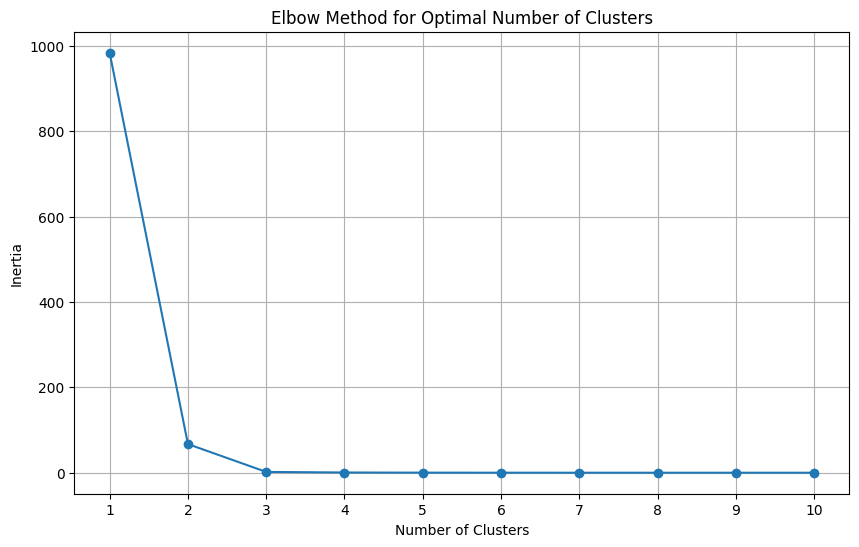

In [ ]:
# identify the optimal number of clusters using the elbow method
inertia = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, random_state=42)
    kmeans.fit(coin_stats_scaled)
    inertia.append(kmeans.inertia_)
plt.figure(figsize=(10, 6))
plt.plot(range(1, 11), inertia, marker='o')
plt.title('Elbow Method for Optimal Number of Clusters')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.xticks(range(1, 11))
plt.grid()
plt.show()

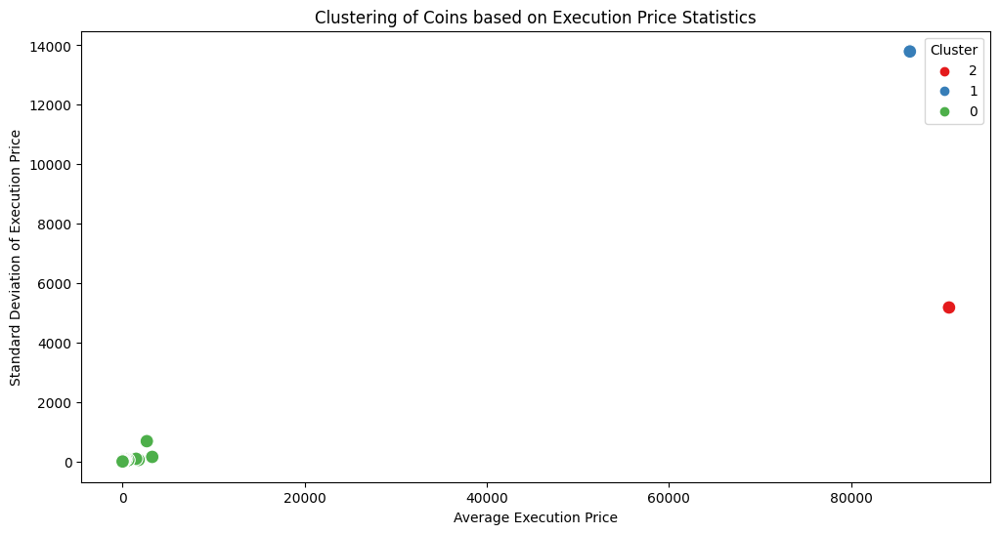

In [ ]:
plt.figure(figsize=(12, 6))
sns.scatterplot(data=coin_stats, x='Average_Execution_Price', y='std_Execution_Price', hue='Cluster', palette='Set1', s=100)
plt.title('Clustering of Coins based on Execution Price Statistics')
plt.xlabel('Average Execution Price')
plt.ylabel('Standard Deviation of Execution Price')
plt.legend(title='Cluster')
plt.show()

C:\Users\tassl\AppData\Local\Temp\ipykernel_5424\916868278.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  coin_stats_0['Cluster'] = kmeans_0.labels_
C:\Users\tassl\AppData\Local\Temp\ipykernel_5424\916868278.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  coin_stats_0['Cluster'] = coin_stats_0['Cluster'].astype(str)


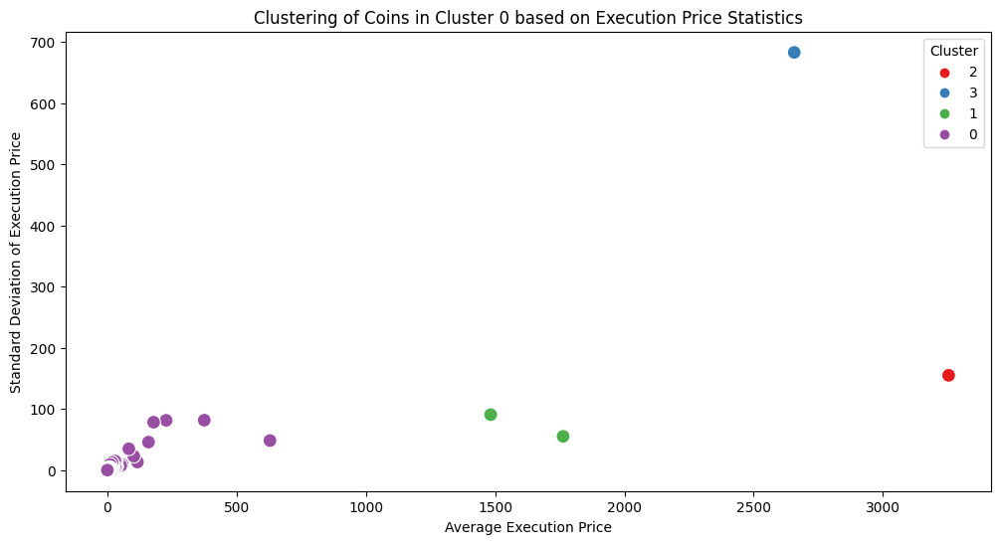

In [ ]:
# identify clusters with cluster 0 using the same features and KMeans
kmeans_0 = KMeans(n_clusters=4, random_state=42)
coin_stats_0 = coin_stats[coin_stats['Cluster'] == '0']
coin_stats_0_scaled = scaler.fit_transform(coin_stats_0[['Average_Execution_Price', 'Min_Execution_Price', 'Max_Execution_Price', 'std_Execution_Price']])
kmeans_0.fit(coin_stats_0_scaled)
coin_stats_0['Cluster'] = kmeans_0.labels_
coin_stats_0['Cluster'] = coin_stats_0['Cluster'].astype(str)
plt.figure(figsize=(12, 6))
sns.scatterplot(data=coin_stats_0, x='Average_Execution_Price', y='std_Execution_Price', hue='Cluster', palette='Set1', s=100)
plt.title('Clustering of Coins in Cluster 0 based on Execution Price Statistics')
plt.xlabel('Average Execution Price')
plt.ylabel('Standard Deviation of Execution Price')
plt.legend(title='Cluster')
plt.show()

C:\Users\tassl\AppData\Local\Temp\ipykernel_5424\3044942346.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  coin_stats_0_0['Cluster'] = kmeans_0_0.labels_
C:\Users\tassl\AppData\Local\Temp\ipykernel_5424\3044942346.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  coin_stats_0_0['Cluster'] = coin_stats_0_0['Cluster'].astype(str)


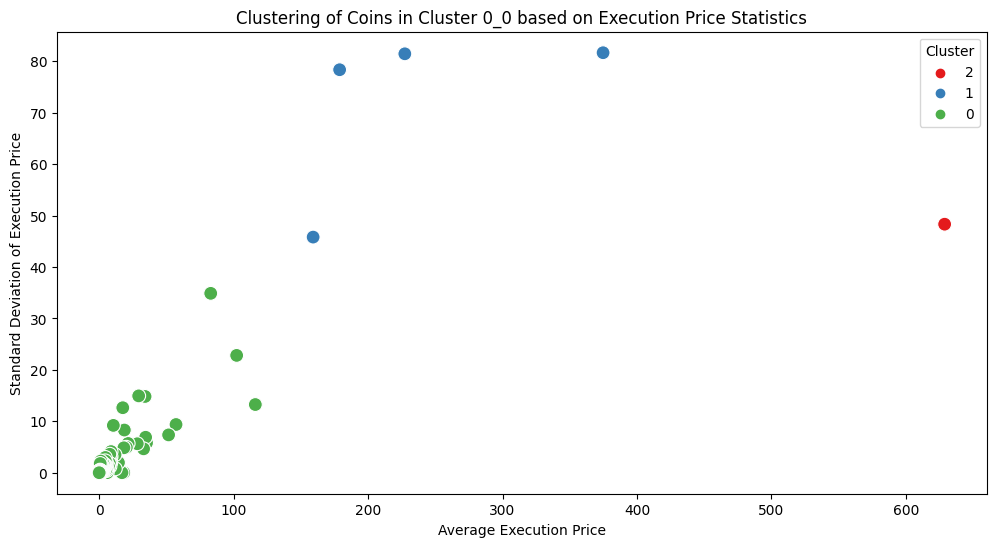

In [ ]:
# just like above create clusters within cluster 0 of coin_stats_0
kmeans_0_0 = KMeans(n_clusters=3, random_state=42)
coin_stats_0_0 = coin_stats_0[coin_stats_0['Cluster'] == '0']
coin_stats_0_0_scaled = scaler.fit_transform(coin_stats_0_0[['Average_Execution_Price', 'Min_Execution_Price', 'Max_Execution_Price', 'std_Execution_Price']])
kmeans_0_0.fit(coin_stats_0_0_scaled)
coin_stats_0_0['Cluster'] = kmeans_0_0.labels_
coin_stats_0_0['Cluster'] = coin_stats_0_0['Cluster'].astype(str)
# plot the average execution price vs standard deviation of execution price for each cluster
plt.figure(figsize=(12, 6))
sns.scatterplot(data=coin_stats_0_0, x='Average_Execution_Price', y='std_Execution_Price', hue='Cluster', palette='Set1', s=100)
plt.title('Clustering of Coins in Cluster 0_0 based on Execution Price Statistics')
plt.xlabel('Average Execution Price')
plt.ylabel('Standard Deviation of Execution Price')
plt.legend(title='Cluster')
plt.show()



In [ ]:
# create coin_df with all these distinct clusters from coin_stats and coin_stats_0 and coint_stats_0
coin_df = pd.merge(coin_stats, coin_stats_0[['Coin', 'Cluster']], on='Coin', how='outer', suffixes=('', '_0'))
coin_df = pd.merge(coin_df, coin_stats_0_0[['Coin', 'Cluster']], on='Coin', how='outer', suffixes=('', '__0'))
coin_df.head()

# create final clusters based on the clusters from coin_stats and coin_stats_0. Use concatenation of Cluster and Cluster_0
coin_df['Final_Cluster'] = coin_df['Cluster'].astype(str) + '_' + coin_df['Cluster_0'].astype(str) + '_' + coin_df['Cluster__0'].astype(str)
coin_df.Final_Cluster.value_counts()

0_0_0        235
0_0_1          4
0_1_nan        2
2_nan_nan      1
1_nan_nan      1
0_2_nan        1
0_3_nan        1
0_0_2          1
Name: Final_Cluster, dtype: int64

In [ ]:
# rename the cluster values to more meaningful names
coin_df['Coin_Cluster'] = coin_df['Final_Cluster'].replace({
    '0_0_0': 'low_price_low_volatility',
    '0_0_1': 'low_price_high_volatility',
    '0_0_2': 'low_price_medium_volatility',
    '0_1_nan': 'medium_price_low_volatility',
    '0_2_nan': 'medium_price_medium_volatility',
    '0_3_nan': 'medium_price_high_volatility',
    '1_nan_nan': 'high_price_high_volatility',
    '2_nan_nan': 'high_price_medium_volatility'
})

coin_df.Coin_Cluster.value_counts()


low_price_low_volatility          235
low_price_high_volatility           4
medium_price_low_volatility         2
high_price_medium_volatility        1
high_price_high_volatility          1
medium_price_medium_volatility      1
medium_price_high_volatility        1
low_price_medium_volatility         1
Name: Coin_Cluster, dtype: int64

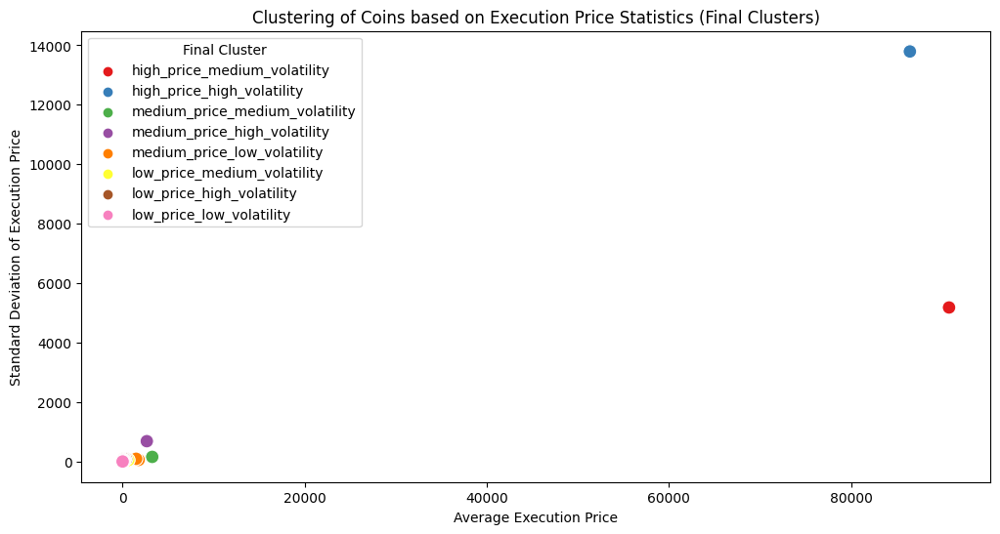

In [ ]:
# plot the average execution price vs standard deviation of execution price for each cluster
plt.figure(figsize=(12, 6))
sns.scatterplot(data=coin_df, x='Average_Execution_Price', y='std_Execution_Price', hue='Coin_Cluster', palette='Set1', s=100)
plt.title('Clustering of Coins based on Execution Price Statistics (Final Clusters)')
plt.xlabel('Average Execution Price')
plt.ylabel('Standard Deviation of Execution Price')
plt.legend(title='Final Cluster')
plt.show()

In [ ]:
# join hist_df with coin_df to get the cluster information for each coin in the historical data
hist_df = pd.merge(hist_df, coin_df[['Coin', 'Coin_Cluster']], on='Coin', how='left')
hist_df.head()

,Account,Coin,Execution Price,Size Tokens,Size USD,Side,Timestamp IST,Start Position,Direction,Closed PnL,Transaction Hash,Order ID,Crossed,Fee,Trade ID,Execution_Date,value,classification,Coin_Cluster
0,0xae5eacaf9c6b9111fd53034a602c192a04e082ed,@107,7.9769,986.87,7872.16,BUY,2024-12-02 22:50:00,0.000000,Buy,0.0,0xec09451986a1874e3a980418412fcd0201f500c95bac...,52017706630,True,0.345404,895000000000000.0,2024-12-02,80.0,Extreme Greed,low_price_low_volatility
1,0xae5eacaf9c6b9111fd53034a602c192a04e082ed,@107,7.9800,16.00,127.68,BUY,2024-12-02 22:50:00,986.524596,Buy,0.0,0xec09451986a1874e3a980418412fcd0201f500c95bac...,52017706630,True,0.005600,443000000000000.0,2024-12-02,80.0,Extreme Greed,low_price_low_volatility
2,0xae5eacaf9c6b9111fd53034a602c192a04e082ed,@107,7.9855,144.09,1150.63,BUY,2024-12-02 22:50:00,1002.518996,Buy,0.0,0xec09451986a1874e3a980418412fcd0201f500c95bac...,52017706630,True,0.050431,660000000000000.0,2024-12-02,80.0,Extreme Greed,low_price_low_volatility
3,0xae5eacaf9c6b9111fd53034a602c192a04e082ed,@107,7.9874,142.98,1142.04,BUY,2024-12-02 22:50:00,1146.558564,Buy,0.0,0xec09451986a1874e3a980418412fcd0201f500c95bac...,52017706630,True,0.050043,1080000000000000.0,2024-12-02,80.0,Extreme Greed,low_price_low_volatility
4,0xae5eacaf9c6b9111fd53034a602c192a04e082ed,@107,7.9894,8.73,69.75,BUY,2024-12-02 22:50:00,1289.488521,Buy,0.0,0xec09451986a1874e3a980418412fcd0201f500c95bac...,52017706630,True,0.003055,1050000000000000.0,2024-12-02,80.0,Extreme Greed,low_price_low_volatility


#### Categorical Columns Distribution

In [ ]:
hist_df.Side.value_counts(normalize=True)

SELL    0.513805
BUY     0.486195
Name: Side, dtype: float64

In [ ]:
hist_df.Direction.value_counts(normalize=True)

Open Long                    0.236218
Close Long                   0.230457
Open Short                   0.188146
Close Short                  0.170497
Sell                         0.094222
Buy                          0.079139
Spot Dust Conversion         0.000672
Short > Long                 0.000331
Long > Short                 0.000270
Auto-Deleveraging            0.000038
Liquidated Isolated Short    0.000005
Settlement                   0.000005
Name: Direction, dtype: float64

In [ ]:
hist_df['Transaction Hash'].value_counts(normalize=True)

0x0000000000000000000000000000000000000000000000000000000000000000    0.042760
0x8543ffeb4fdab50bfa0304222f29b702012700b5ee6b85c21ed9215e3bc8ba45    0.001411
0xb3a9e6e4f5293d501bb3041f5c49ec02018b00ecdfb8798414bcd103222f2c30    0.001169
0xa67acabfc24d0cb5d05b041f1704590204f000525423d8cded7ec70825f7b658    0.001136
0x6b313e029807198fba0f04215de94801ac001092edd85e7c214059795735b0c6    0.001056
                                                                        ...   
0xa979c467bb4e42849cff041fb3961502023400c3f3a6eb1cd6335d8cc34f0775    0.000005
0x2ed6a745fe7494e9991c041fb3961502022a006e0fc861645d728a44c71d2c7b    0.000005
0x00bbe6a9aab08b2ddc25041fb3961502022700c9e298175a902d48eeed7a9a21    0.000005
0x7ccd8894cb4342a8c7e9041fb3961401a600db2c4f0cbceac2edfb7a171e38af    0.000005
0xac77fab973c455d77a670422374d9602039800f1f78c7c3123205e2b7af37374    0.000005
Name: Transaction Hash, Length: 101184, dtype: float64

In [ ]:
hist_df['Order ID'].value_counts(normalize=True)

61636246980    0.001846
78766167752    0.001761
76557824768    0.001733
86618342363    0.001676
88683244072    0.001411
                 ...   
61591034454    0.000005
61591005843    0.000005
61590964604    0.000005
61590922939    0.000005
88288151646    0.000005
Name: Order ID, Length: 50555, dtype: float64

In [ ]:
hist_df['Trade ID'].value_counts(normalize=True)

1120000000000000.0    0.009213
1100000000000000.0    0.009189
1050000000000000.0    0.009061
1110000000000000.0    0.009005
1090000000000000.0    0.008967
                        ...   
207000000000.0        0.000005
3830000000000.0       0.000005
5470000000000.0       0.000005
6690000000000.0       0.000005
6540000000000.0       0.000005
Name: Trade ID, Length: 2810, dtype: float64

In [ ]:
hist_df.Crossed.value_counts(normalize=True)

True     0.6079
False    0.3921
Name: Crossed, dtype: float64

In [ ]:
hist_df.classification.value_counts(normalize=True)

Fear             0.292764
Greed            0.238157
Extreme Greed    0.189340
Neutral          0.178422
Extreme Fear     0.101317
Name: classification, dtype: float64

#### Numerical columns distribution

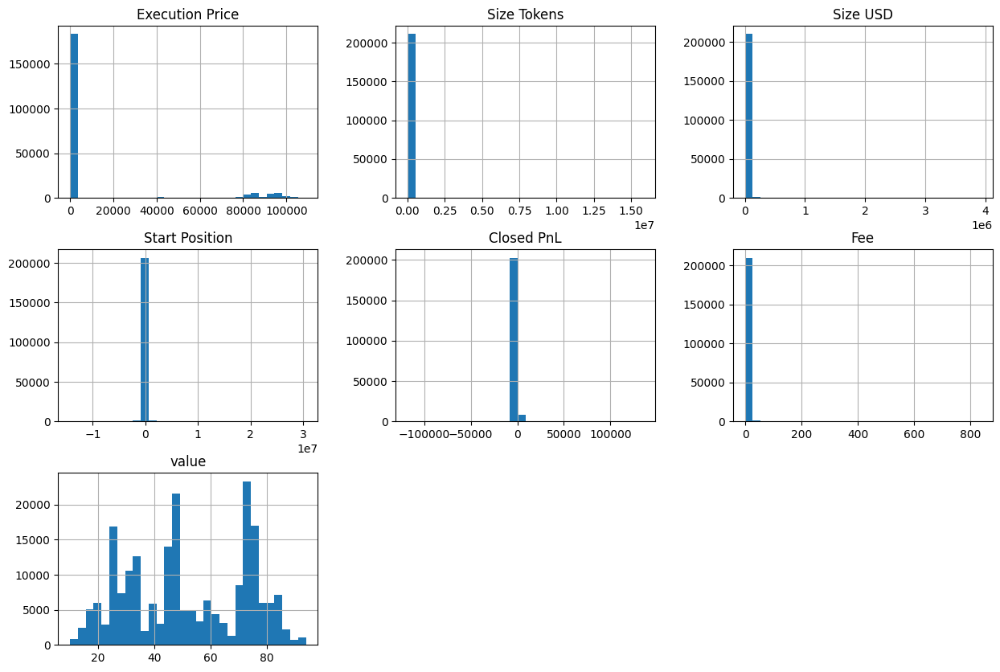

In [ ]:
# create histogram of numerical columns
numerical_cols = hist_df.select_dtypes(include=[np.number]).columns.tolist()
hist_df[numerical_cols].hist(bins=30, figsize=(15, 10), layout=(3, 3))
plt.show()

In [ ]:
hist_df.describe([0, 0.01, 0.05, 0.1, 0.25, 0.5, 0.75, 0.9, 0.95, 0.99, 1])

,Execution Price,Size Tokens,Size USD,Start Position,Closed PnL,Fee,value
count,211224.000000,2.112240e+05,2.112240e+05,2.112240e+05,211224.000000,211224.000000,211218.000000
mean,11414.723350,4.623365e+03,5.639451e+03,-2.994625e+04,48.749001,1.163967,51.649656
std,29447.654868,1.042729e+05,3.657514e+04,6.738074e+05,919.164828,6.758854,21.012784
min,0.000005,8.740000e-07,0.000000e+00,-1.433463e+07,-117990.104100,-1.175712,10.000000
0%,0.000005,8.740000e-07,0.000000e+00,-1.433463e+07,-117990.104100,-1.175712,10.000000
1%,0.012530,1.600000e-04,1.107000e+01,-1.185801e+06,-140.766890,-0.003536,15.000000
5%,0.148720,1.100000e-02,1.751150e+01,-9.289184e+04,-5.321008,0.000000,20.000000
10%,0.520000,1.175600e-01,4.018300e+01,-1.495050e+04,0.000000,0.001569,24.000000
25%,4.854700,2.940000e+00,1.937900e+02,-3.762311e+02,0.000000,0.016121,33.000000
50%,18.280000,3.200000e+01,5.970450e+02,8.472793e+01,0.000000,0.089578,49.000000


1.Execution prices and trade sizes are highly skewed, with most trades being small but a few very large trades dominating the averages.

2.Closed PnL shows that while most trades are near breakeven, a small number of very large losses and gains drive overall results.

3.Market sentiment values center around neutral (~49), with fewer trades happening during extreme fear or extreme greed phases.

In [ ]:
hist_df.columns

Index(['Account', 'Coin', 'Execution Price', 'Size Tokens', 'Size USD', 'Side',
       'Timestamp IST', 'Start Position', 'Direction', 'Closed PnL',
       'Transaction Hash', 'Order ID', 'Crossed', 'Fee', 'Trade ID',
       'Execution_Date', 'value', 'classification', 'Coin_Cluster'],
      dtype='object')

In [13]:
# summary_df = hist_df.groupby(['Account', 'Coin_Cluster', 'Execution_Date'], as_index=False).agg(
#     # first execution price
#     Execution_Price_Start = ('Timestamp IST', 'first'),
#     # last execution price
#     Execution_Price_End = ('Timestamp IST', 'last'),
#     # average execution price
#     Average_Execution_Price = ('Execution Price', 'mean'),
#     # total Size Tokens for Direaction = 'Open Long'
#     open_long_size_tokens = ('Size Tokens', lambda x: x[hist_df.Direction == 'Open Long'].sum()),
#     # total Size Tokens for Direaction = 'Open Short'
#     open_short_size_tokens = ('Size Tokens', lambda x: x[hist_df.Direction == 'Open Short'].sum()),
#     # total Size Tokens for Direaction = 'Close Long'
#     close_long_size_tokens = ('Size Tokens', lambda x: x[hist_df.Direction == 'Close Long'].sum()),
#     # total Size Tokens for Direaction = 'Close Short'
#     close_short_size_tokens = ('Size Tokens', lambda x: x[hist_df.Direction == 'Close Short'].sum()),
#     # total Size Tokens for Direaction = 'Buy'
#     buy_size_tokens = ('Size Tokens', lambda x: x[hist_df.Direction == 'Buy'].sum()),
#     # total Size Tokens for Direaction = 'Sell'
#     sell_size_tokens = ('Size Tokens', lambda x: x[hist_df.Direction == 'Sell'].sum()),
#     # total Size USD for Direaction = 'Open Long'
#     open_long_size_usd = ('Size USD', lambda x: x[hist_df.Direction == 'Open Long'].sum()),
#     # total Size USD for Direaction = 'Open Short'
#     open_short_size_usd = ('Size USD', lambda x: x[hist_df.Direction == 'Open Short'].sum()),
#     # total Size USD for Direaction = 'Close Long'
#     close_long_size_usd = ('Size USD', lambda x: x[hist_df.Direction == 'Close Long'].sum()),
#     # total Size USD for Direaction = 'Close Short'
#     close_short_size_usd = ('Size USD', lambda x: x[hist_df.Direction == 'Close Short'].sum()),
#     # total Size USD for Direaction = 'Buy'
#     buy_size_usd = ('Size USD', lambda x: x[hist_df.Direction == 'Buy'].sum()),
#     # total Size USD for Direaction = 'Sell'
#     sell_size_usd = ('Size USD', lambda x: x[hist_df.Direction == 'Sell'].sum()),
#     # max value
#     value = ('value', 'max'),
#     # first classification
#     classification = ('classification', 'first'),
#     # total close pnl
#     close_pnl = ('Closed PnL', 'sum'),
#     # min Timestamp IST for Direaction = 'Open Long'
#     open_long_min_datetime = ('Timestamp IST', lambda x: x[hist_df.Direction == 'Open Long'].min() if not x[hist_df.Direction == 'Open Long'].empty else pd.NaT),
#     # max Timestamp IST for Direaction = 'Close Long'
#     close_long_max_datetime = ('Timestamp IST', lambda x: x[hist_df.Direction == 'Close Long'].max() if not x[hist_df.Direction == 'Close Long'].empty else pd.NaT),
#     # min Timestamp IST for Direaction = 'Open Short'
#     open_short_min_datetime = ('Timestamp IST', lambda x: x[hist_df.Direction == 'Open Short'].min() if not x[hist_df.Direction == 'Open Short'].empty else pd.NaT),
#     # max Timestamp IST for Direaction = 'Close Short'
#     close_short_max_datetime = ('Timestamp IST', lambda x: x[hist_df.Direction == 'Close Short'].max() if not x[hist_df.Direction == 'Close Short'].empty else pd.NaT),
#     # min Timestamp IST for Direaction = 'Sell'
#     sell_min_datetime = ('Timestamp IST', lambda x: x[hist_df.Direction == 'Sell'].min() if not x[hist_df.Direction == 'Sell'].empty else pd.NaT),
#     # min Timestamp IST for Direaction = 'Buy'
#     buy_min_datetime = ('Timestamp IST', lambda x: x[hist_df.Direction == 'Buy'].min() if not x[hist_df.Direction == 'Buy'].empty else pd.NaT)
# )

In [14]:
# summary_df.to_csv('summary_df.csv', index=False)
summary_df = pd.read_csv(CSV_DIR+'/summary_df.csv')
summary_df.head()

,Account,Coin_Cluster,Execution_Date,Execution_Price_Start,Execution_Price_End,Average_Execution_Price,open_long_size_tokens,open_short_size_tokens,close_long_size_tokens,close_short_size_tokens,buy_size_tokens,sell_size_tokens,open_long_size_usd,open_short_size_usd,close_long_size_usd,close_short_size_usd,buy_size_usd,sell_size_usd,value,classification,close_pnl,open_long_min_datetime,close_long_max_datetime,open_short_min_datetime,close_short_max_datetime,sell_min_datetime,buy_min_datetime,Price_Diff
0,0x083384f897ee0f19899168e3b1bec365f52a9012,low_price_high_volatility,2024-11-17,2024-11-17 09:58:00,2024-11-17 10:00:00,233.945345,0.0,1000.00,0.0,0.0,0.0,0.0,0.0,233813.19,0.0,0.00,0.0,0.0,90.0,Extreme Greed,0.000000,NaN,NaN,2024-11-17 09:58:00,NaN,NaN,NaN,0.033333
1,0x083384f897ee0f19899168e3b1bec365f52a9012,low_price_high_volatility,2024-11-26,2024-11-26 13:47:00,2024-11-26 14:35:00,232.921111,0.0,1000.00,0.0,1000.0,0.0,0.0,0.0,233489.99,0.0,232210.01,0.0,0.0,79.0,Extreme Greed,1603.100000,NaN,NaN,2024-11-26 14:34:00,2024-11-26 13:47:00,NaN,NaN,0.800000
2,0x083384f897ee0f19899168e3b1bec365f52a9012,low_price_high_volatility,2024-11-28,2024-11-28 00:10:00,2024-11-28 00:10:00,239.620000,0.0,0.00,0.0,1000.0,0.0,0.0,0.0,0.00,0.0,239619.99,0.0,0.0,77.0,Extreme Greed,-6130.000000,NaN,NaN,NaN,2024-11-28 00:10:00,NaN,NaN,0.000000
3,0x083384f897ee0f19899168e3b1bec365f52a9012,low_price_high_volatility,2025-01-19,2025-01-19 13:57:00,2025-01-19 14:48:00,272.330280,0.0,9934.88,0.0,2534.0,0.0,0.0,0.0,2716012.75,0.0,686980.98,0.0,0.0,77.0,Extreme Greed,-428.204200,NaN,NaN,2025-01-19 13:57:00,2025-01-19 14:10:00,NaN,NaN,0.850000
4,0x083384f897ee0f19899168e3b1bec365f52a9012,low_price_high_volatility,2025-01-20,2025-01-20 08:24:00,2025-01-20 10:34:00,239.154706,0.0,1000.00,0.0,1000.0,0.0,0.0,0.0,245429.99,0.0,234000.00,0.0,0.0,76.0,Extreme Greed,40218.599998,NaN,NaN,2025-01-20 10:34:00,2025-01-20 08:24:00,NaN,NaN,2.166667


In [ ]:
# aggregate summary_df to Coin_Cluster and Execution_Date
agg_summary_df = summary_df.groupby(['Coin_Cluster', 'Execution_Date'], as_index=False).agg(
    # first execution price
    Execution_Price_Start = ('Execution_Price_Start', 'first'),
    # last execution price
    Execution_Price_End = ('Execution_Price_End', 'last'),
    # average execution price
    Average_Execution_Price = ('Average_Execution_Price', 'mean'),
    # total Size Tokens for Direaction = 'Open Long'
    open_long_size_tokens = ('open_long_size_tokens', 'sum'),
    # total Size Tokens for Direaction = 'Open Short'
    open_short_size_tokens = ('open_short_size_tokens', 'sum'),
    # total Size Tokens for Direaction = 'Close Long'
    close_long_size_tokens = ('close_long_size_tokens', 'sum'),
    # total Size Tokens for Direaction = 'Close Short'
    close_short_size_tokens = ('close_short_size_tokens', 'sum'),
    # total Size Tokens for Direaction = 'Buy'
    buy_size_tokens = ('buy_size_tokens', 'sum'),
    # total Size Tokens for Direaction = 'Sell'
    sell_size_tokens = ('sell_size_tokens', 'sum'),
    # total Size USD for Direaction = 'Open Long'
    open_long_size_usd = ('open_long_size_usd', 'sum'),
    # total Size USD for Direaction = 'Open Short'
    open_short_size_usd = ('open_short_size_usd', 'sum'),
    # total Size USD for Direaction = 'Close Long'
    close_long_size_usd = ('close_long_size_usd', 'sum'),
    # total Size USD for Direaction = 'Close Short'
    close_short_size_usd = ('close_short_size_usd', 'sum'),
    # total Size USD for Direaction = 'Buy'
    buy_size_usd = ('buy_size_usd', 'sum'),
    # total Size USD for Direaction = 'Sell'
    sell_size_usd = ('sell_size_usd', 'sum'),
    # max value
    value = ('value', 'max'),
    # first classification
    classification = ('classification', lambda x: x.mode()[0] if not x.mode().empty else np.nan),
    # total close pnl
    close_pnl = ('close_pnl', 'sum')
)
agg_summary_df.head()

,Coin_Cluster,Execution_Date,Execution_Price_Start,Execution_Price_End,Average_Execution_Price,open_long_size_tokens,open_short_size_tokens,close_long_size_tokens,close_short_size_tokens,buy_size_tokens,sell_size_tokens,open_long_size_usd,open_short_size_usd,close_long_size_usd,close_short_size_usd,buy_size_usd,sell_size_usd,value,classification,close_pnl
0,high_price_high_volatility,2023-12-05,2023-12-05 03:11:00,2023-12-05 03:11:00,41866.500000,0.00000,0.59711,0.00000,0.00000,0.0,0.0,0.00,24998.62,0.00,0.00,0.0,0.0,75.0,Extreme Greed,0.000000
1,high_price_high_volatility,2023-12-14,2023-12-14 01:20:00,2023-12-14 01:20:00,42748.500000,0.00000,0.00000,0.00000,0.59711,0.0,0.0,0.00,0.00,0.00,25525.84,0.0,0.0,72.0,Greed,-527.233130
2,high_price_high_volatility,2023-12-22,2023-12-22 02:21:00,2023-12-22 09:49:00,43841.714286,0.67455,0.00000,0.67455,0.00000,0.0,0.0,29537.19,0.00,29678.96,0.00,0.0,0.0,74.0,Greed,141.832675
3,high_price_high_volatility,2023-12-24,2023-12-24 02:40:00,2023-12-24 22:05:00,43697.500000,1.14452,1.14452,1.14452,1.14452,0.0,0.0,50020.02,50009.92,50010.41,50006.05,0.0,0.0,71.0,Greed,-5.698476
4,high_price_high_volatility,2023-12-29,2023-12-29 20:44:00,2023-12-29 20:45:00,42843.000000,0.00000,0.73639,0.00000,0.73639,0.0,0.0,0.00,31567.57,0.00,31543.26,0.0,0.0,65.0,Greed,24.302050


### Execution Price vs Coin Cluster Trend

C:\Users\tassl\AppData\Local\Temp\ipykernel_5424\1675438668.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  sns.lineplot(data=agg_summary_df[summary_df.Coin_Cluster == i], x='Execution_Date', y='Average_Execution_Price', label='Average Execution Price', marker='o')
C:\Users\tassl\AppData\Local\Temp\ipykernel_5424\1675438668.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  sns.lineplot(data=agg_summary_df[summary_df.Coin_Cluster == i], x='Execution_Date', y='value', label='value', marker='o', color='orange')


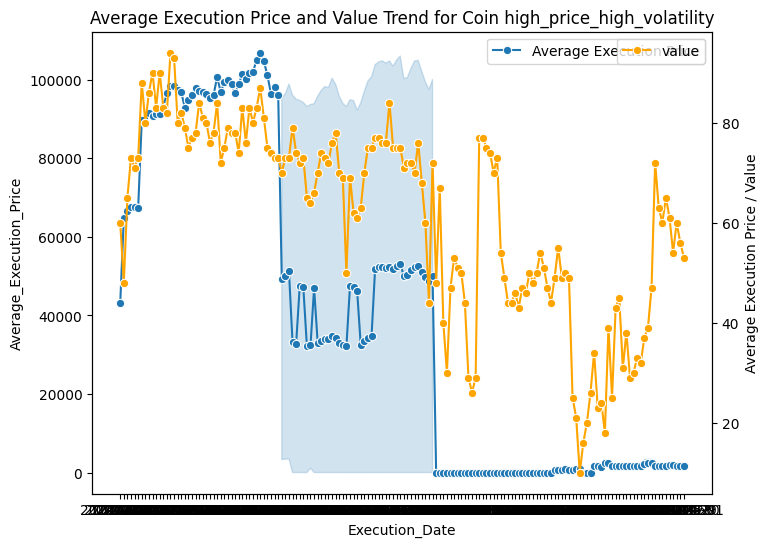

C:\Users\tassl\AppData\Local\Temp\ipykernel_5424\1675438668.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  sns.lineplot(data=agg_summary_df[summary_df.Coin_Cluster == i], x='Execution_Date', y='Average_Execution_Price', label='Average Execution Price', marker='o')
C:\Users\tassl\AppData\Local\Temp\ipykernel_5424\1675438668.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  sns.lineplot(data=agg_summary_df[summary_df.Coin_Cluster == i], x='Execution_Date', y='value', label='value', marker='o', color='orange')


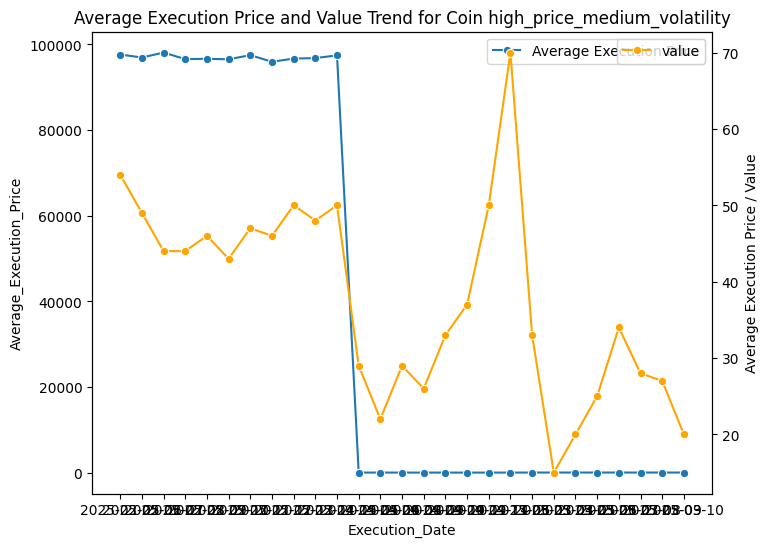

C:\Users\tassl\AppData\Local\Temp\ipykernel_5424\1675438668.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  sns.lineplot(data=agg_summary_df[summary_df.Coin_Cluster == i], x='Execution_Date', y='Average_Execution_Price', label='Average Execution Price', marker='o')
C:\Users\tassl\AppData\Local\Temp\ipykernel_5424\1675438668.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  sns.lineplot(data=agg_summary_df[summary_df.Coin_Cluster == i], x='Execution_Date', y='value', label='value', marker='o', color='orange')


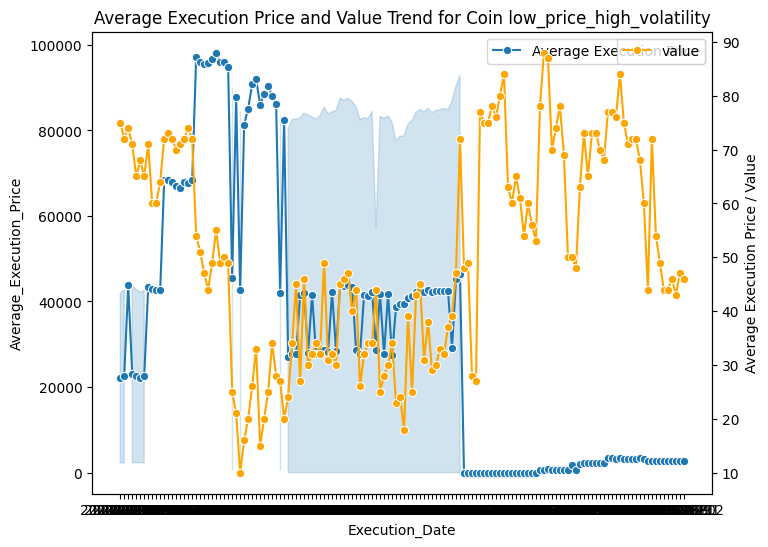

C:\Users\tassl\AppData\Local\Temp\ipykernel_5424\1675438668.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  sns.lineplot(data=agg_summary_df[summary_df.Coin_Cluster == i], x='Execution_Date', y='Average_Execution_Price', label='Average Execution Price', marker='o')
C:\Users\tassl\AppData\Local\Temp\ipykernel_5424\1675438668.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  sns.lineplot(data=agg_summary_df[summary_df.Coin_Cluster == i], x='Execution_Date', y='value', label='value', marker='o', color='orange')


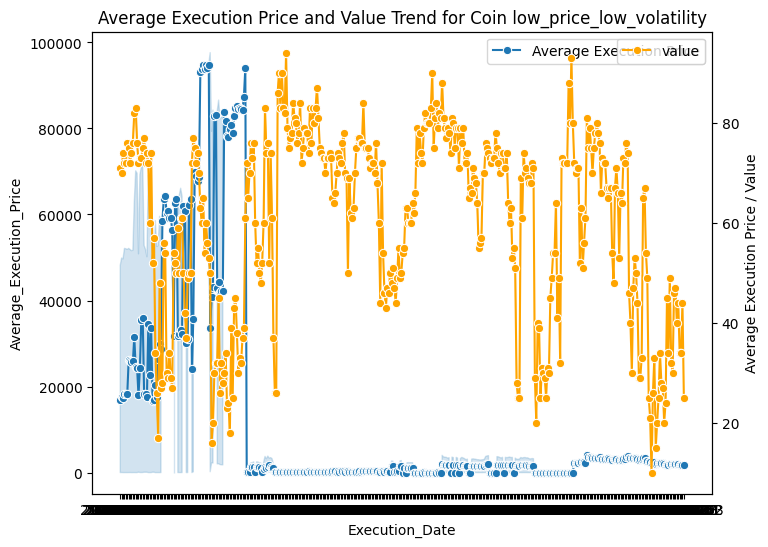

C:\Users\tassl\AppData\Local\Temp\ipykernel_5424\1675438668.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  sns.lineplot(data=agg_summary_df[summary_df.Coin_Cluster == i], x='Execution_Date', y='Average_Execution_Price', label='Average Execution Price', marker='o')
C:\Users\tassl\AppData\Local\Temp\ipykernel_5424\1675438668.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  sns.lineplot(data=agg_summary_df[summary_df.Coin_Cluster == i], x='Execution_Date', y='value', label='value', marker='o', color='orange')


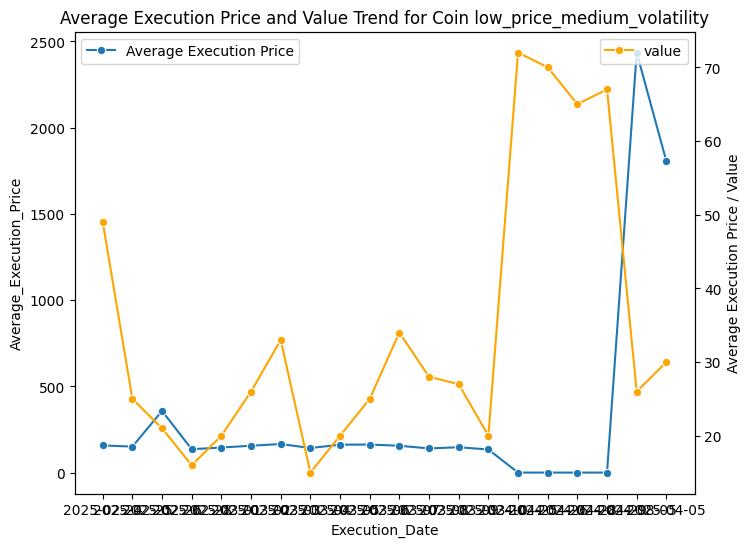

C:\Users\tassl\AppData\Local\Temp\ipykernel_5424\1675438668.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  sns.lineplot(data=agg_summary_df[summary_df.Coin_Cluster == i], x='Execution_Date', y='Average_Execution_Price', label='Average Execution Price', marker='o')
C:\Users\tassl\AppData\Local\Temp\ipykernel_5424\1675438668.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  sns.lineplot(data=agg_summary_df[summary_df.Coin_Cluster == i], x='Execution_Date', y='value', label='value', marker='o', color='orange')


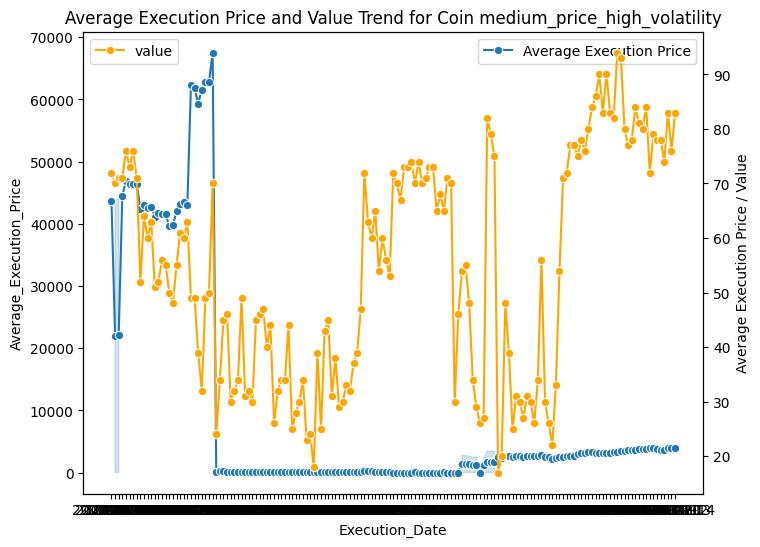

C:\Users\tassl\AppData\Local\Temp\ipykernel_5424\1675438668.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  sns.lineplot(data=agg_summary_df[summary_df.Coin_Cluster == i], x='Execution_Date', y='Average_Execution_Price', label='Average Execution Price', marker='o')
C:\Users\tassl\AppData\Local\Temp\ipykernel_5424\1675438668.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  sns.lineplot(data=agg_summary_df[summary_df.Coin_Cluster == i], x='Execution_Date', y='value', label='value', marker='o', color='orange')


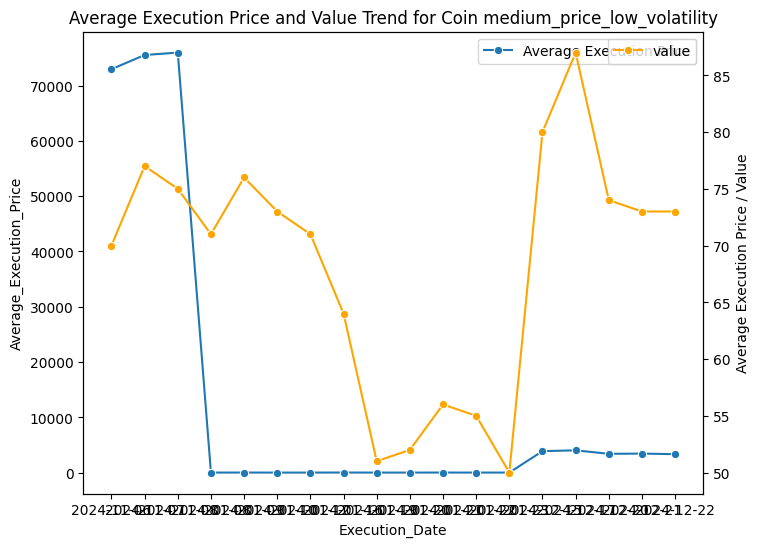

C:\Users\tassl\AppData\Local\Temp\ipykernel_5424\1675438668.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  sns.lineplot(data=agg_summary_df[summary_df.Coin_Cluster == i], x='Execution_Date', y='Average_Execution_Price', label='Average Execution Price', marker='o')
C:\Users\tassl\AppData\Local\Temp\ipykernel_5424\1675438668.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  sns.lineplot(data=agg_summary_df[summary_df.Coin_Cluster == i], x='Execution_Date', y='value', label='value', marker='o', color='orange')


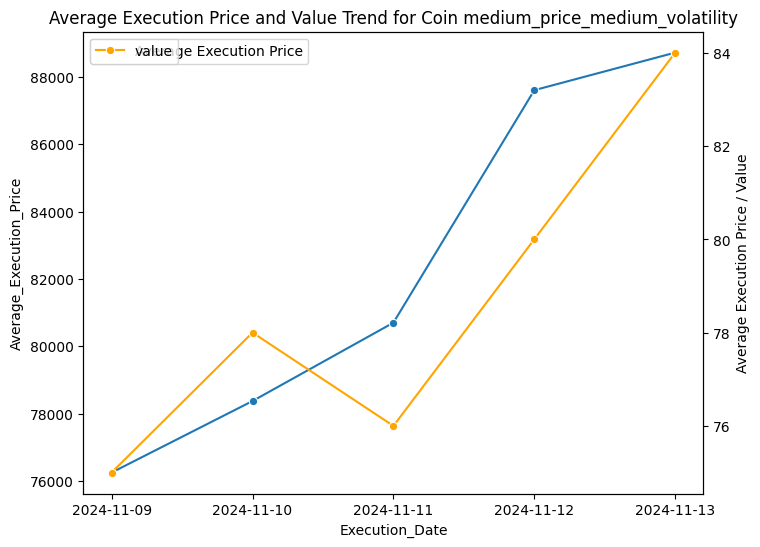

In [ ]:
# plot the average execution price & value over time for each coin cluster
for i in agg_summary_df.Coin_Cluster.unique():
    plt.figure(figsize=(8, 6))
    sns.lineplot(data=agg_summary_df[summary_df.Coin_Cluster == i], x='Execution_Date', y='Average_Execution_Price', label='Average Execution Price', marker='o')
    plt.twinx()
    sns.lineplot(data=agg_summary_df[summary_df.Coin_Cluster == i], x='Execution_Date', y='value', label='value', marker='o', color='orange')
    plt.title(f'Average Execution Price and Value Trend for Coin {i}')
    plt.xlabel('Execution Date')
    plt.xticks(rotation=45)
    plt.ylabel('Average Execution Price / Value')
    plt.legend()
    plt.show()

1.High-price, high-volatility coins show strong fluctuations in execution price that loosely track sentiment spikes, indicating traders chase price momentum when greed rises.

2.Medium- and low-price coins with high volatility experience sharp drops in execution price even when sentiment remains elevated, suggesting panic selling during volatility shocks regardless of sentiment.

3.Low-volatility groups (both high and medium price) have flatter execution price lines while sentiment oscillates, showing that sentiment changes have less impact on stable assets.

4.Across groups, sentiment value tends to rise before or during execution price rebounds, hinting at a lag where sentiment recovery can signal trader confidence returning.

5.Sudden execution price crashes often coincide with sentiment dipping below neutral, reflecting fear-driven exits by traders.

6.Overall, high-volatility assets are sentiment-sensitive, while low-volatility assets act as safer plays with execution price less reactive to fear or greed cycles.

In [ ]:
summary_df.columns

Index(['Account', 'Coin_Cluster', 'Execution_Date', 'Execution_Price_Start',
       'Execution_Price_End', 'Average_Execution_Price',
       'open_long_size_tokens', 'open_short_size_tokens',
       'close_long_size_tokens', 'close_short_size_tokens', 'buy_size_tokens',
       'sell_size_tokens', 'open_long_size_usd', 'open_short_size_usd',
       'close_long_size_usd', 'close_short_size_usd', 'buy_size_usd',
       'sell_size_usd', 'value', 'classification', 'close_pnl',
       'open_long_min_datetime', 'close_long_max_datetime',
       'open_short_min_datetime', 'close_short_max_datetime',
       'sell_min_datetime', 'buy_min_datetime', 'Price_Diff'],
      dtype='object')

In [ ]:
summary_df.describe([0,0.01,0.05,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,0.95,0.99,1]).T

,count,mean,std,min,0%,1%,5%,10%,20%,30%,40%,50%,60%,70%,80%,90%,95%,99%,100%,max
Average_Execution_Price,3439.0,18089.391539,34963.149632,0.000005,0.000005,0.006352,0.232867,0.699690,2.664349,8.447180,16.082692,26.679043,223.846171,2488.201754,43530.897375,87737.823913,96305.382418,1.018535e+05,1.071098e+05,1.071098e+05
open_long_size_tokens,3439.0,75094.934746,860472.710234,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.298132,5.190204,157.134000,8350.820000,55536.410000,1.453854e+06,3.053689e+07,3.053689e+07
open_short_size_tokens,3439.0,63502.613515,824365.055150,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.039818,8.432040,1340.800000,12015.420000,70585.933000,1.097873e+06,2.463045e+07,2.463045e+07
close_long_size_tokens,3439.0,74436.734101,811384.617991,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.538452,110.508000,7984.998000,53892.960000,1.543030e+06,2.491694e+07,2.491694e+07
close_short_size_tokens,3439.0,62743.888871,864583.196751,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.200858,322.270000,8863.936000,48044.187000,1.220156e+06,3.162592e+07,3.162592e+07
buy_size_tokens,3439.0,4047.215862,40548.107330,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,642.040000,4043.475000,8.728995e+04,1.035714e+06,1.035714e+06
sell_size_tokens,3439.0,3246.986755,61371.863979,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,104.772000,2502.000000,4.911016e+04,3.333526e+06,3.333526e+06
open_long_size_usd,3439.0,110547.087790,752379.831881,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,999.258000,6955.896000,36517.618000,132784.542000,315696.692000,1.911866e+06,1.582362e+07,1.582362e+07
open_short_size_usd,3439.0,53935.697174,374215.394839,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,249.880000,2751.932000,18914.112000,76780.754000,172382.723000,9.988487e+05,1.244323e+07,1.244323e+07
close_long_size_usd,3439.0,111140.810960,842146.858482,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2920.148000,25145.578000,120960.198000,311807.222000,1.730269e+06,1.891534e+07,1.891534e+07


In [ ]:
agg_summary_df.columns

Index(['Coin_Cluster', 'Execution_Date', 'Execution_Price_Start',
       'Execution_Price_End', 'Average_Execution_Price',
       'open_long_size_tokens', 'open_short_size_tokens',
       'close_long_size_tokens', 'close_short_size_tokens', 'buy_size_tokens',
       'sell_size_tokens', 'open_long_size_usd', 'open_short_size_usd',
       'close_long_size_usd', 'close_short_size_usd', 'buy_size_usd',
       'sell_size_usd', 'value', 'classification', 'close_pnl'],
      dtype='object')

### Open Long Size Tokens vs Coin Cluster Trend

In [ ]:
agg_summary_df.pivot_table(index='Coin_Cluster', values='open_long_size_tokens', aggfunc='mean').fillna(0)

,open_long_size_tokens
Coin_Cluster,
high_price_high_volatility,9.403218
high_price_medium_volatility,0.000000
low_price_high_volatility,1722.357973
low_price_low_volatility,627545.225998
low_price_medium_volatility,10.908786
medium_price_high_volatility,31.866480
medium_price_low_volatility,0.000000
medium_price_medium_volatility,0.000000


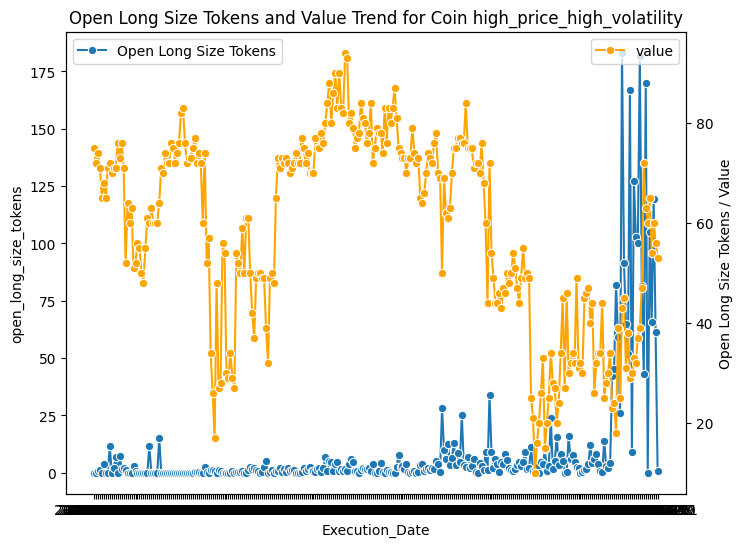

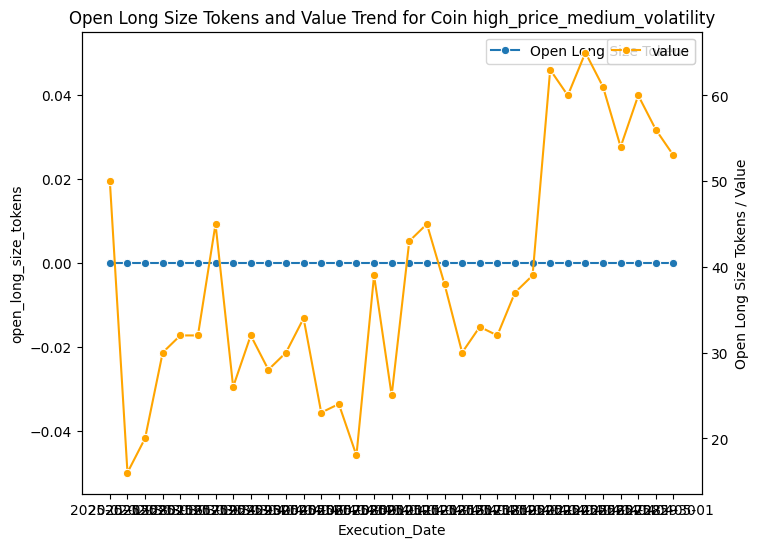

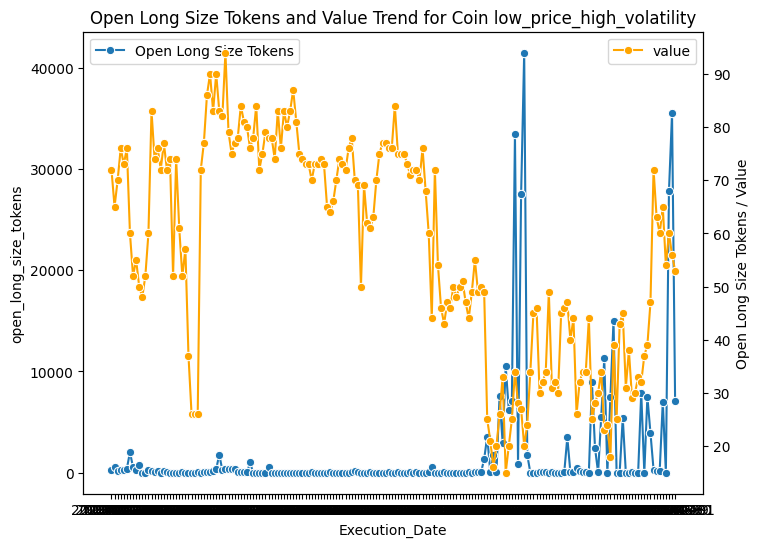

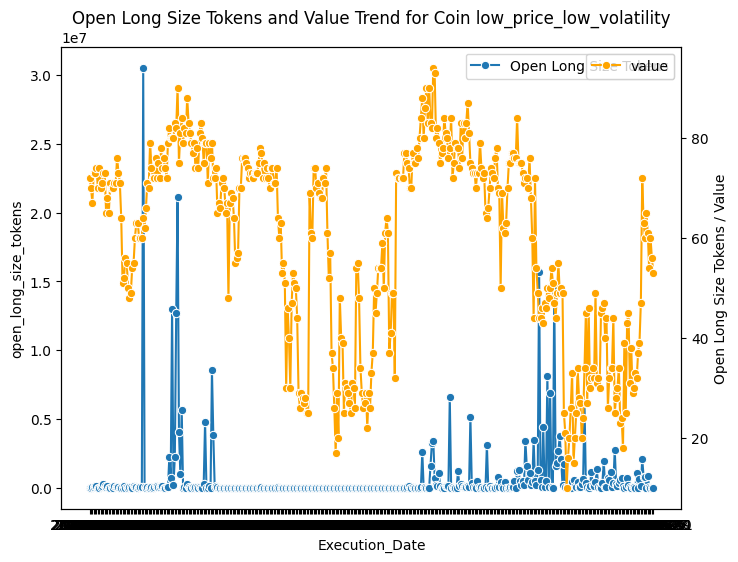

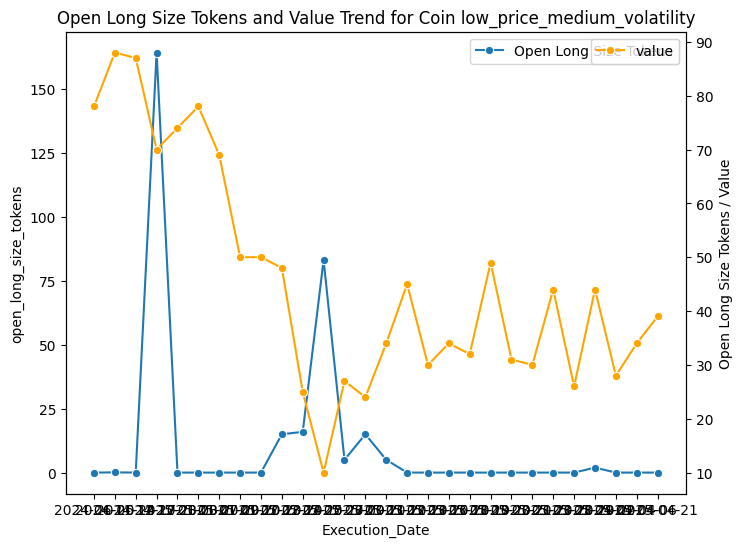

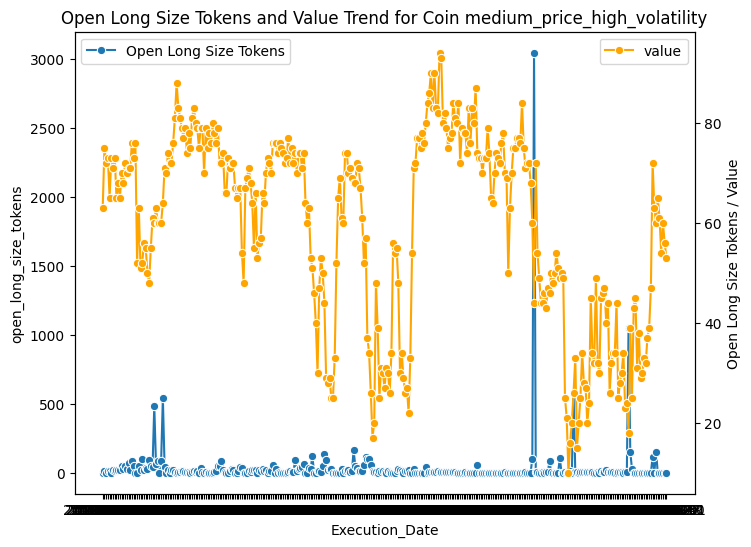

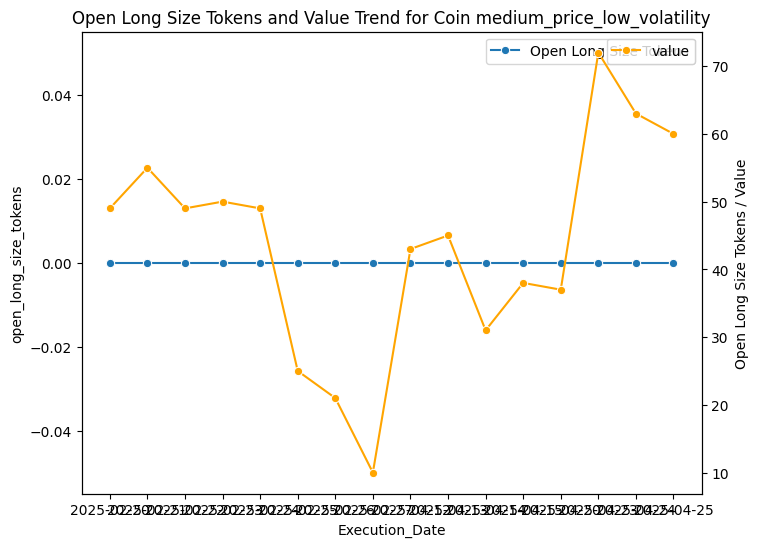

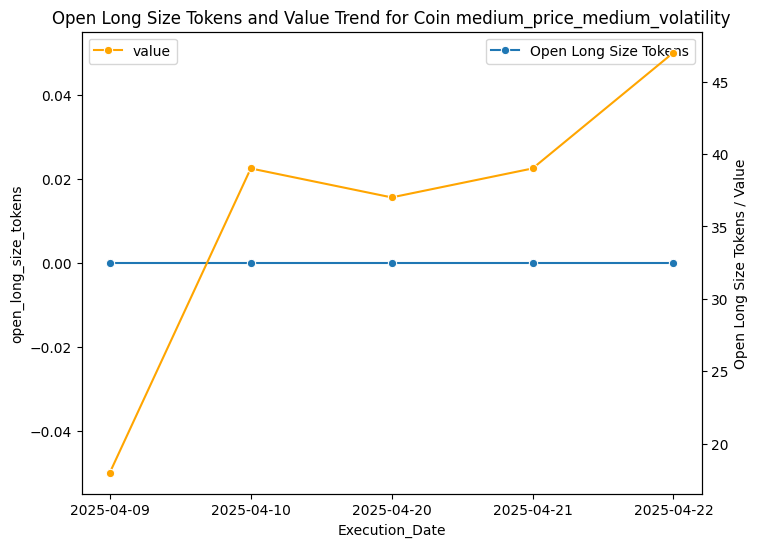

In [ ]:
# plot the open_long_size_tokens & value over time for each coin cluster
for i in agg_summary_df.Coin_Cluster.unique():
    plt.figure(figsize=(8, 6))
    sns.lineplot(data=agg_summary_df[agg_summary_df.Coin_Cluster == i], x='Execution_Date', y='open_long_size_tokens', label='Open Long Size Tokens', marker='o')
    plt.twinx()
    sns.lineplot(data=agg_summary_df[agg_summary_df.Coin_Cluster == i], x='Execution_Date', y='value', label='value', marker='o', color='orange')
    plt.title(f'Open Long Size Tokens and Value Trend for Coin {i}')
    plt.xlabel('Execution Date')
    plt.xticks(rotation=90)
    plt.ylabel('Open Long Size Tokens')
    plt.legend()
    plt.show()

1.High-price coins (high volatility) show bursts of long positions mainly during higher sentiment phases, suggesting traders open larger longs when optimism (Greed) is strong.

2.High-price coins (medium volatility) show almost no significant long activity, meaning sentiment swings don’t trigger much leverage or long exposure in these assets.

3.Low-price, high-volatility coins exhibit sudden spikes in long size during both high and falling sentiment, implying speculative traders try to capture quick moves but often in unstable conditions.

4.Low-price, low-volatility coins attract the largest long sizes overall, with sustained spikes even when sentiment dips, showing traders use them for safer long exposure relative to market mood.

5.Medium-price, high-volatility coins also show large jumps in long positions aligned with sentiment increases, reinforcing that high-volatility coins are sentiment-sensitive.

6.Medium- and low-volatility categories (especially medium price/low vol) remain flat or muted in long size, meaning sentiment has less influence and traders prefer stability here.

### Open Short Size Tokens vs Coin Cluster Trend

In [ ]:
# pivot table of agg_summary_df with index as Coin_Cluster and values as open_short_size_tokens with mean as aggregation function and fillna with 0
agg_summary_df.pivot_table(index='Coin_Cluster', values='open_short_size_tokens', aggfunc='mean').fillna(0)

,open_short_size_tokens
Coin_Cluster,
high_price_high_volatility,3.735854
high_price_medium_volatility,0.000000
low_price_high_volatility,741.625424
low_price_low_volatility,530986.372384
low_price_medium_volatility,0.608929
medium_price_high_volatility,36.667408
medium_price_low_volatility,0.675056
medium_price_medium_volatility,93.973600


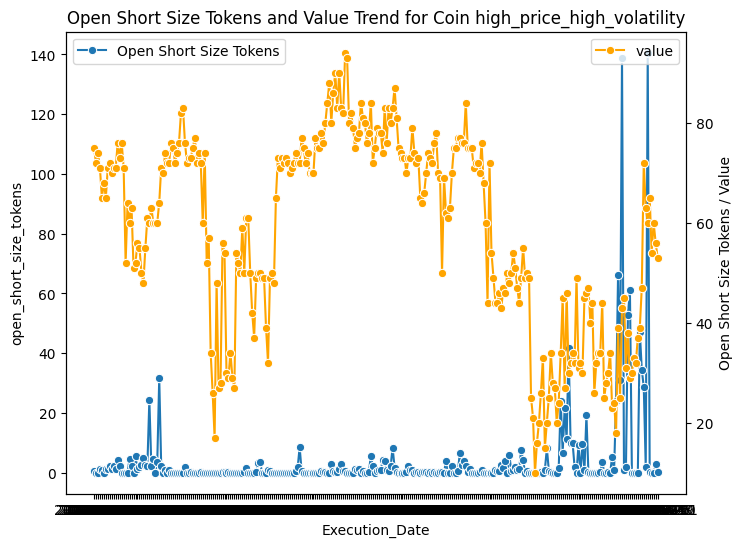

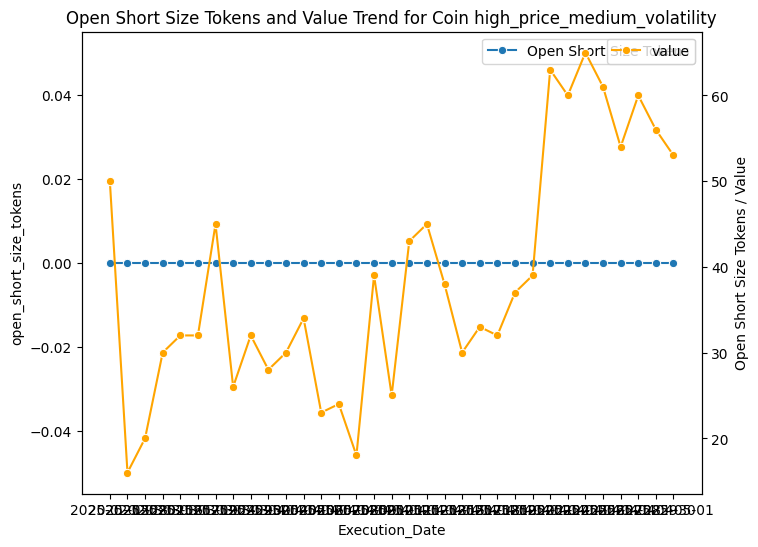

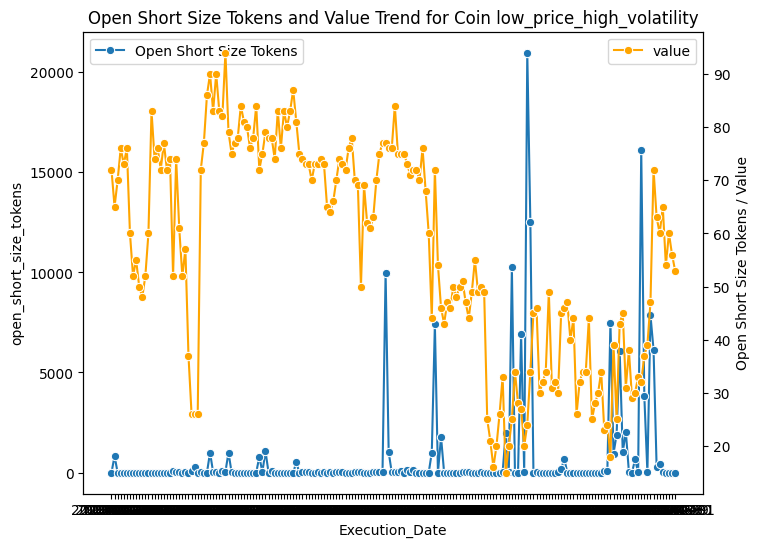

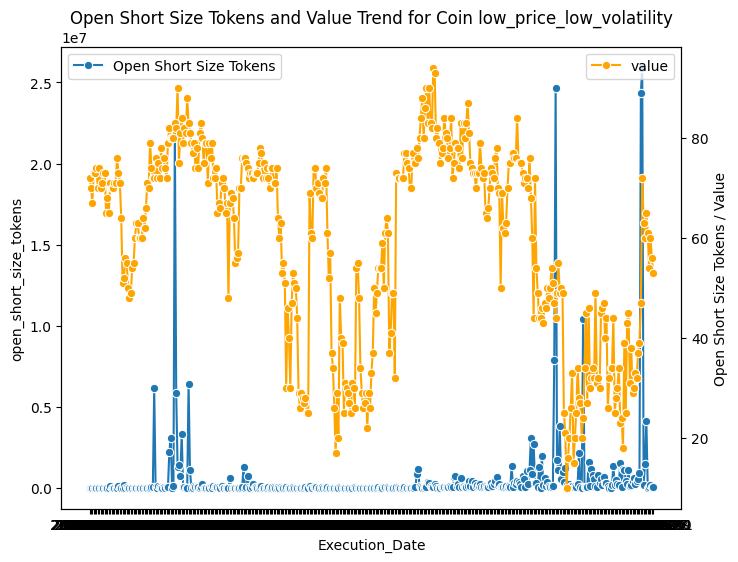

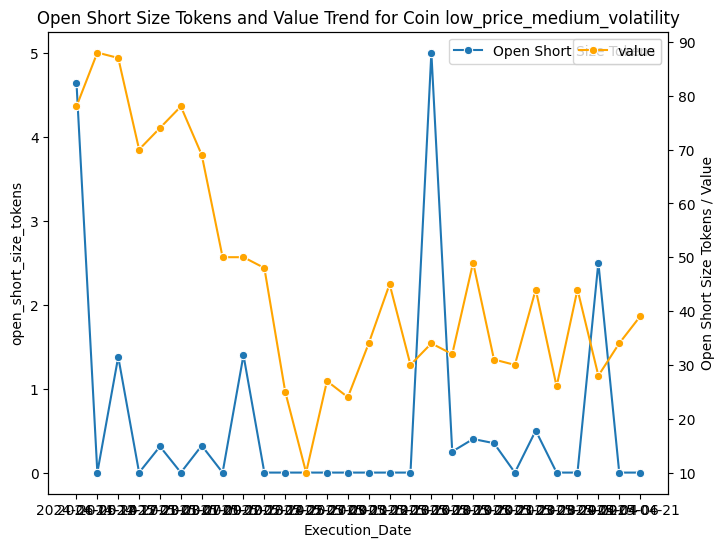

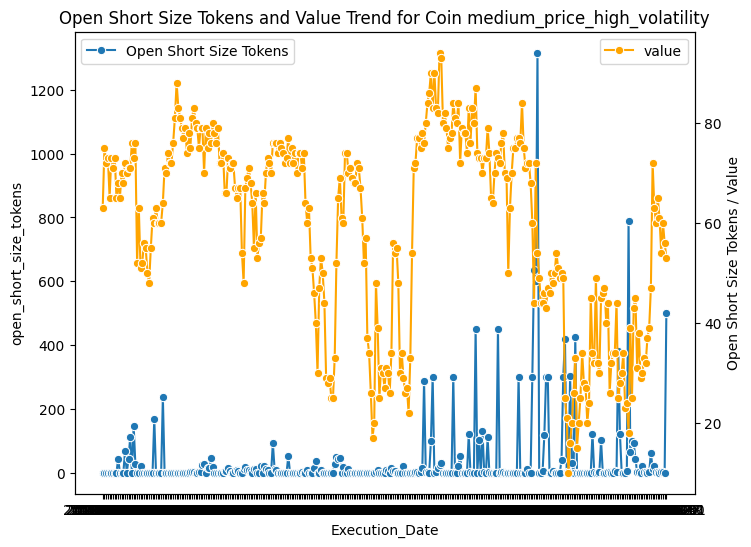

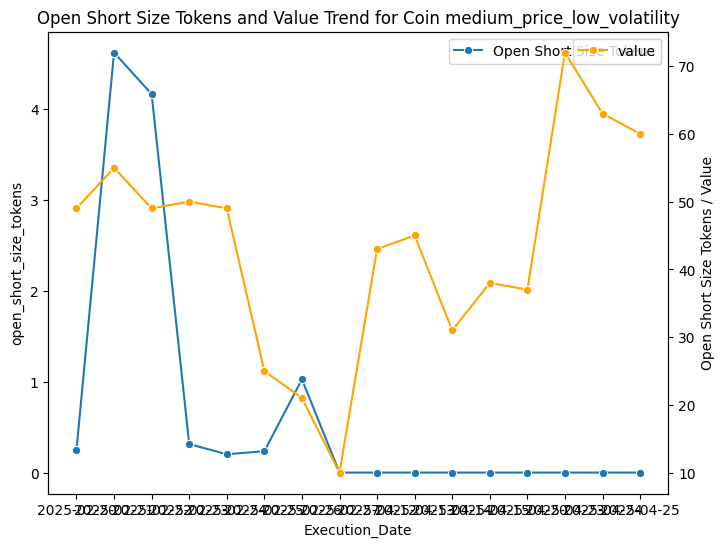

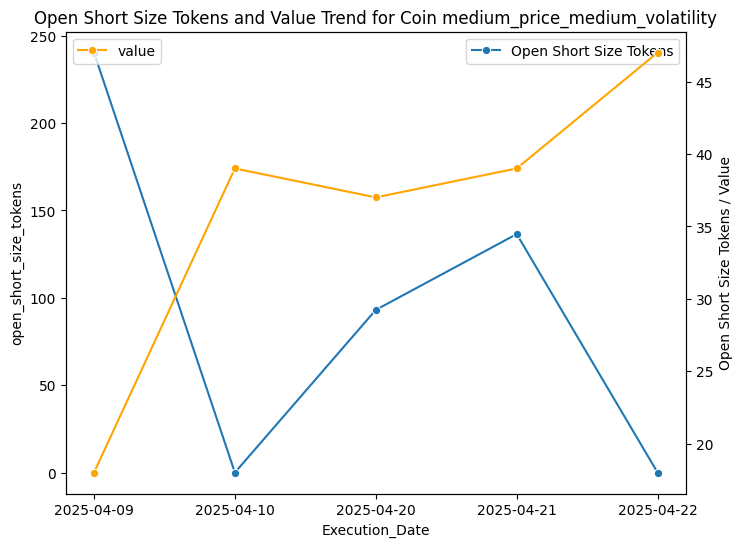

In [ ]:
# plot the open_short_size_tokens & value over time for each coin cluster
for i in agg_summary_df.Coin_Cluster.unique():
    plt.figure(figsize=(8, 6))
    sns.lineplot(data=agg_summary_df[agg_summary_df.Coin_Cluster == i], x='Execution_Date', y='open_short_size_tokens', label='Open Short Size Tokens', marker='o')
    plt.twinx()
    sns.lineplot(data=agg_summary_df[agg_summary_df.Coin_Cluster == i], x='Execution_Date', y='value', label='value', marker='o', color='orange')
    plt.title(f'Open Short Size Tokens and Value Trend for Coin {i}')
    plt.xlabel('Execution Date')
    plt.xticks(rotation=90)
    plt.ylabel('Open Short Size Tokens')
    plt.legend()
    plt.show()

1.High-price, high-volatility coins see spikes in short positions mainly when sentiment weakens, showing traders use shorts as a hedge against falling confidence.

2.High-price, medium-volatility coins remain flat with almost no short activity, meaning traders are less inclined to short stable high-value assets.

3.Low-price, high-volatility coins experience sudden jumps in short size during sentiment dips, suggesting speculative traders aggressively bet against weaker assets under fear.

4.Low-price, low-volatility coins attract very large short volumes, especially when sentiment is falling, reflecting their popularity for leveraged short plays in downturns.

5.Medium-price, high-volatility coins show consistent shorting aligned with sentiment drops, highlighting that fear drives bearish positioning in volatile assets.

6.Medium- and low-volatility categories (medium price/low vol) display minimal or irregular short activity, reinforcing that stable assets are less sentiment-driven in short strategies.

### Buy Size Tokens vs Coin Cluster Trend

In [ ]:
# pivot table of agg_summary_df with index as Coin_Cluster and values as buy_size_tokens with mean as aggregation function and fillna with 0
agg_summary_df.pivot_table(index='Coin_Cluster', values='buy_size_tokens', aggfunc='mean').fillna(0)

,buy_size_tokens
Coin_Cluster,
high_price_high_volatility,0.000000
high_price_medium_volatility,0.494205
low_price_high_volatility,0.062011
low_price_low_volatility,33864.556813
low_price_medium_volatility,0.000000
medium_price_high_volatility,0.000000
medium_price_low_volatility,0.923687
medium_price_medium_volatility,0.000000


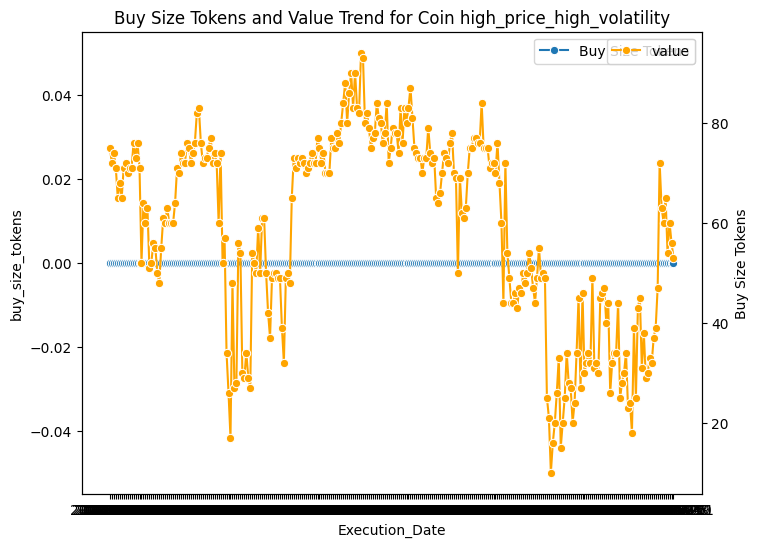

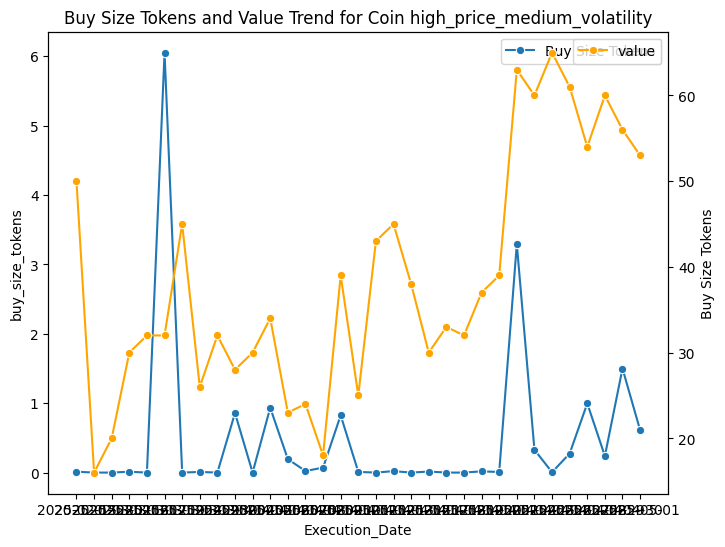

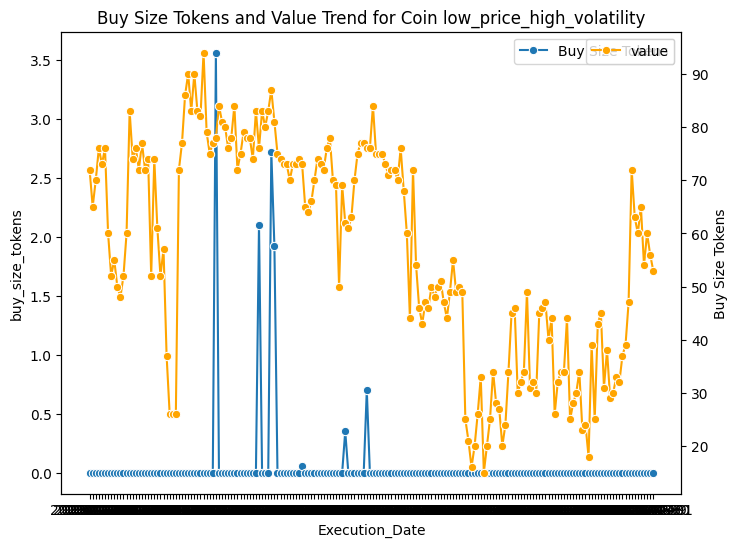

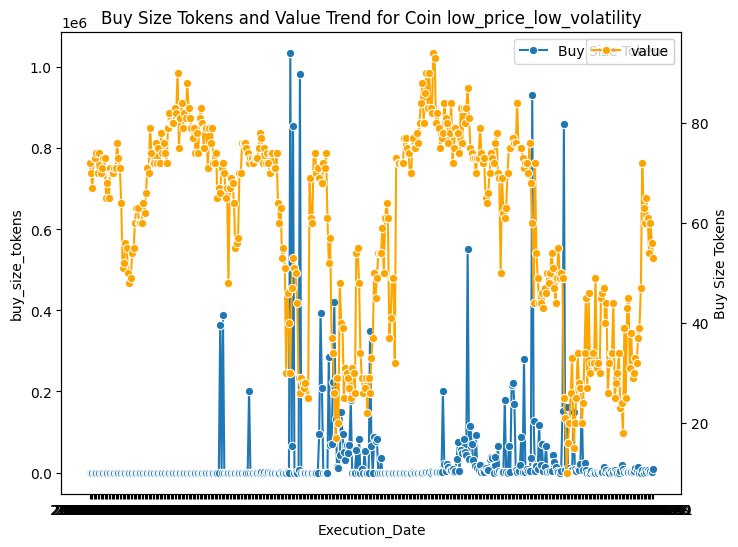

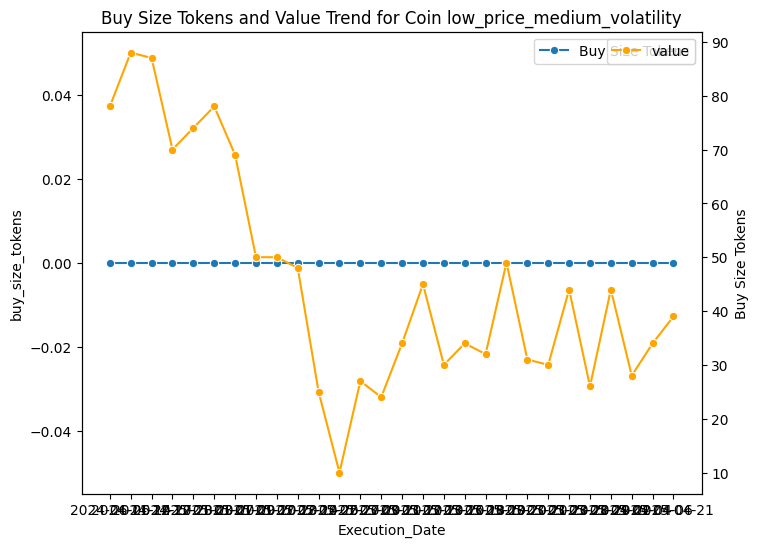

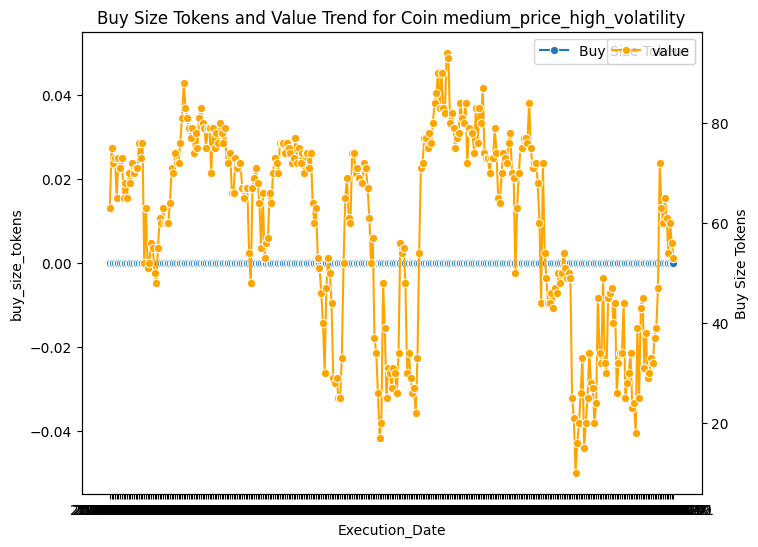

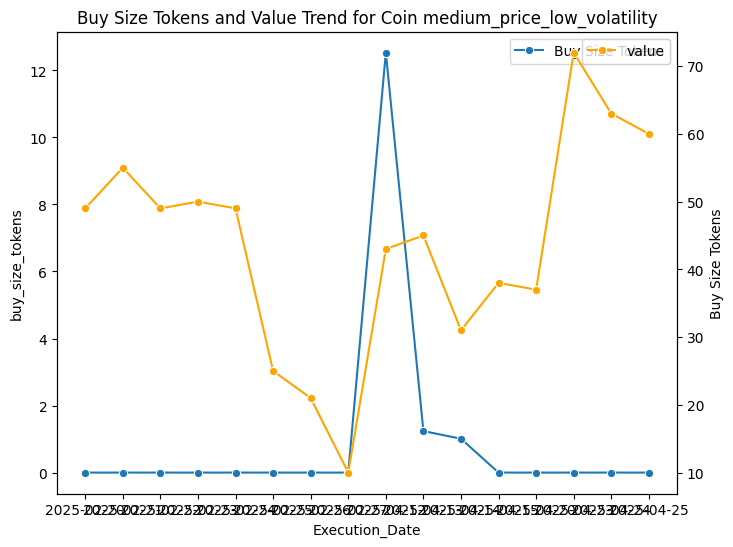

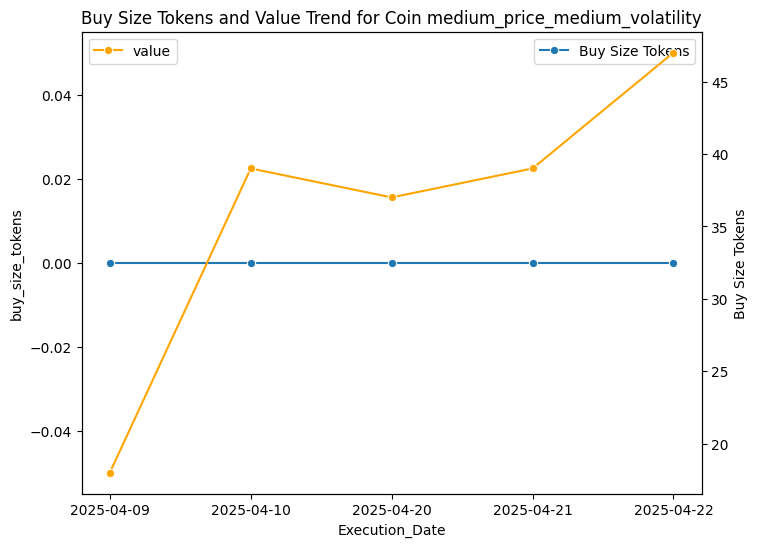

In [ ]:
# plot the buy_size_tokens & value over time for each coin cluster
for i in agg_summary_df.Coin_Cluster.unique():
    plt.figure(figsize=(8, 6))
    sns.lineplot(data=agg_summary_df[agg_summary_df.Coin_Cluster == i], x='Execution_Date', y='buy_size_tokens', label='Buy Size Tokens', marker='o')
    plt.twinx()
    sns.lineplot(data=agg_summary_df[agg_summary_df.Coin_Cluster == i], x='Execution_Date', y='value', label='value', marker='o', color='orange')
    plt.title(f'Buy Size Tokens and Value Trend for Coin {i}')
    plt.xlabel('Execution Date')
    plt.xticks(rotation=90)
    plt.ylabel('Buy Size Tokens')
    plt.legend()
    plt.show()

1.High-price, high-volatility coins show almost no notable buy activity even as sentiment fluctuates, meaning traders avoid aggressive buying in risky premium assets.

2.High-price, medium-volatility coins display moderate buy activity spikes that tend to align with sentiment uptrends, showing traders build positions when optimism rises.

3.Low-price, high-volatility coins reveal small but frequent buy bursts during sentiment swings, indicating speculative entry attempts in unstable assets.

4.Low-price, low-volatility coins attract the largest buy volumes overall, with strong spikes regardless of sentiment level, suggesting they are the preferred assets for accumulation.

5.Medium-price, high-volatility coins show flat to minimal buy sizes, meaning traders hesitate to commit strongly in uncertain, mid-tier volatile assets.

6.Medium-price, low-volatility coins see rare but noticeable buy bursts, often when sentiment rebounds, showing that traders cautiously accumulate in these safer mid-tier assets during recovery phases.

### Close Long Size Tokens vs Coin Cluster Trend

In [ ]:
# pivot table of agg_summary_df with index as Coin_Cluster and values as close_long_size_tokens with mean as aggregation function and fillna with 0
agg_summary_df.pivot_table(index='Coin_Cluster', values='close_long_size_tokens', aggfunc='mean').fillna(0)

,close_long_size_tokens
Coin_Cluster,
high_price_high_volatility,9.413438
high_price_medium_volatility,0.000000
low_price_high_volatility,1708.907016
low_price_low_volatility,622043.801594
low_price_medium_volatility,10.908786
medium_price_high_volatility,31.883092
medium_price_low_volatility,0.000000
medium_price_medium_volatility,0.000000


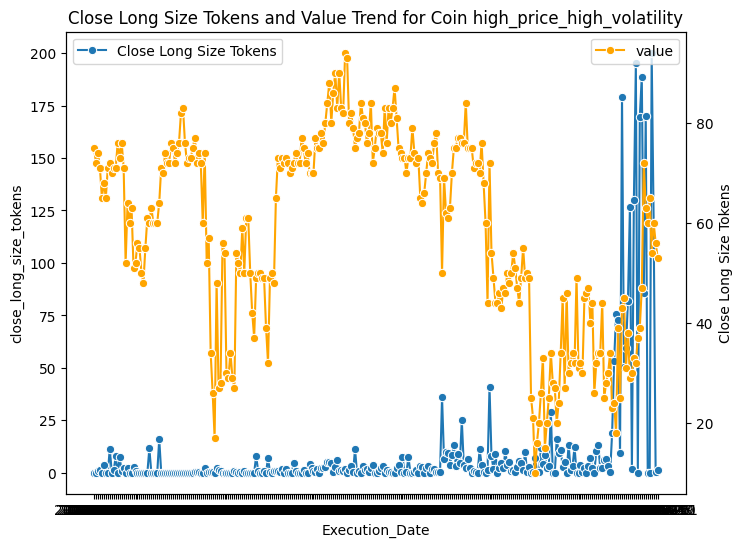

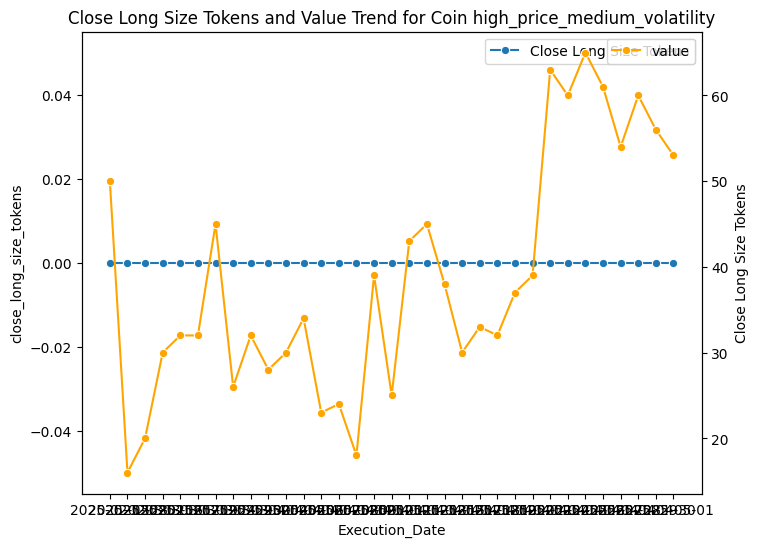

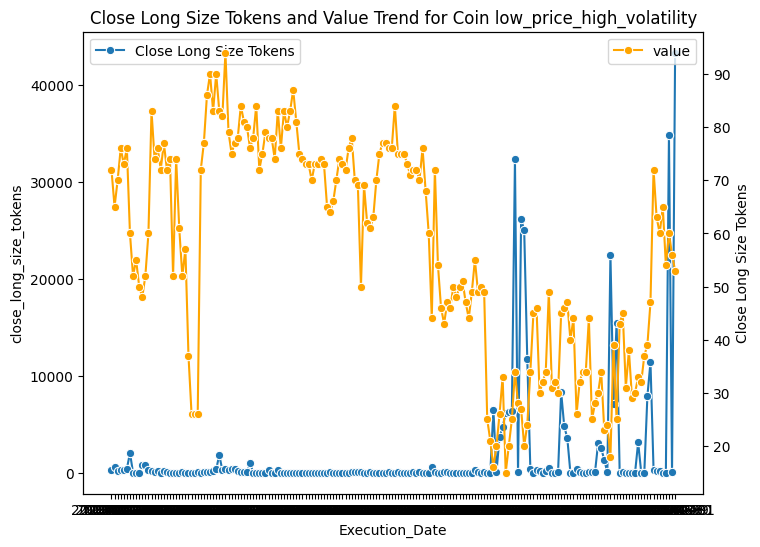

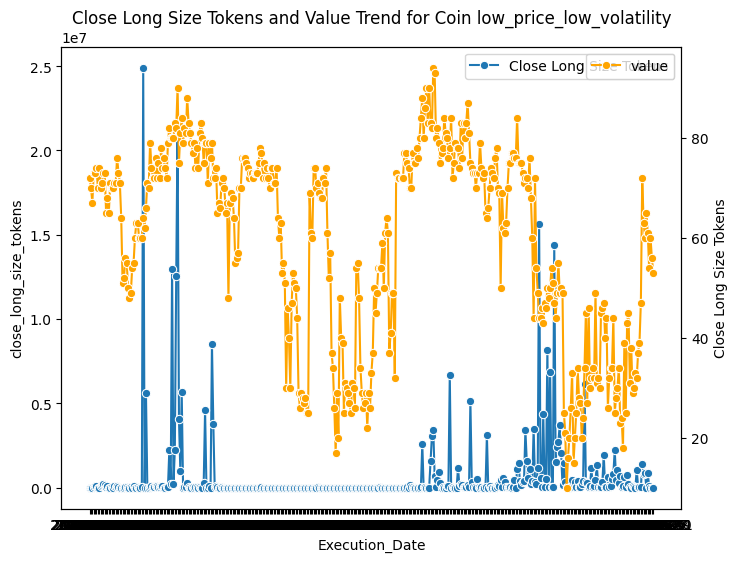

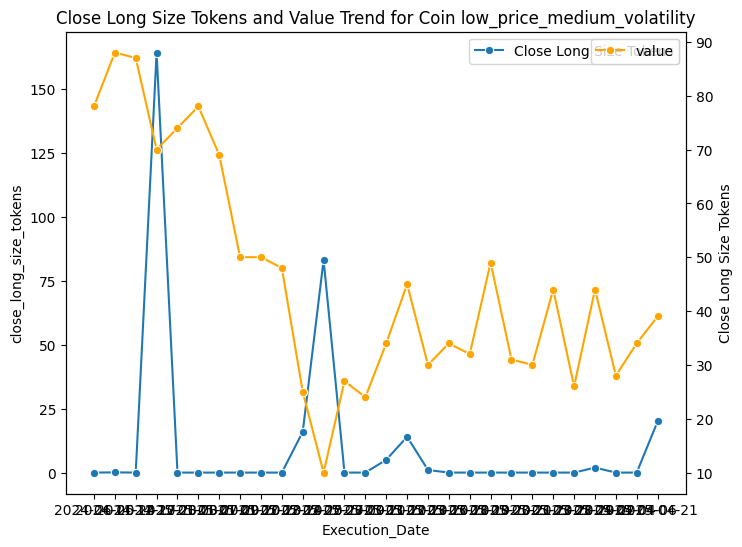

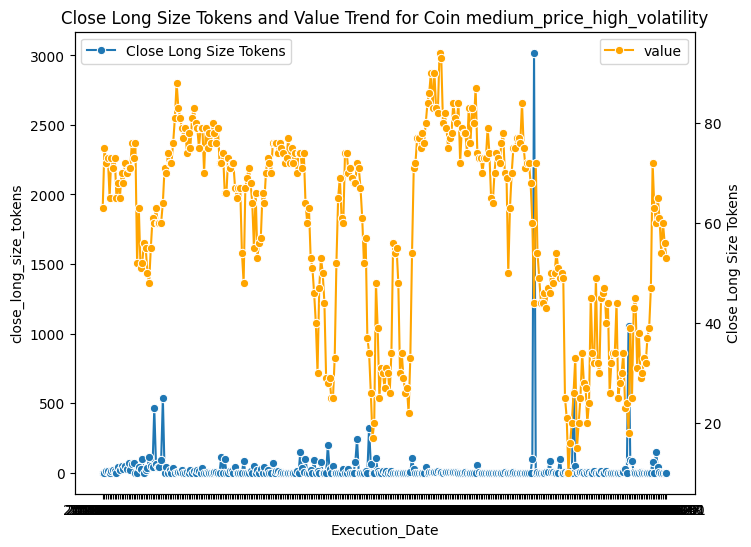

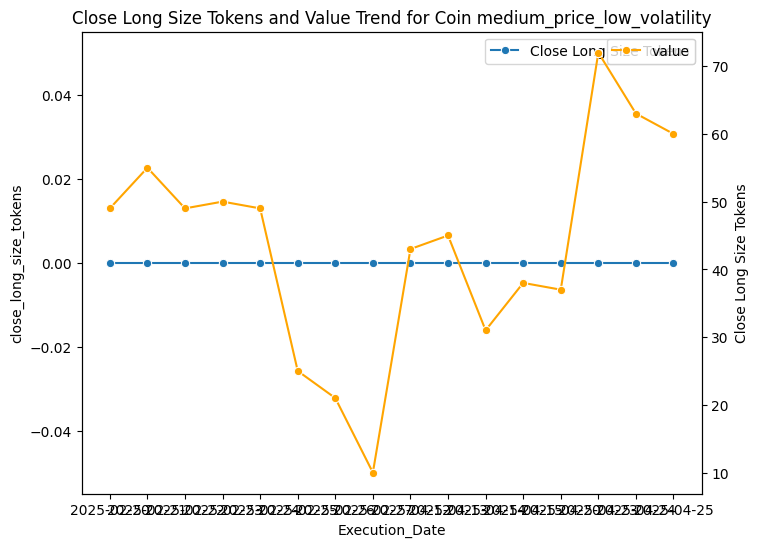

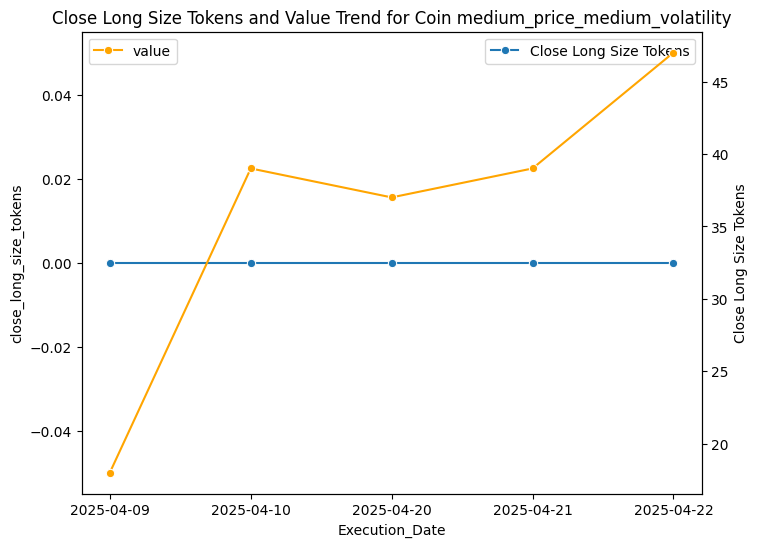

In [ ]:
# plot the close_long_size_tokens & value over time for each coin cluster
for i in agg_summary_df.Coin_Cluster.unique():
    plt.figure(figsize=(8, 6))
    sns.lineplot(data=agg_summary_df[agg_summary_df.Coin_Cluster == i], x='Execution_Date', y='close_long_size_tokens', label='Close Long Size Tokens', marker='o')
    plt.twinx()
    sns.lineplot(data=agg_summary_df[agg_summary_df.Coin_Cluster == i], x='Execution_Date', y='value', label='value', marker='o', color='orange')
    plt.title(f'Close Long Size Tokens and Value Trend for Coin {i}')
    plt.xlabel('Execution Date')
    plt.xticks(rotation=90)
    plt.ylabel('Close Long Size Tokens')
    plt.legend()
    plt.show()

1.High-price, high-volatility coins see sharp spikes in closing longs when sentiment drops, showing traders exit bullish positions quickly in fearful conditions.

2.High-price, medium-volatility coins show almost no significant closing activity, suggesting traders hold positions longer in stable high-value assets.

3.Low-price, high-volatility coins display frequent large long closures during sentiment dips, reflecting that traders are quick to cut exposure in risky cheap assets.

4.Low-price, low-volatility coins have massive closing volumes regardless of sentiment, meaning they are heavily traded for liquidity, and position exits are common.

5.Medium-price, high-volatility coins show consistent long closures that align with falling sentiment, again reinforcing that volatility combined with fear drives liquidation.

6.Medium- and low-volatility categories see limited closing activity, implying traders are less reactive and more willing to hold through sentiment swings in stable assets.

### Open Short Size Tokens vs Coin Cluster Trend

In [ ]:
# pivot table of agg_summary_df with index as Coin_Cluster and values as close_short_size_tokens with mean as aggregation function and fillna with 0
agg_summary_df.pivot_table(index='Coin_Cluster', values='close_short_size_tokens', aggfunc='mean').fillna(0)

,close_short_size_tokens
Coin_Cluster,
high_price_high_volatility,3.712861
high_price_medium_volatility,0.000000
low_price_high_volatility,736.649065
low_price_low_volatility,524639.725864
low_price_medium_volatility,0.608929
medium_price_high_volatility,37.092616
medium_price_low_volatility,0.675056
medium_price_medium_volatility,93.973600


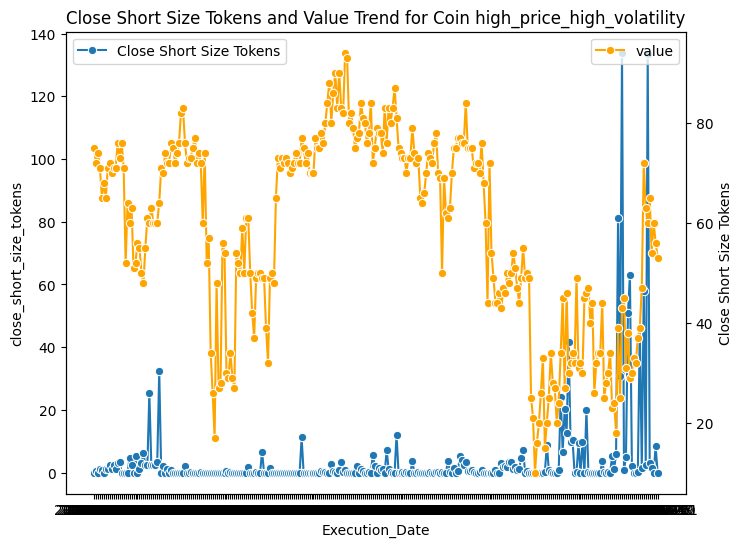

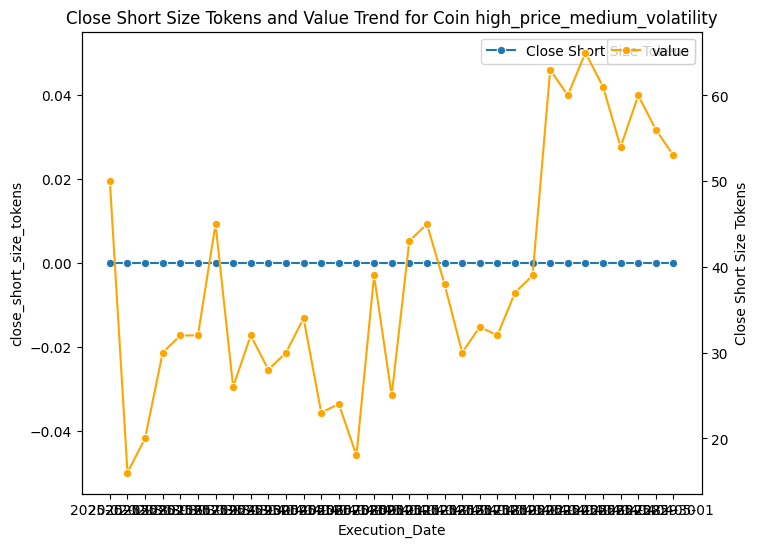

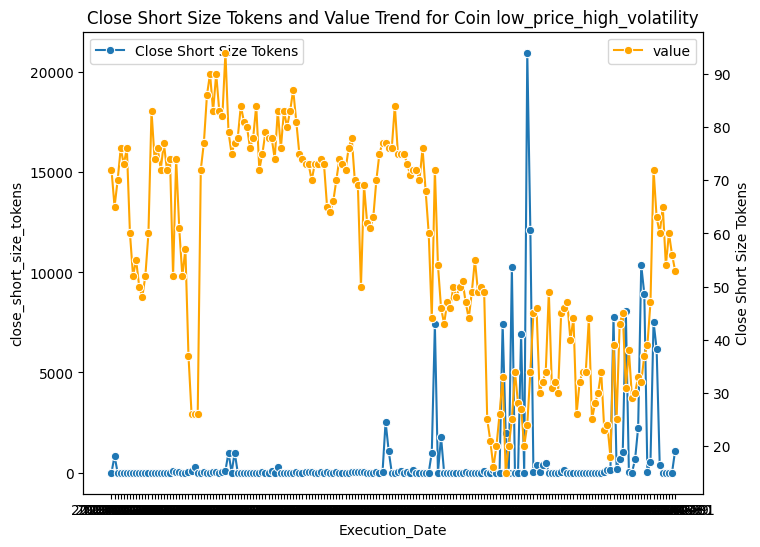

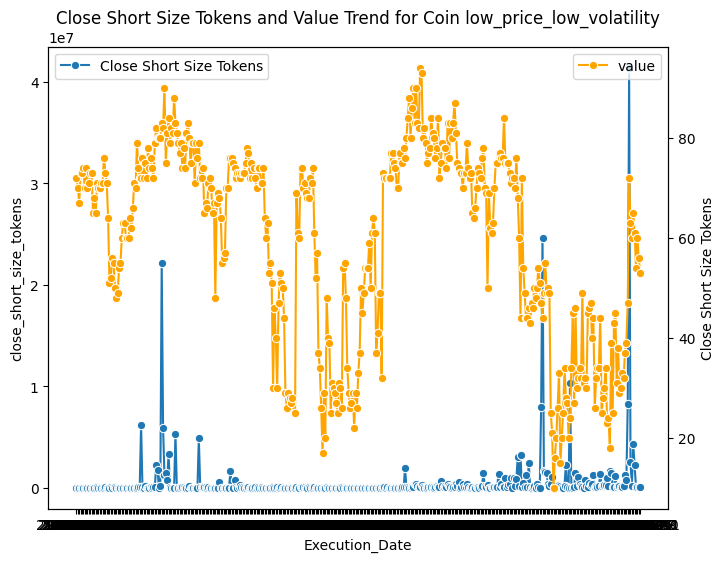

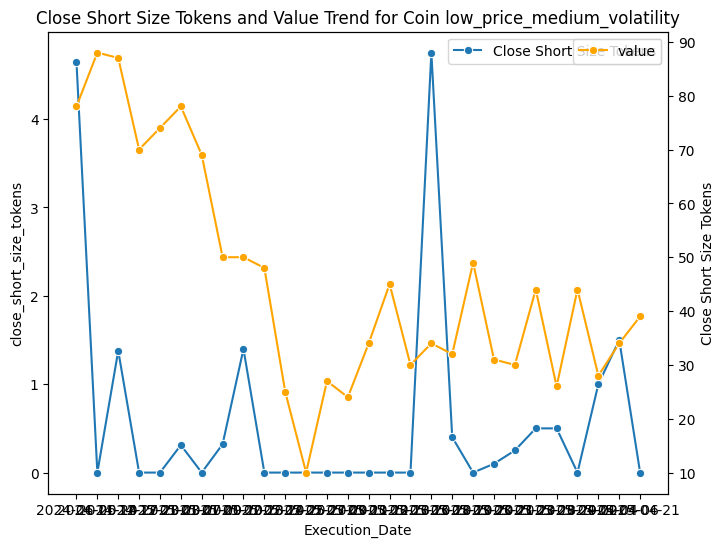

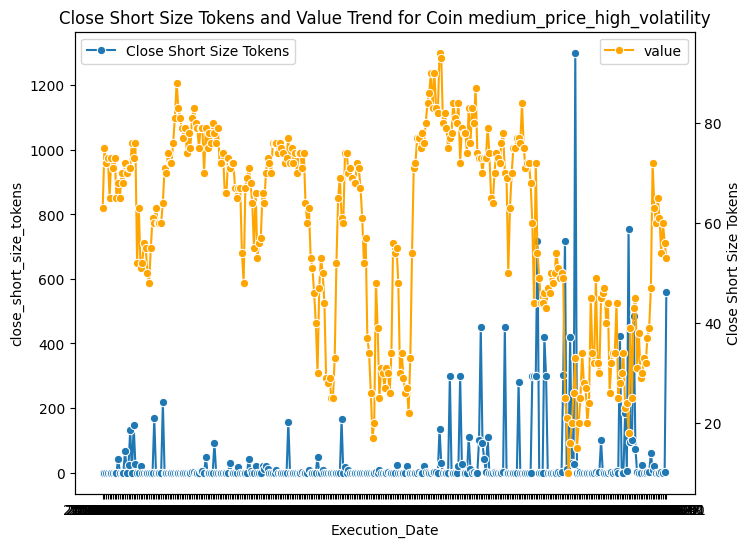

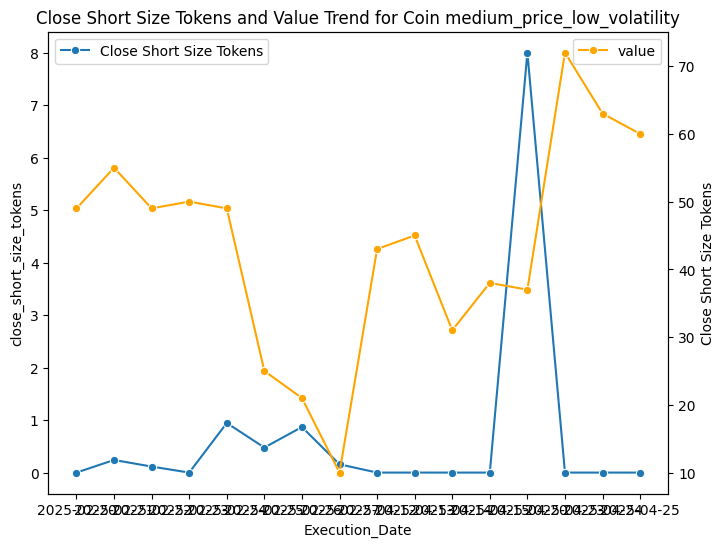

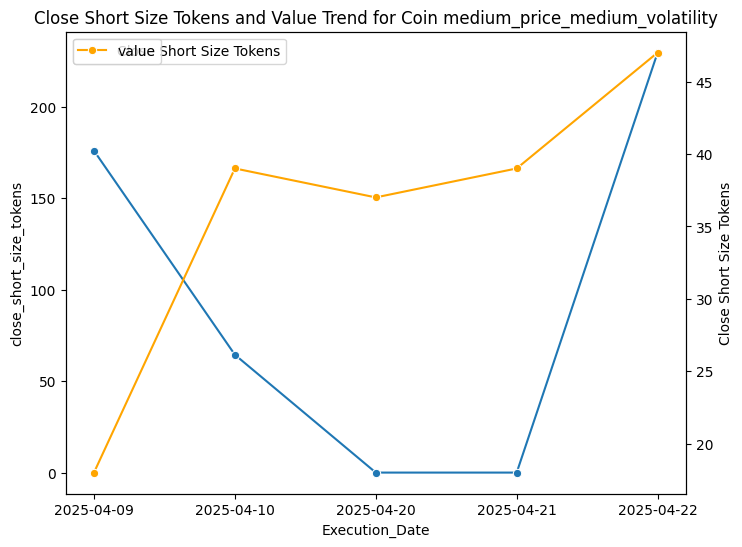

In [ ]:
# plot the close_short_size_tokens & value over time for each coin cluster
for i in agg_summary_df.Coin_Cluster.unique():
    plt.figure(figsize=(8, 6))
    sns.lineplot(data=agg_summary_df[agg_summary_df.Coin_Cluster == i], x='Execution_Date', y='close_short_size_tokens', label='Close Short Size Tokens', marker='o')
    plt.twinx()
    sns.lineplot(data=agg_summary_df[agg_summary_df.Coin_Cluster == i], x='Execution_Date', y='value', label='value', marker='o', color='orange')
    plt.title(f'Close Short Size Tokens and Value Trend for Coin {i}')
    plt.xlabel('Execution Date')
    plt.xticks(rotation=90)
    plt.ylabel('Close Short Size Tokens')
    plt.legend()
    plt.show()

1.High Price–High Volatility Coins: Close short size tokens surge sporadically, especially in later periods, while value trends downwards, indicating aggressive short covering in reaction to falling asset values.

2.High/Medium Price–Medium Volatility Coins: Token activity is almost flat (near zero), showing minimal short covering activity. Value trends independently, suggesting investors are not actively closing shorts in these segments.

3.Low Price–High Volatility Coins: Large spikes in close short tokens occur when value dips, implying traders exit short positions during heightened uncertainty, potentially to secure profits or reduce risk.

4.Low Price–Low Volatility Coins: Close short tokens show extreme, erratic spikes while value steadily trends with cyclical drops, reflecting panic exits or institutional activity in otherwise stable value cycles.

5.Medium Price Segments: Both low and high volatility categories show occasional bursts in close short tokens but with weaker alignment to value trends, suggesting speculative or opportunistic short covering rather than systematic behavior.

### Sell Size Tokens vs Coin Cluster Trend

In [ ]:
# pivot table of agg_summary_df with index as Coin_Cluster and values as sell_size_tokens with mean as aggregation function and fillna with 0
agg_summary_df.pivot_table(index='Coin_Cluster', values='sell_size_tokens', aggfunc='mean').fillna(0)

,sell_size_tokens
Coin_Cluster,
high_price_high_volatility,0.000000
high_price_medium_volatility,0.367833
low_price_high_volatility,0.061902
low_price_low_volatility,27168.015328
low_price_medium_volatility,0.000000
medium_price_high_volatility,0.000000
medium_price_low_volatility,19.351425
medium_price_medium_volatility,0.000000


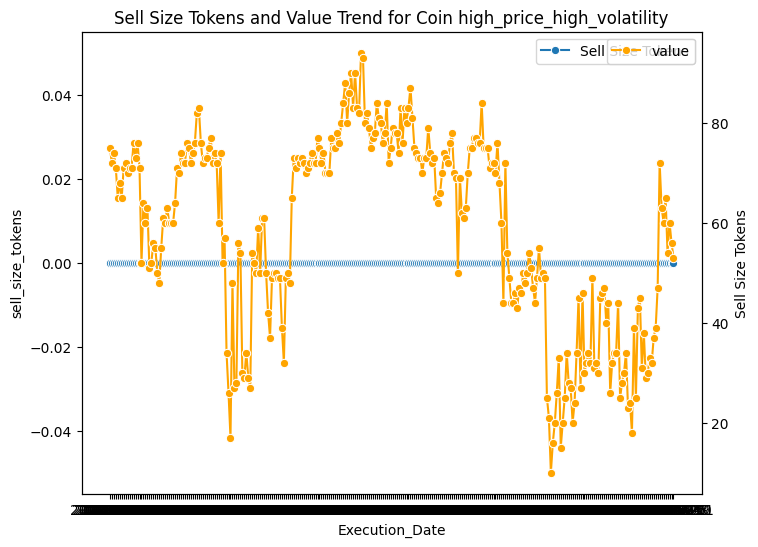

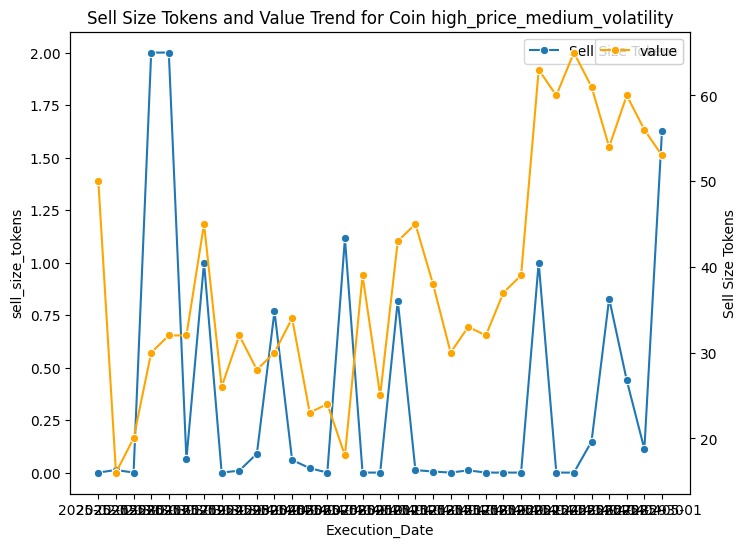

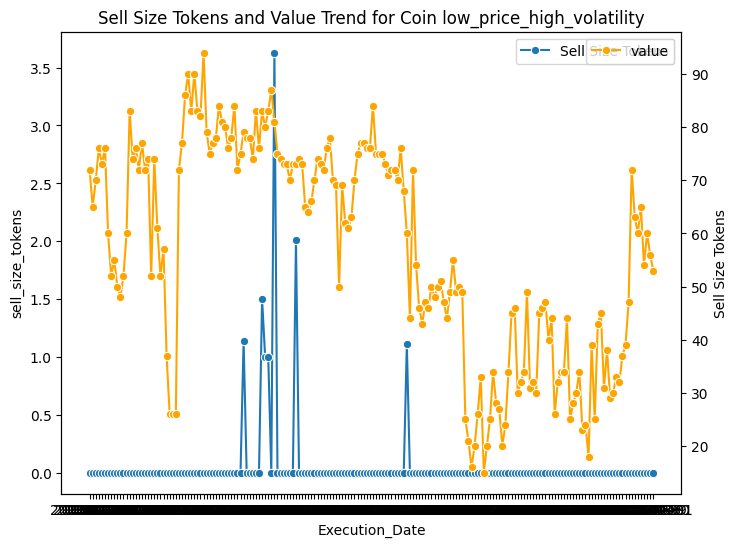

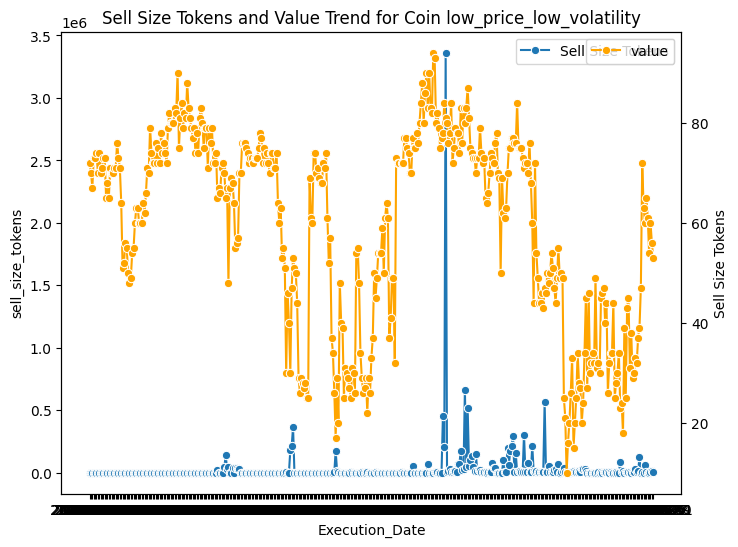

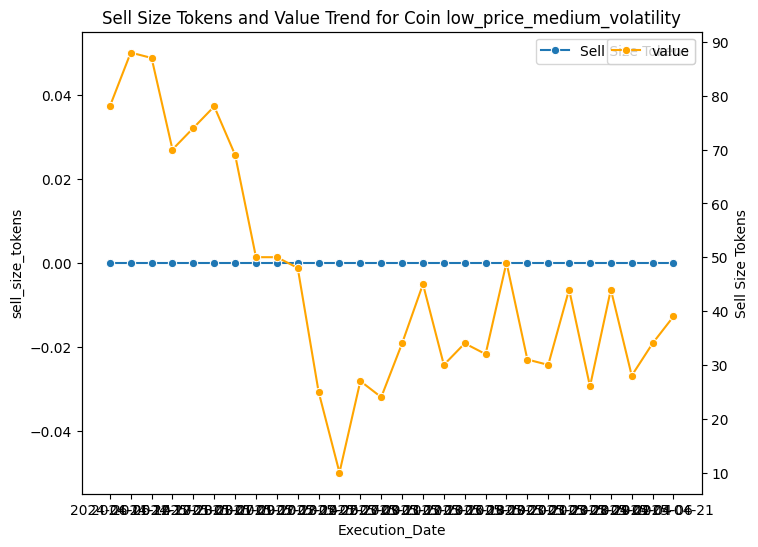

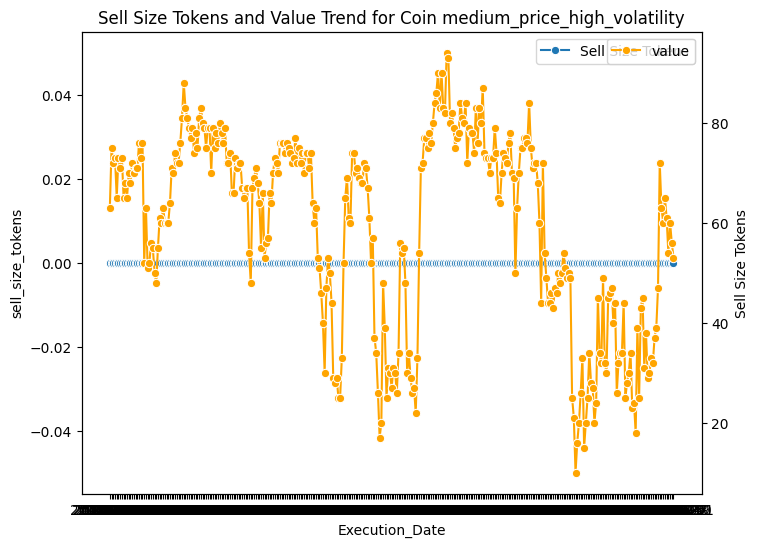

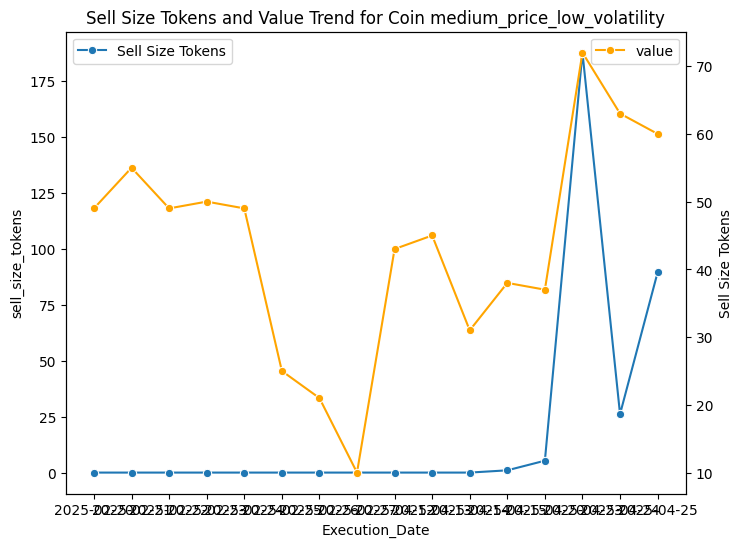

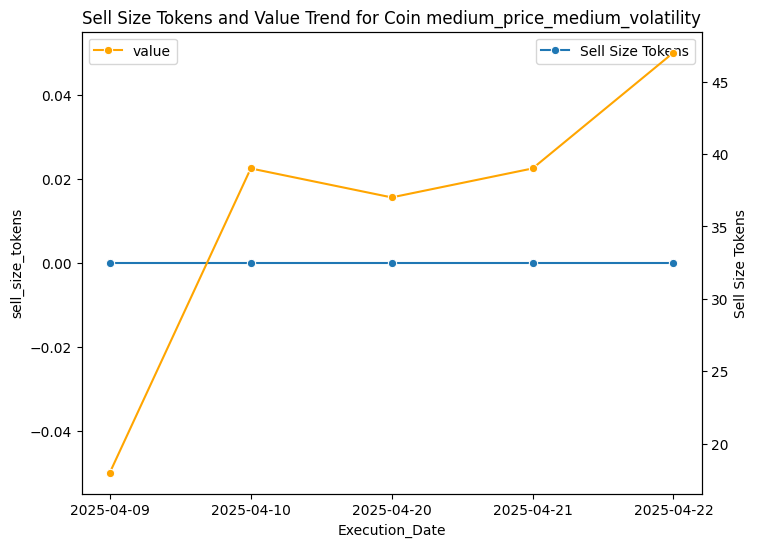

In [ ]:
# plot the Sell Size Tokens & value over time for each coin cluster
for i in agg_summary_df.Coin_Cluster.unique():
    plt.figure(figsize=(8, 6))
    sns.lineplot(data=agg_summary_df[agg_summary_df.Coin_Cluster == i], x='Execution_Date', y='sell_size_tokens', label='Sell Size Tokens', marker='o')
    plt.twinx()
    sns.lineplot(data=agg_summary_df[agg_summary_df.Coin_Cluster == i], x='Execution_Date', y='value', label='value', marker='o', color='orange')
    plt.title(f'Sell Size Tokens and Value Trend for Coin {i}')
    plt.xlabel('Execution Date')
    plt.xticks(rotation=90)
    plt.ylabel('Sell Size Tokens')
    plt.legend()
    plt.show()

1.High-price, high-volatility coins show almost flat sell size activity despite wide sentiment swings, meaning traders don’t aggressively sell these assets even in fear phases.

2.High-price, medium-volatility coins show scattered small sell spikes that loosely follow value dips, suggesting cautious selling during weaker sentiment.

3.Low-price, high-volatility coins experience sudden sell bursts when sentiment drops, reflecting panic selling or speculative exits in risky assets.

4.Low-price, low-volatility coins show the largest sell volumes overall, with heavy sell spikes that align with sentiment declines, making them a preferred segment for liquidation.

5.Medium-price categories show irregular or muted sell activity, implying that these assets are less sentiment-driven for selling compared to low-price categories.

### Open Long Size USD vs Coin Cluster Trend

In [ ]:
# pivot table of agg_summary_df with index as Coin_Cluster and values as open_long_size_usd with mean as aggregation function and fillna with 0
agg_summary_df.pivot_table(index='Coin_Cluster', values='open_long_size_usd', aggfunc='mean').fillna(0)

,open_long_size_usd
Coin_Cluster,
high_price_high_volatility,816313.533986
high_price_medium_volatility,0.000000
low_price_high_volatility,233975.316685
low_price_low_volatility,186409.674428
low_price_medium_volatility,6981.658214
medium_price_high_volatility,81594.052584
medium_price_low_volatility,0.000000
medium_price_medium_volatility,0.000000


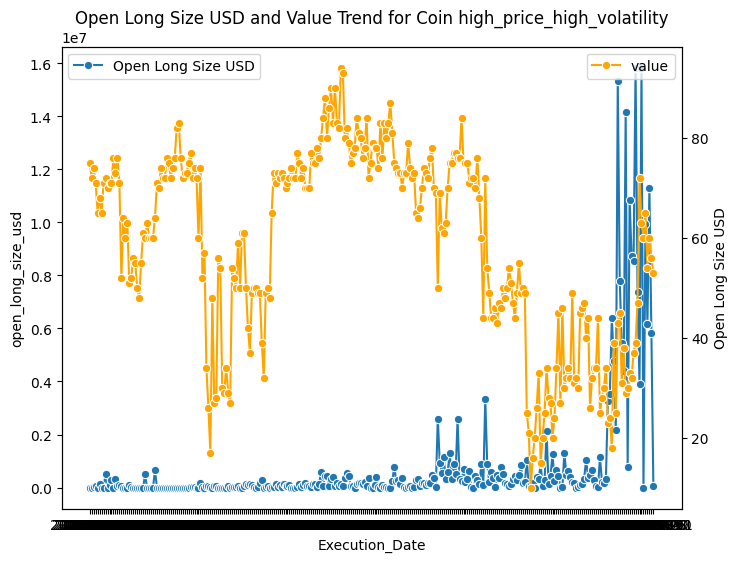

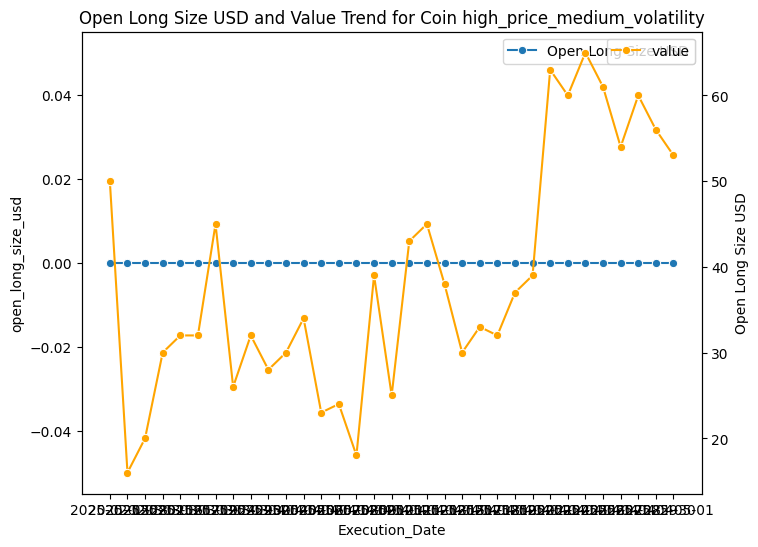

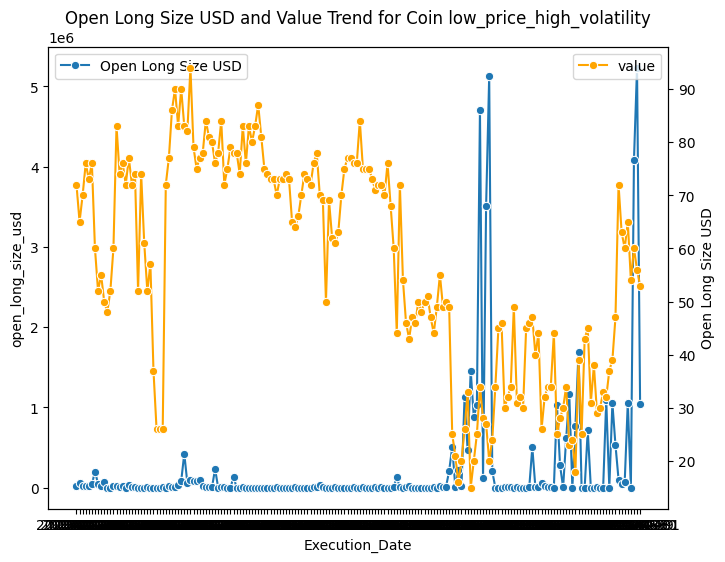

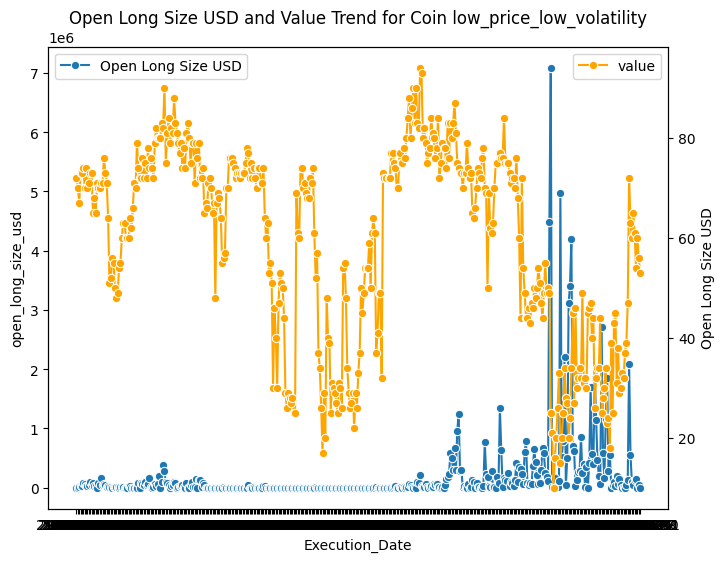

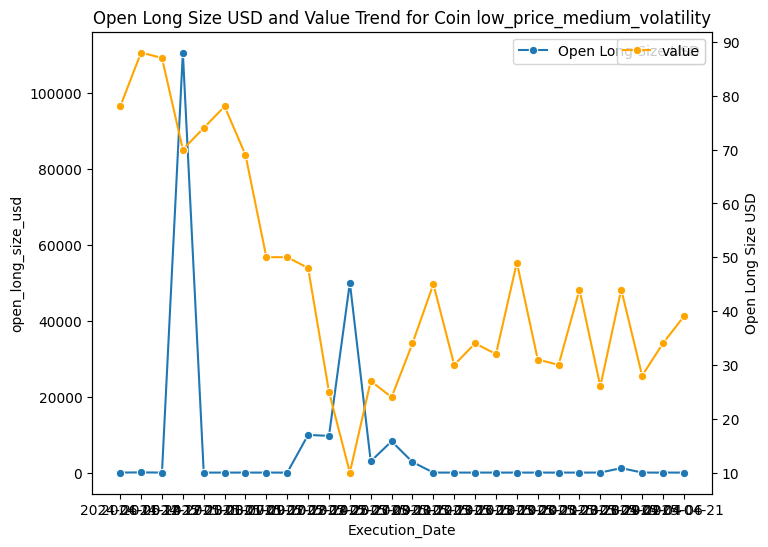

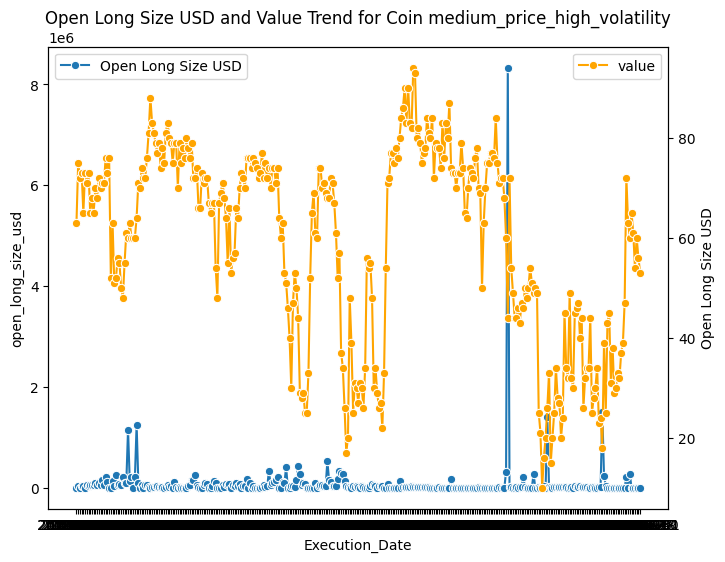

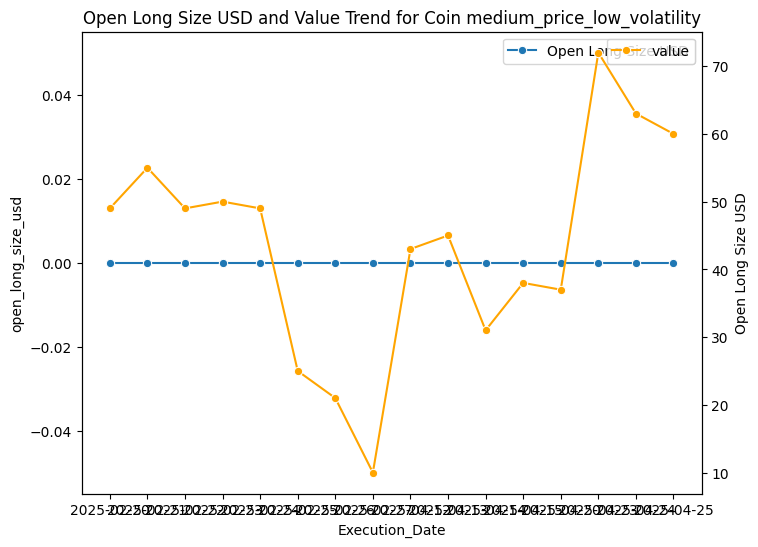

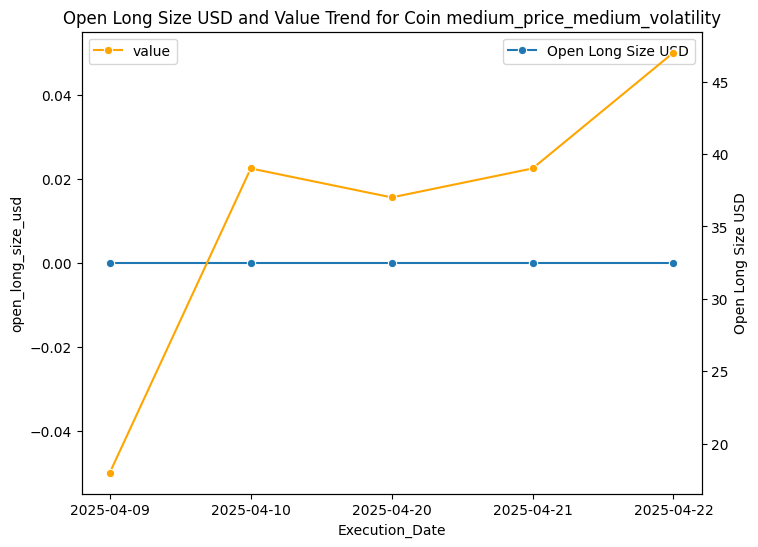

In [ ]:
# plot the open_long_size_usd & value over time for each coin cluster
for i in agg_summary_df.Coin_Cluster.unique():
    plt.figure(figsize=(8, 6))
    sns.lineplot(data=agg_summary_df[agg_summary_df.Coin_Cluster == i], x='Execution_Date', y='open_long_size_usd', label='Open Long Size USD', marker='o')
    plt.twinx()
    sns.lineplot(data=agg_summary_df[agg_summary_df.Coin_Cluster == i], x='Execution_Date', y='value', label='value', marker='o', color='orange')
    plt.title(f'Open Long Size USD and Value Trend for Coin {i}')
    plt.xlabel('Execution Date')
    plt.xticks(rotation=90)
    plt.ylabel('Open Long Size USD')
    plt.legend()
    plt.show()

1.High-price, high-volatility coins show sharp spikes in open long USD during both high and falling sentiment, suggesting traders speculate heavily when optimism peaks but also double down near dips.

2.High-price, medium-volatility coins remain flat with no notable long activity, meaning investors avoid aggressive positions in stable, expensive assets.

3.Low-price, high-volatility coins see frequent bursts of long USD openings, often when sentiment is recovering, showing speculative attempts to capture rebounds.

4.Low-price, low-volatility coins attract the highest long USD volumes overall, with consistent spikes across cycles, making them preferred accumulation assets.

5.Medium-price categories show mixed behavior: high-volatility coins have large but scattered long openings tied to sentiment, while low-volatility coins show minimal activity, reflecting cautious entry.

Overall: traders prefer opening long positions in low-price coins (especially low-volatility), while high-price assets only attract speculative long bursts under extreme sentiment changes.

### Open Short Size USD vs Coin Cluster Trend

In [ ]:
# pivot table of agg_summary_df with index as Coin_Cluster and values as open_short_size_usd with mean as aggregation function and fillna with 0
agg_summary_df.pivot_table(index='Coin_Cluster', values='open_short_size_usd', aggfunc='mean').fillna(0)

,open_short_size_usd
Coin_Cluster,
high_price_high_volatility,307808.642762
high_price_medium_volatility,0.000000
low_price_high_volatility,115308.426141
low_price_low_volatility,102494.345620
low_price_medium_volatility,406.980357
medium_price_high_volatility,98989.116535
medium_price_low_volatility,1032.851875
medium_price_medium_volatility,302864.774000


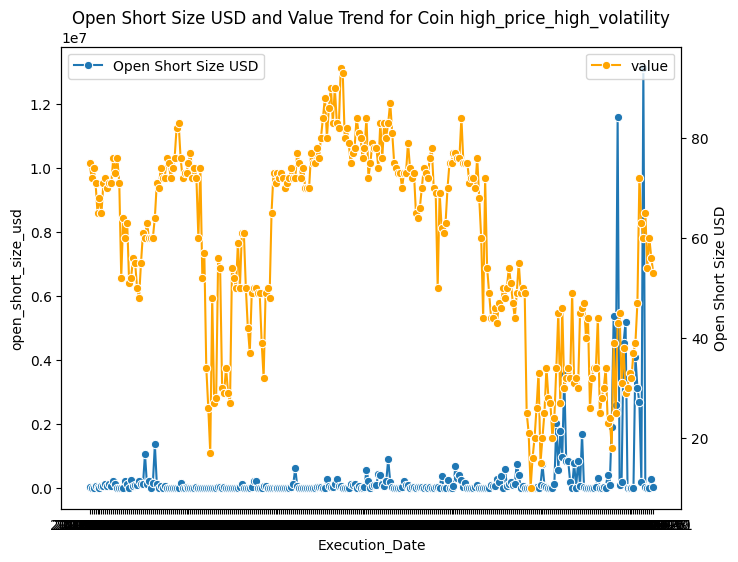

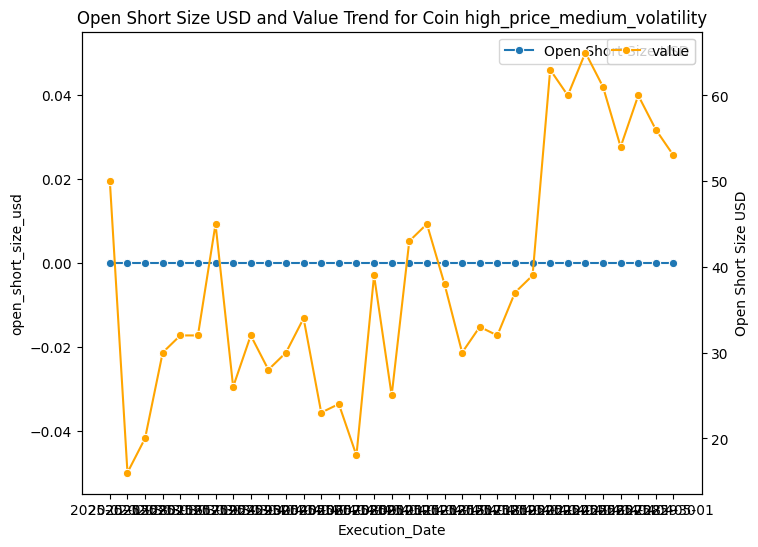

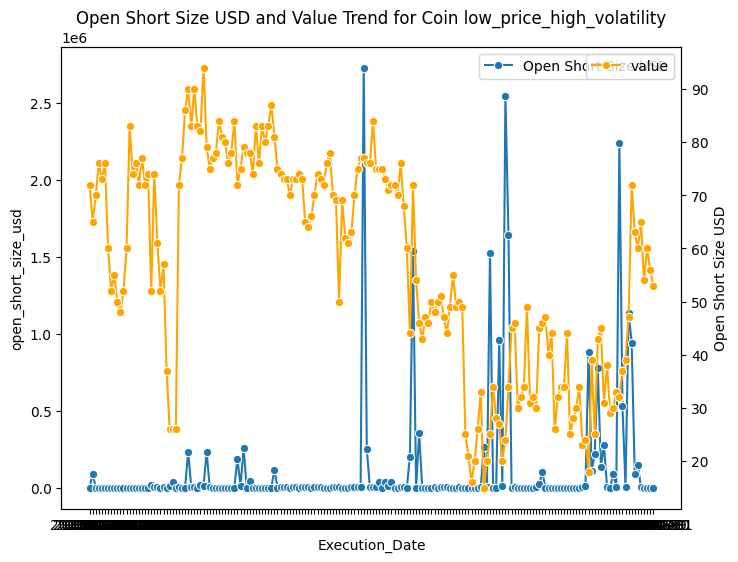

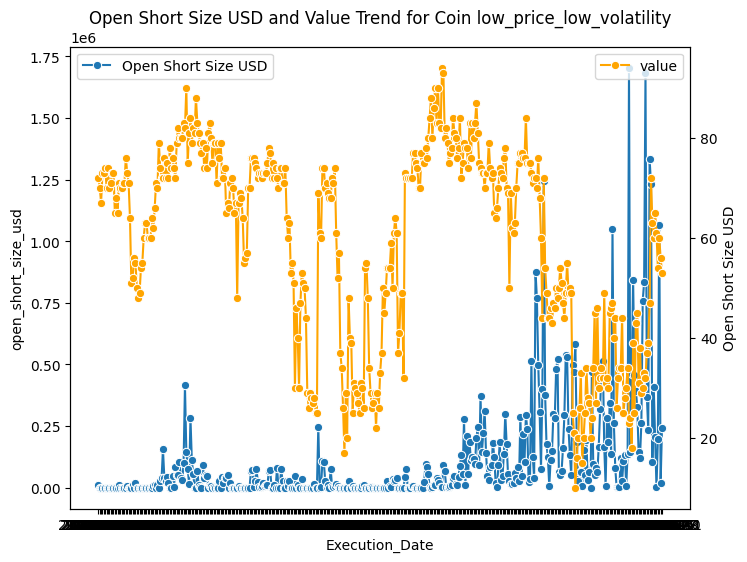

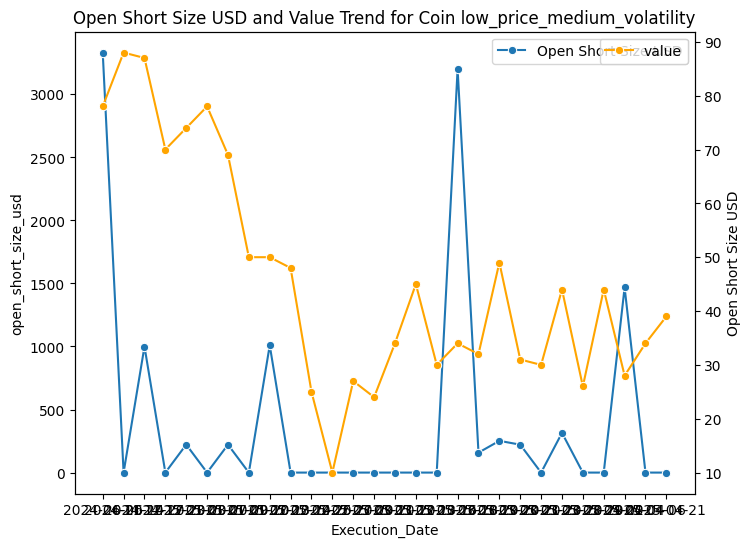

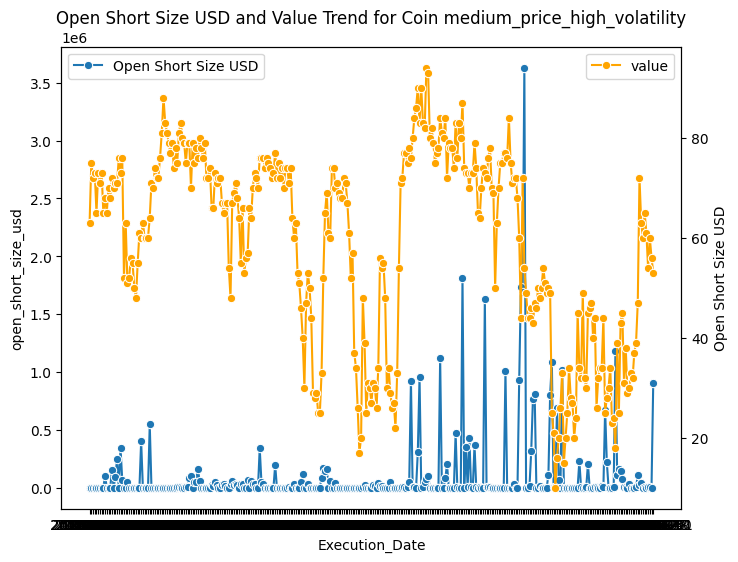

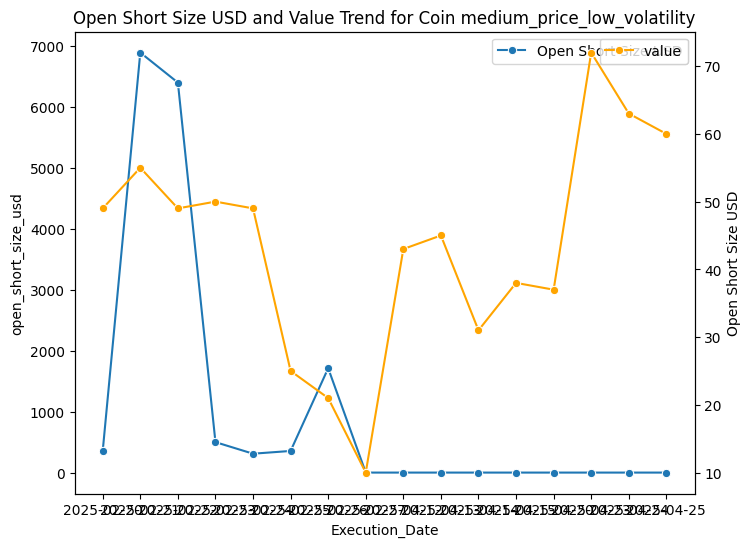

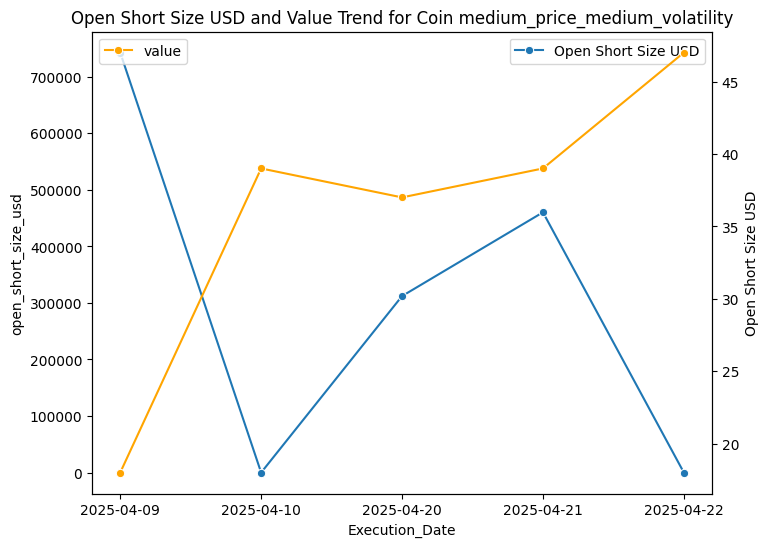

In [ ]:
# plot the Open Short Size USD & value over time for each coin cluster
for i in agg_summary_df.Coin_Cluster.unique():
    plt.figure(figsize=(8, 6))
    sns.lineplot(data=agg_summary_df[agg_summary_df.Coin_Cluster == i], x='Execution_Date', y='open_short_size_usd', label='Open Short Size USD', marker='o')
    plt.twinx()
    sns.lineplot(data=agg_summary_df[agg_summary_df.Coin_Cluster == i], x='Execution_Date', y='value', label='value', marker='o', color='orange')
    plt.title(f'Open Short Size USD and Value Trend for Coin {i}')
    plt.xlabel('Execution Date')
    plt.xticks(rotation=90)
    plt.ylabel('Open Short Size USD')
    plt.legend()
    plt.show()

1.High volatility coins (both high-price & low-price) attract the most aggressive short speculation.

2.Medium volatility coins show weak alignment between shorts and value, suggesting lower speculative trading.

4.Low price coins show stronger trader reactions to value declines than medium price coins, even if volatility is low.

### Buy Size USD vs Coin Cluster Trend

In [ ]:
# pivot table of agg_summary_df with index as Coin_Cluster and values as Buy Size USD with mean as aggregation function and fillna with 0
agg_summary_df.pivot_table(index='Coin_Cluster', values='buy_size_usd', aggfunc='mean').fillna(0)

,buy_size_usd
Coin_Cluster,
high_price_high_volatility,0.000000
high_price_medium_volatility,43292.382121
low_price_high_volatility,8.605380
low_price_low_volatility,72367.117567
low_price_medium_volatility,0.000000
medium_price_high_volatility,0.000000
medium_price_low_volatility,1479.982500
medium_price_medium_volatility,0.000000


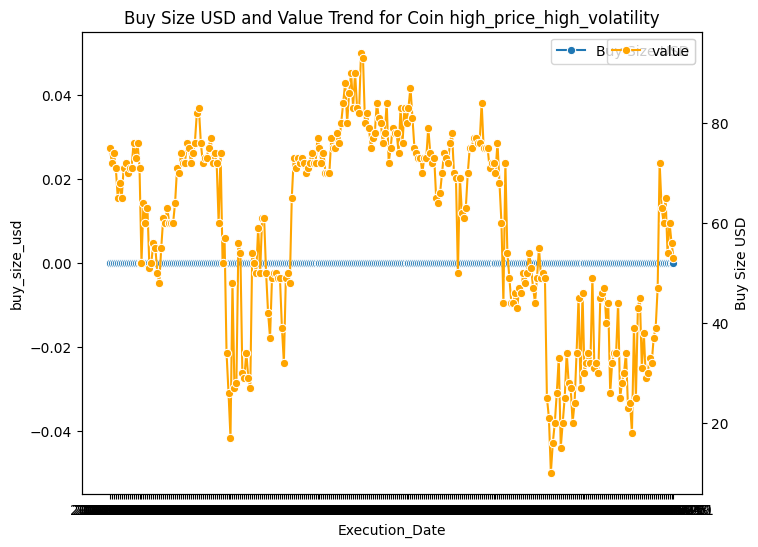

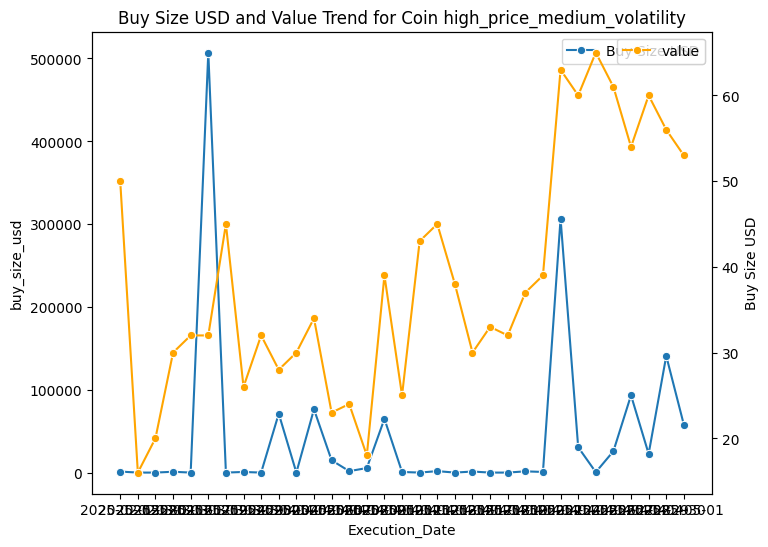

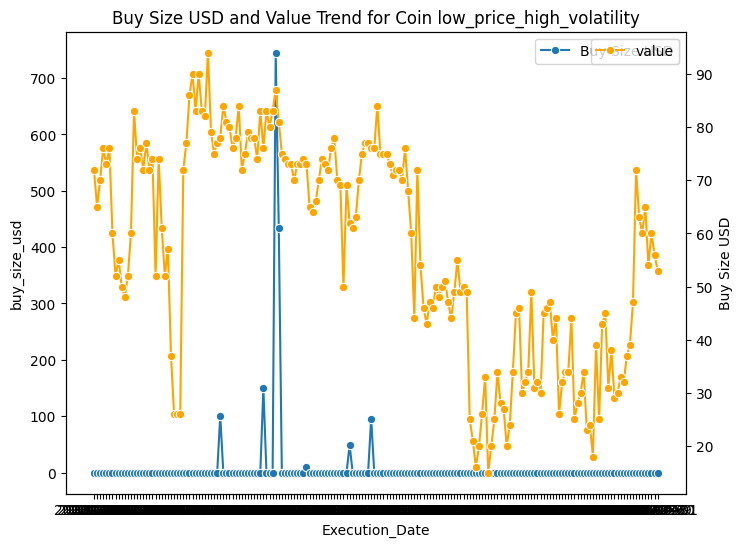

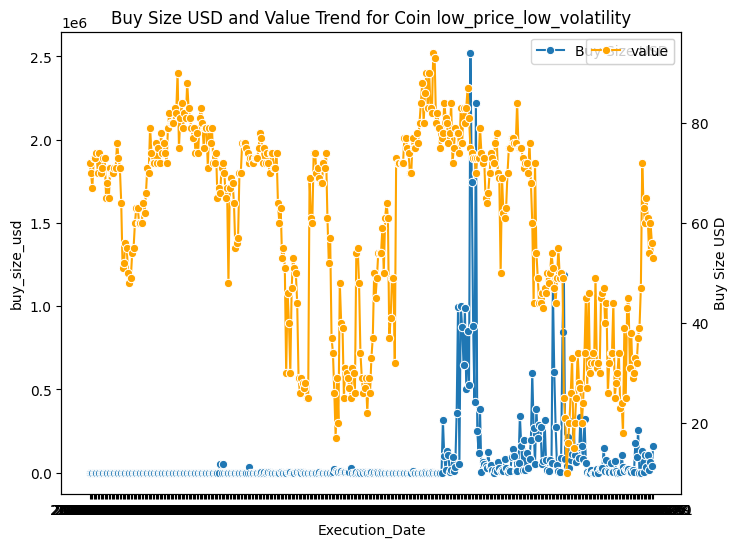

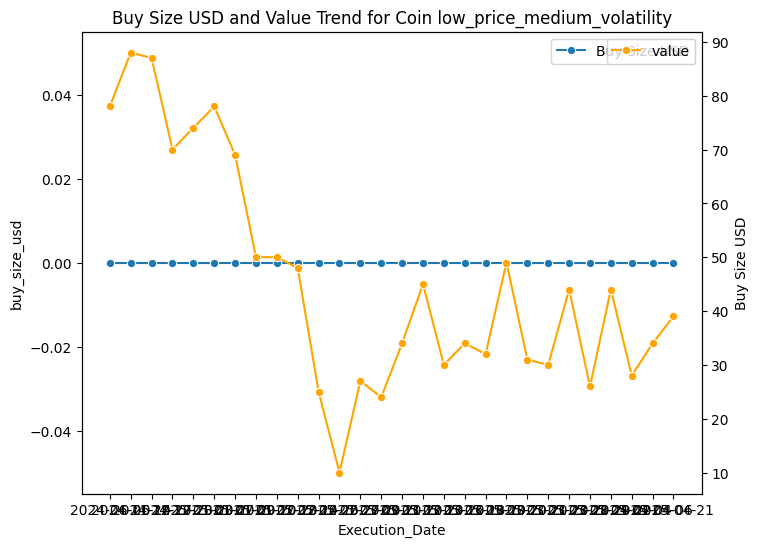

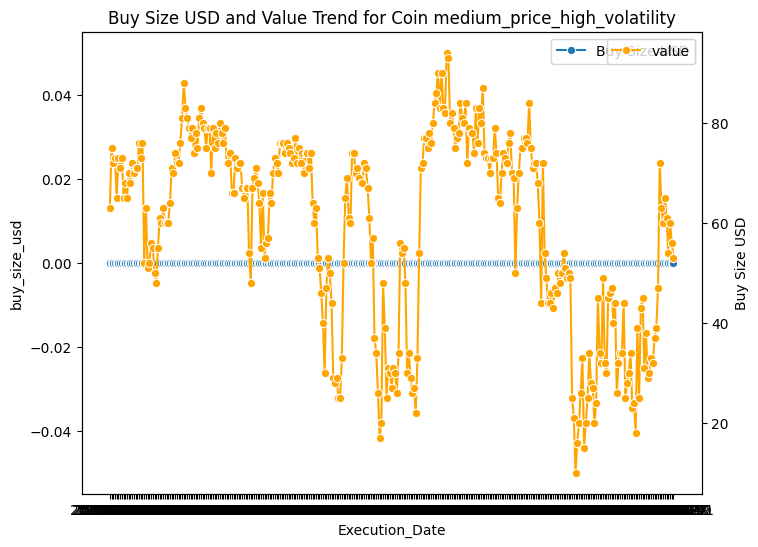

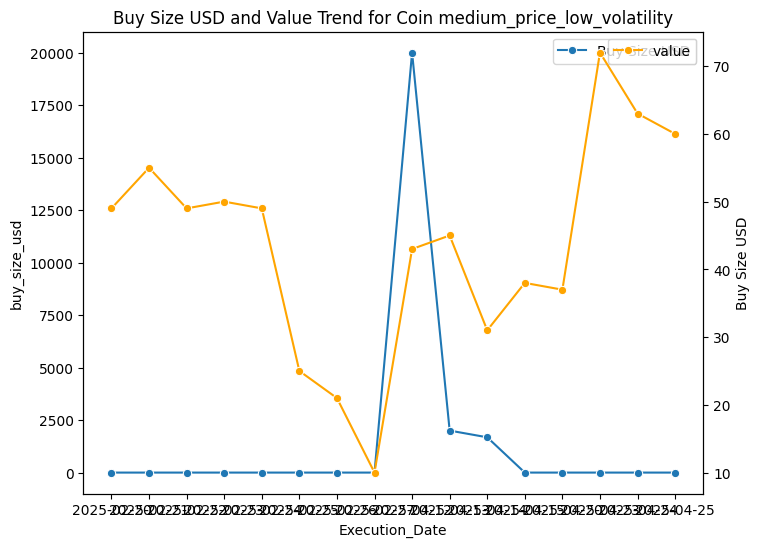

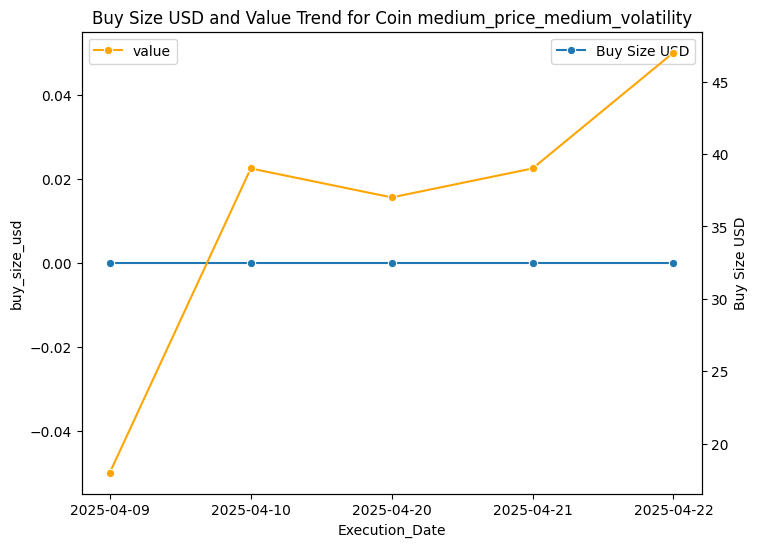

In [ ]:
# plot the Buy Size USD & value over time for each coin cluster
for i in agg_summary_df.Coin_Cluster.unique():
    plt.figure(figsize=(8, 6))
    sns.lineplot(data=agg_summary_df[agg_summary_df.Coin_Cluster == i], x='Execution_Date', y='buy_size_usd', label='Buy Size USD', marker='o')
    plt.twinx()
    sns.lineplot(data=agg_summary_df[agg_summary_df.Coin_Cluster == i], x='Execution_Date', y='value', label='value', marker='o', color='orange')
    plt.title(f'Buy Size USD and Value Trend for Coin {i}')
    plt.xlabel('Execution Date')
    plt.xticks(rotation=90)
    plt.ylabel('Buy Size USD')
    plt.legend()
    plt.show()

1.Low-price, low-volatility coins see the strongest and most consistent buy activity, making them the main accumulation assets during both neutral and optimistic sentiment phases.

2.Low-price, high-volatility coins attract opportunistic buys, mostly when sentiment starts recovering, but the activity is irregular.

3.High-price coins (both high and medium volatility) show very limited or flat buy volumes, meaning traders avoid directly buying them and instead rely on long/short strategies.

4.Medium-price coins generally have muted buy activity with only scattered spikes, showing they are not primary targets for accumulation.

Overall, trader buying is concentrated in low-price assets, while high and medium-price coins are traded more through speculative positions than outright purchases.

### Close Long Size USD vs Coin Cluster Trend

In [ ]:
# pivot table of agg_summary_df with index as Coin_Cluster and values as close_long_size_usd with mean as aggregation function and fillna with 0
agg_summary_df.pivot_table(index='Coin_Cluster', values='close_long_size_usd', aggfunc='mean').fillna(0)

,close_long_size_usd
Coin_Cluster,
high_price_high_volatility,819868.332378
high_price_medium_volatility,0.000000
low_price_high_volatility,236146.428859
low_price_low_volatility,187960.200049
low_price_medium_volatility,6987.403571
medium_price_high_volatility,81558.277812
medium_price_low_volatility,0.000000
medium_price_medium_volatility,0.000000


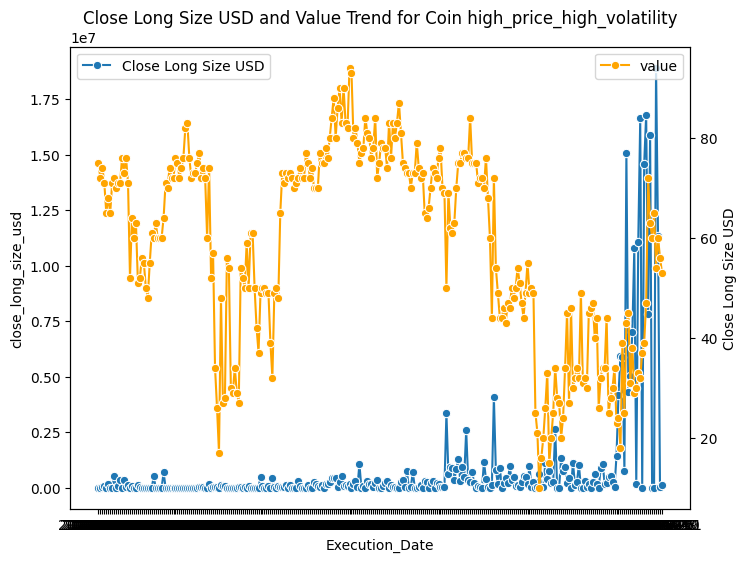

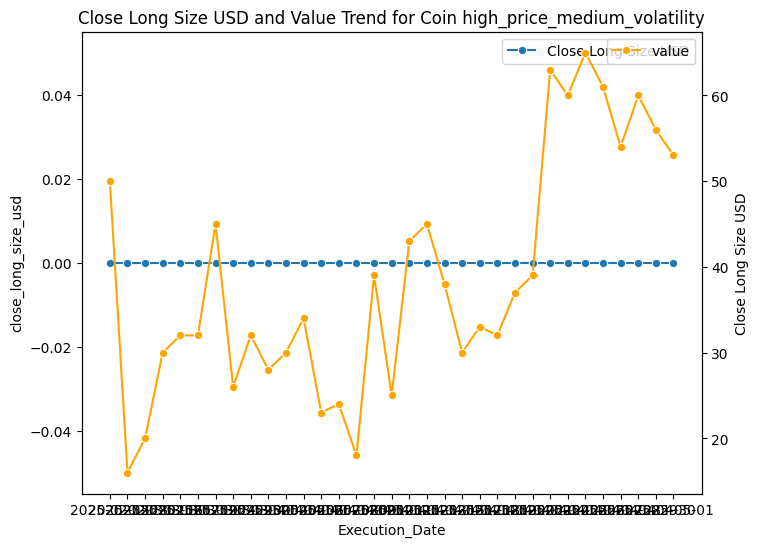

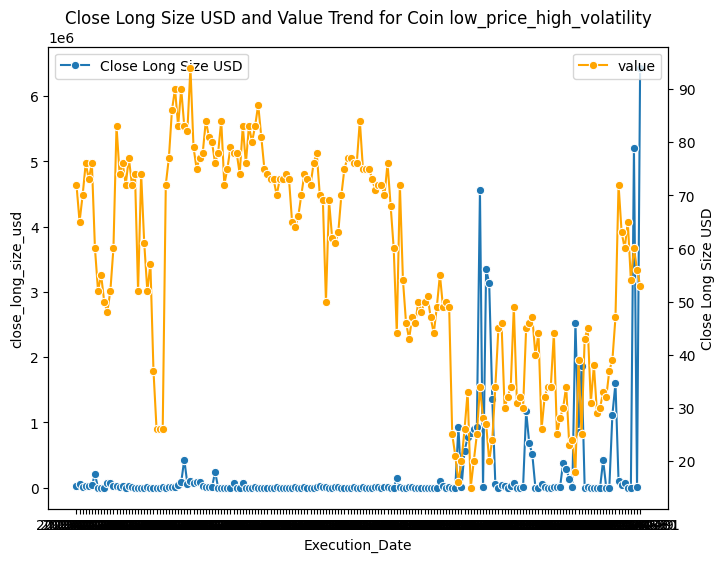

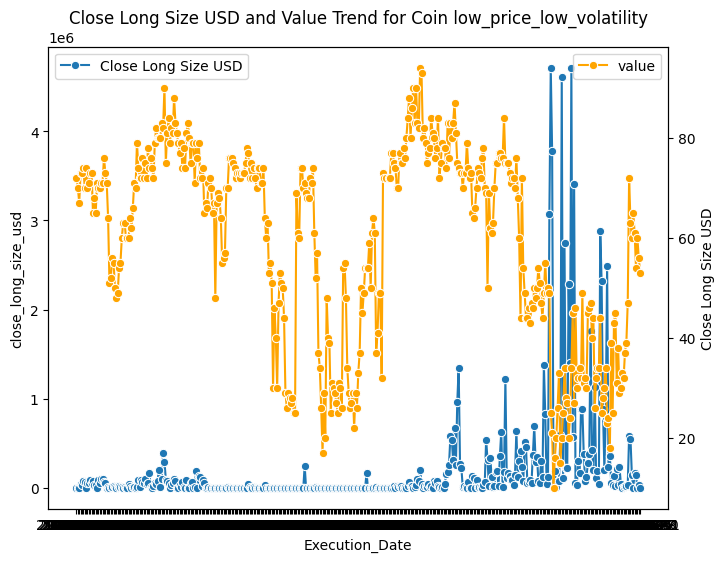

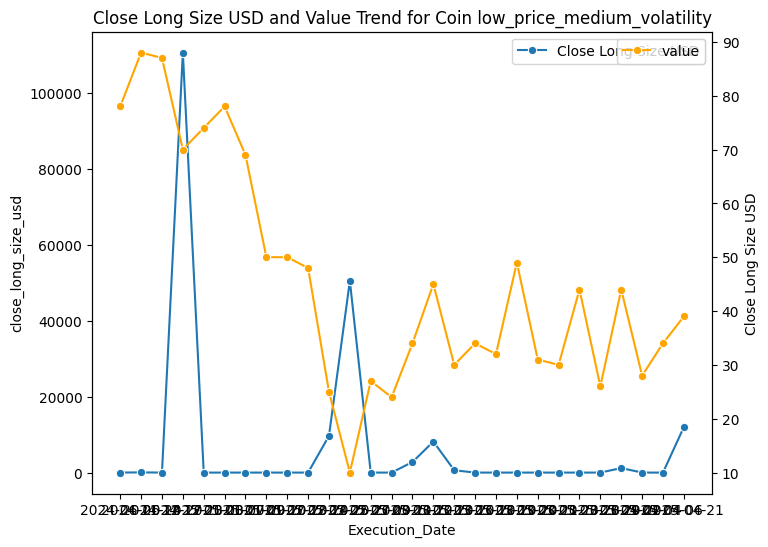

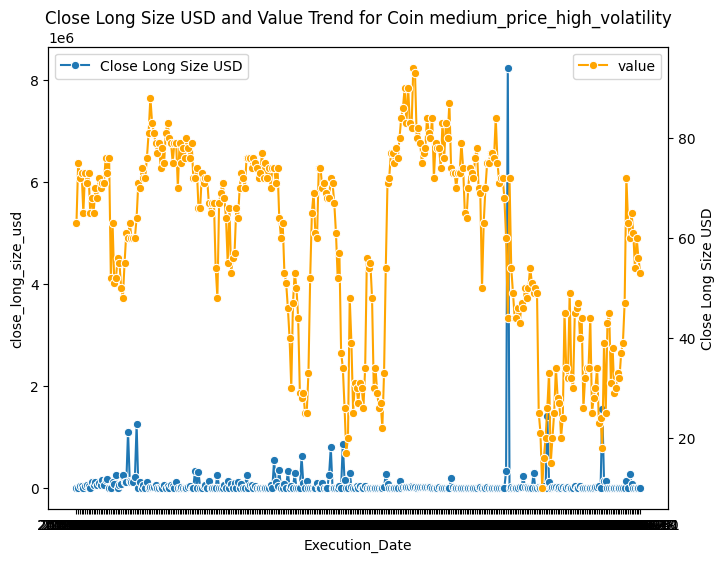

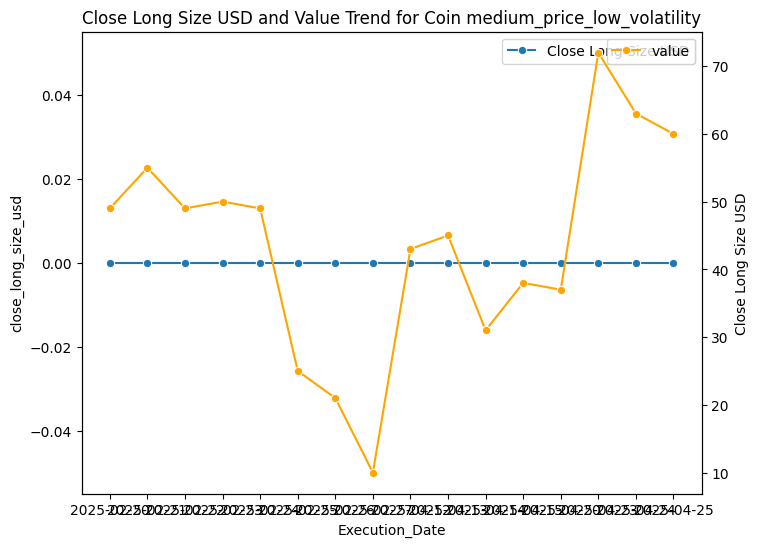

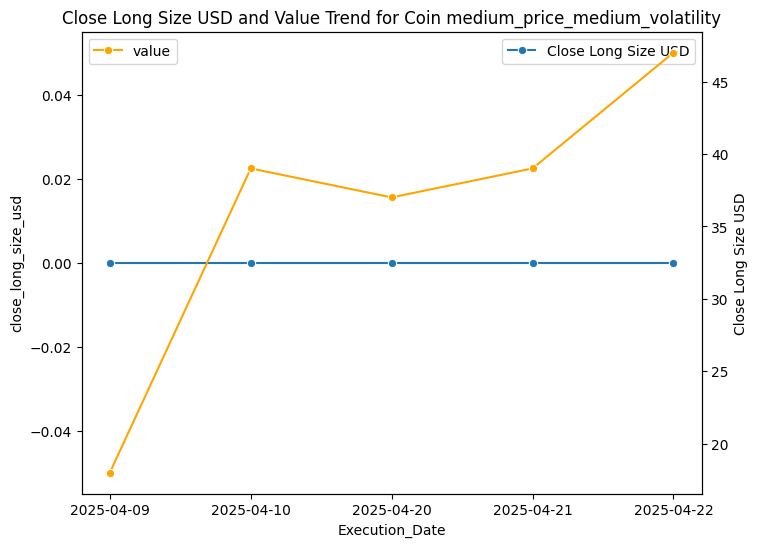

In [ ]:
# plot the Close Long Size USD & value over time for each coin cluster
for i in agg_summary_df.Coin_Cluster.unique():
    plt.figure(figsize=(8, 6))
    sns.lineplot(data=agg_summary_df[agg_summary_df.Coin_Cluster == i], x='Execution_Date', y='close_long_size_usd', label='Close Long Size USD', marker='o')
    plt.twinx()
    sns.lineplot(data=agg_summary_df[agg_summary_df.Coin_Cluster == i], x='Execution_Date', y='value', label='value', marker='o', color='orange')
    plt.title(f'Close Long Size USD and Value Trend for Coin {i}')
    plt.xlabel('Execution Date')
    plt.xticks(rotation=90)
    plt.ylabel('Close Long Size USD')
    plt.legend()
    plt.show()

1.High-price coins (especially with high volatility) show heavy spikes in close long sizes during periods of lower sentiment, suggesting traders are closing longs defensively when fear rises.

2.Medium- and low-volatility coins have relatively flat close-long activity, indicating fewer strong reactions to sentiment changes.

3.Low-price, high-volatility coins show frequent bursts of long closures, often aligned with sharp drops in sentiment, hinting at panic-driven exits.

Overall trend: When sentiment (value) dips toward fear, close long sizes spike, implying traders unwind positions rather than hold through uncertainty.

Market structure: High-value sentiment periods see reduced close-long activity, suggesting confidence in maintaining bullish positions.

### Sell Size USD vs Coin Cluster Trend

In [ ]:
# pivot table of agg_summary_df with index as Coin_Cluster and values as sell_size_usd with mean as aggregation function and fillna with 0
agg_summary_df.pivot_table(index='Coin_Cluster', values='sell_size_usd', aggfunc='mean').fillna(0)

,sell_size_usd
Coin_Cluster,
high_price_high_volatility,0.000000
high_price_medium_volatility,32051.478485
low_price_high_volatility,11.286902
low_price_low_volatility,69339.239416
low_price_medium_volatility,0.000000
medium_price_high_volatility,0.000000
medium_price_low_volatility,34411.945625
medium_price_medium_volatility,0.000000


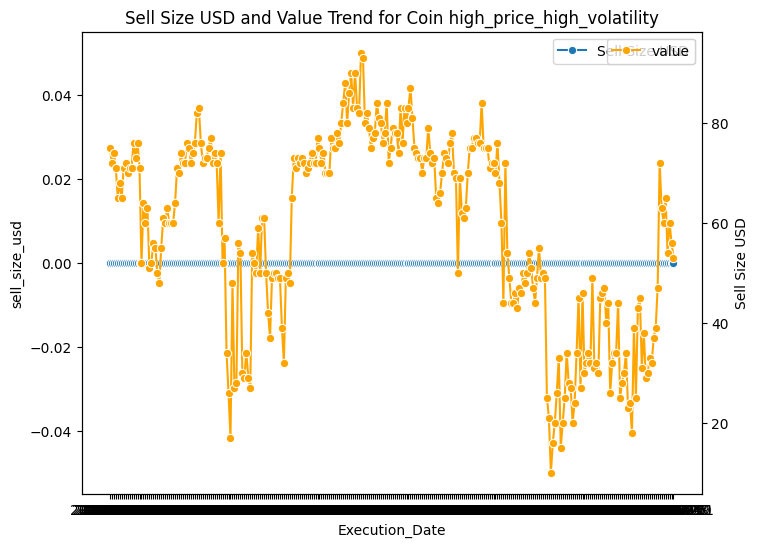

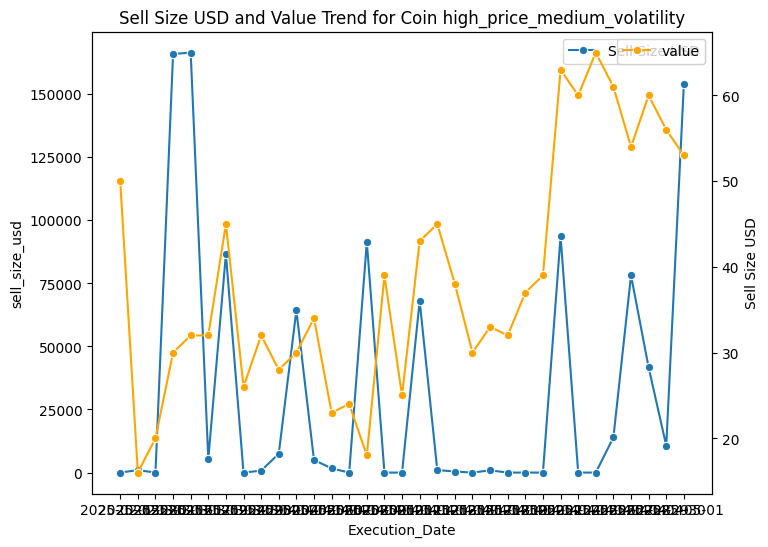

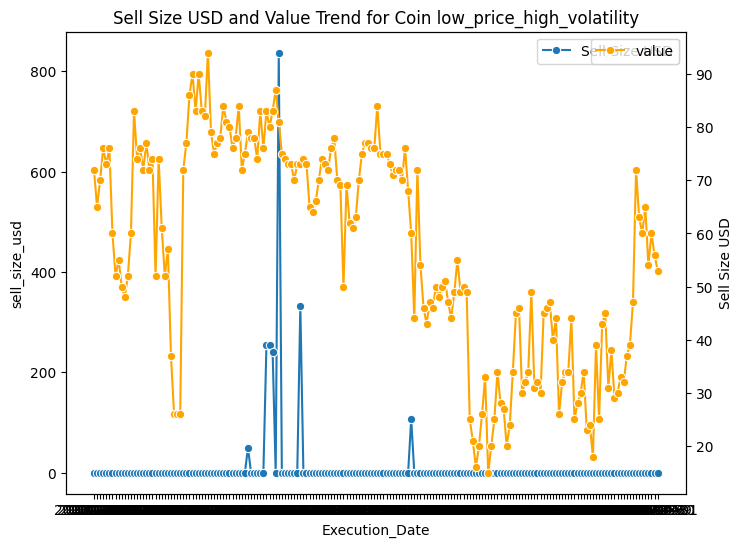

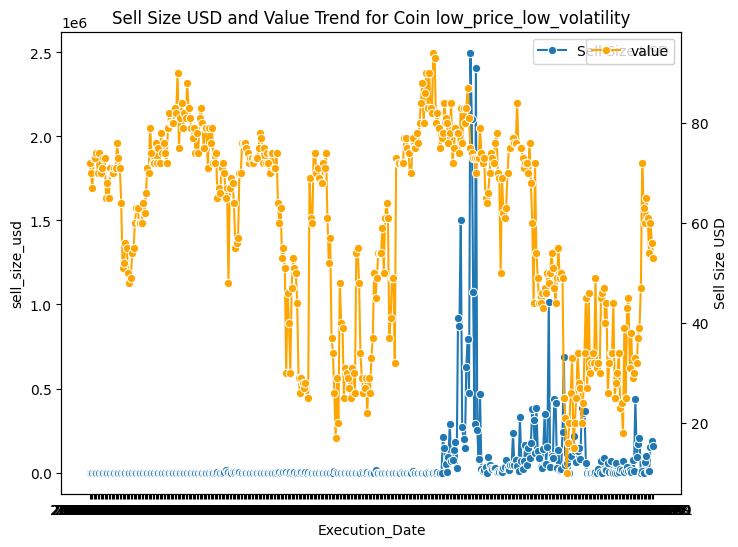

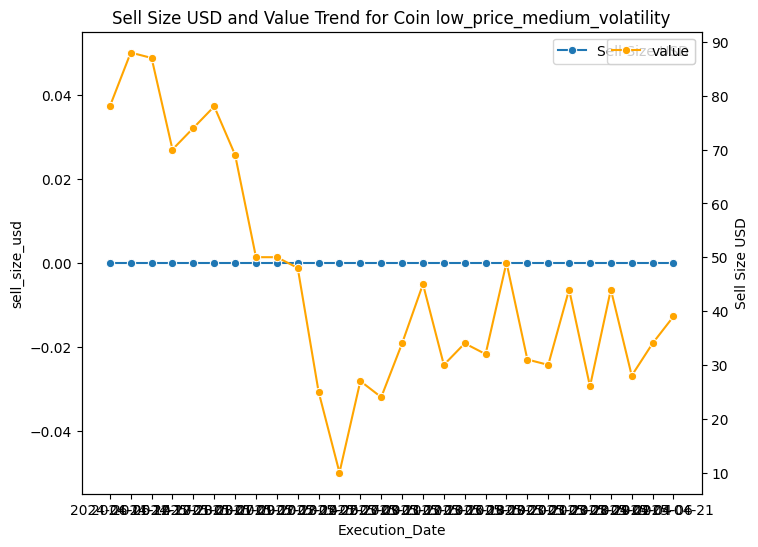

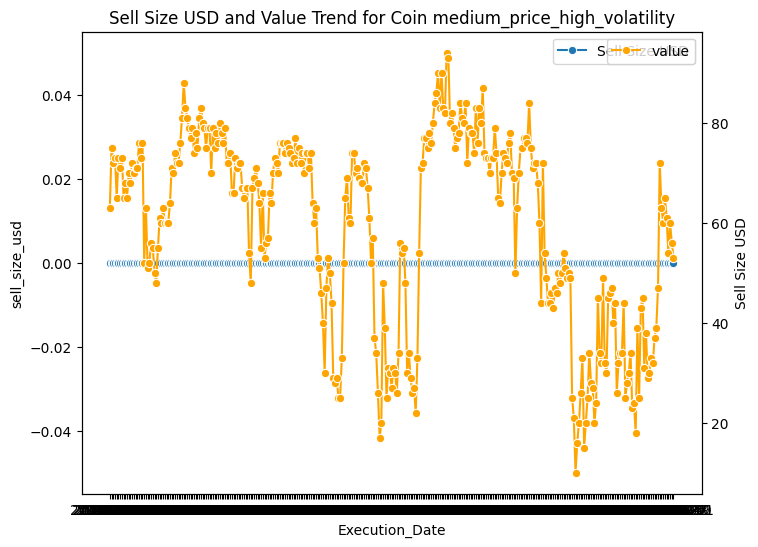

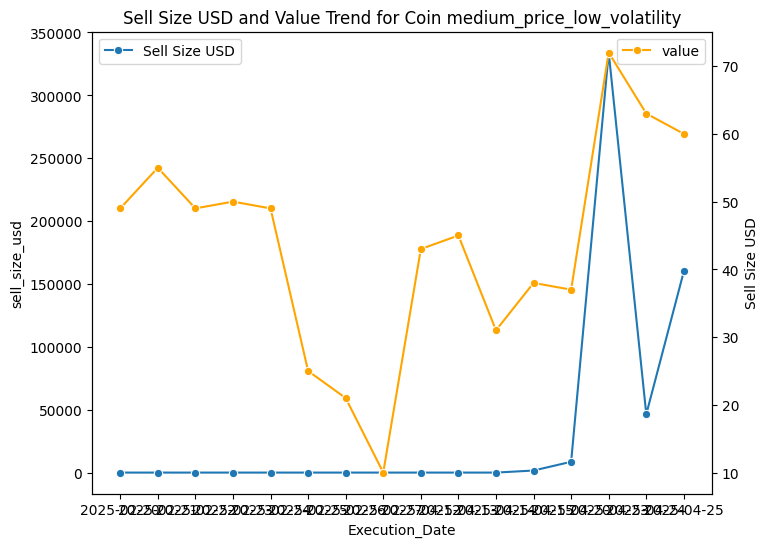

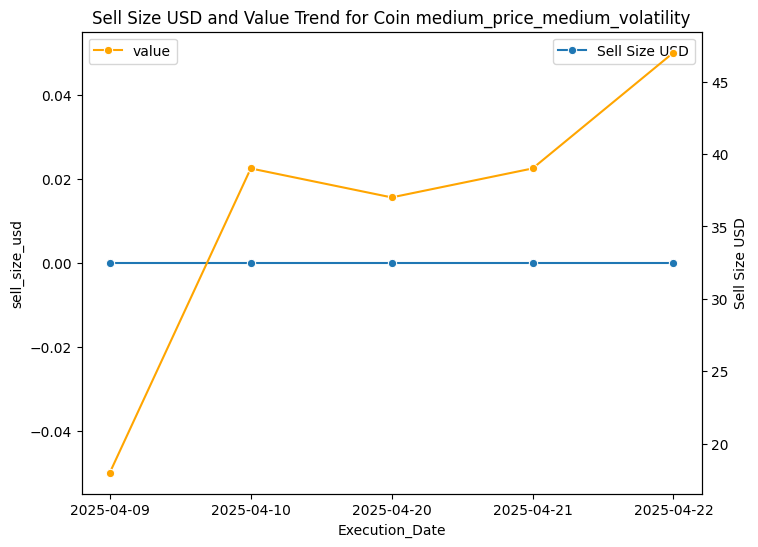

In [ ]:
# plot the sell_size_usd & value over time for each coin cluster
for i in agg_summary_df.Coin_Cluster.unique():
    plt.figure(figsize=(8, 6))
    sns.lineplot(data=agg_summary_df[agg_summary_df.Coin_Cluster == i], x='Execution_Date', y='sell_size_usd', label='Sell Size USD', marker='o')
    plt.twinx()
    sns.lineplot(data=agg_summary_df[agg_summary_df.Coin_Cluster == i], x='Execution_Date', y='value', label='value', marker='o', color='orange')
    plt.title(f'Sell Size USD and Value Trend for Coin {i}')
    plt.xlabel('Execution Date')
    plt.xticks(rotation=90)
    plt.ylabel('Sell Size USD')
    plt.legend()
    plt.show()

1.High-price coins: Sell sizes are generally flat or spiky, but value trends are smoother; this suggests institutional trades are fewer but large when they occur.

2.Low-price coins: Sell size USD shows sharp spikes with clustering, while value moves cyclically; this indicates strong speculative behavior and retail-driven exits.

3.Medium-price coins: Patterns are inconsistent — some categories show flat sell sizes despite value movement, hinting at either illiquidity or incomplete data capture.

4.Volatility impact: Higher volatility categories show larger and irregular sell size fluctuations, whereas low-volatility ones maintain moderate, cyclical movements aligned with value.

5.Data quality/scale issue: Several charts show near-zero or flat sell sizes despite dynamic value changes — rescaling or log-transforming might reveal hidden patterns.

### Close PnL vs Coin Cluster Trend

In [ ]:
# pivot table of agg_summary_df with index as Coin_Cluster and values as close_pnl with mean as aggregation function and fillna with 0
agg_summary_df.pivot_table(index='Coin_Cluster', values='close_pnl', aggfunc='mean').fillna(0)

,close_pnl
Coin_Cluster,
high_price_high_volatility,3035.121443
high_price_medium_volatility,225.768475
low_price_high_volatility,9045.410990
low_price_low_volatility,15675.218835
low_price_medium_volatility,10.828606
medium_price_high_volatility,4012.093735
medium_price_low_volatility,812.507643
medium_price_medium_volatility,-3737.774866


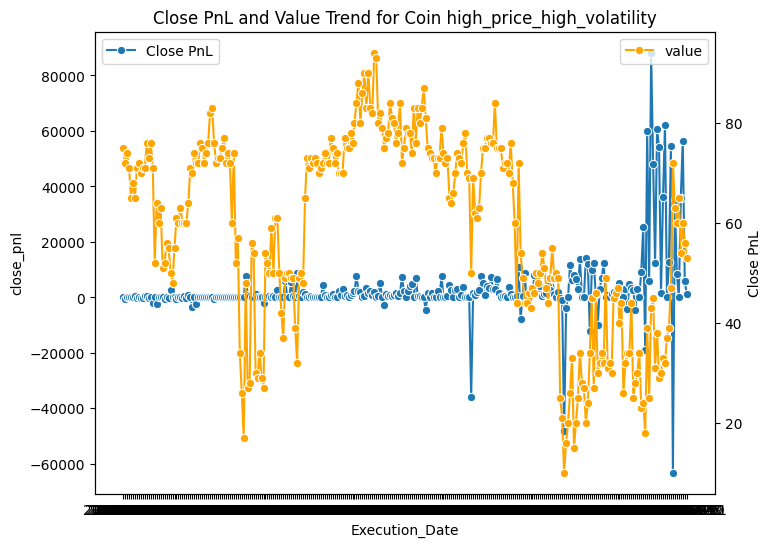

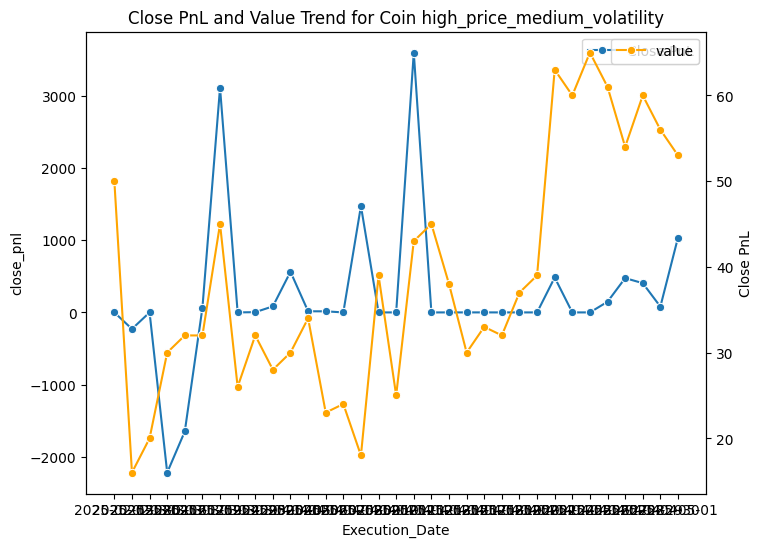

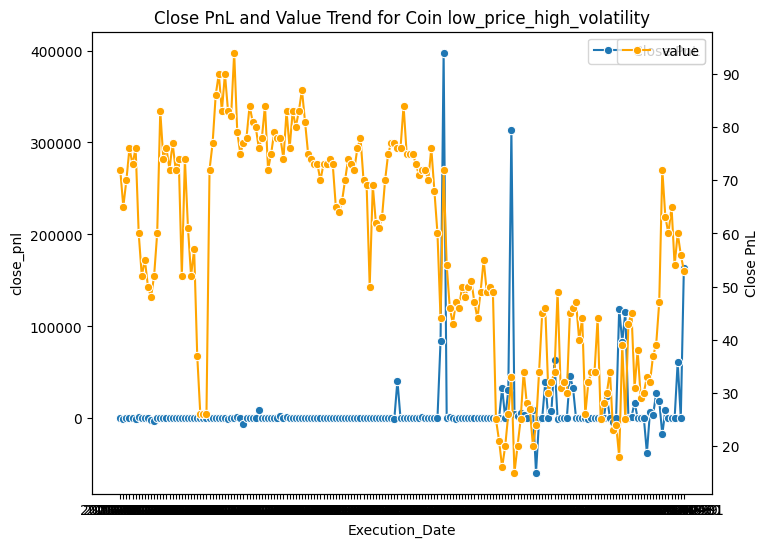

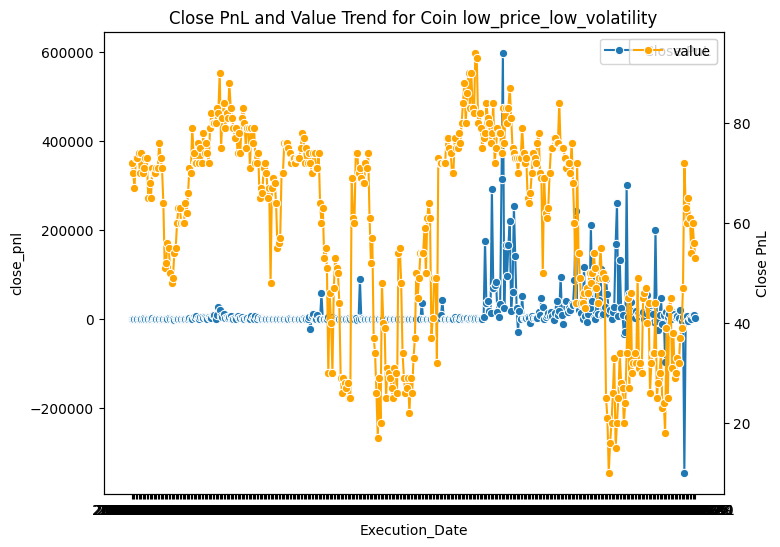

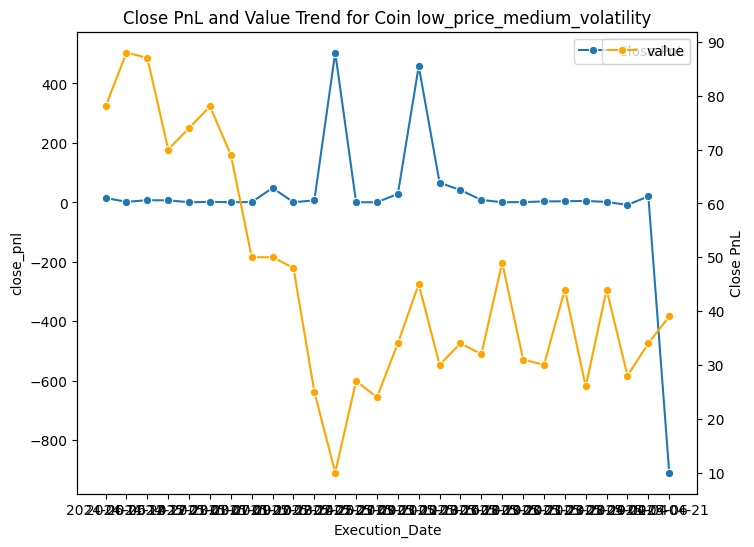

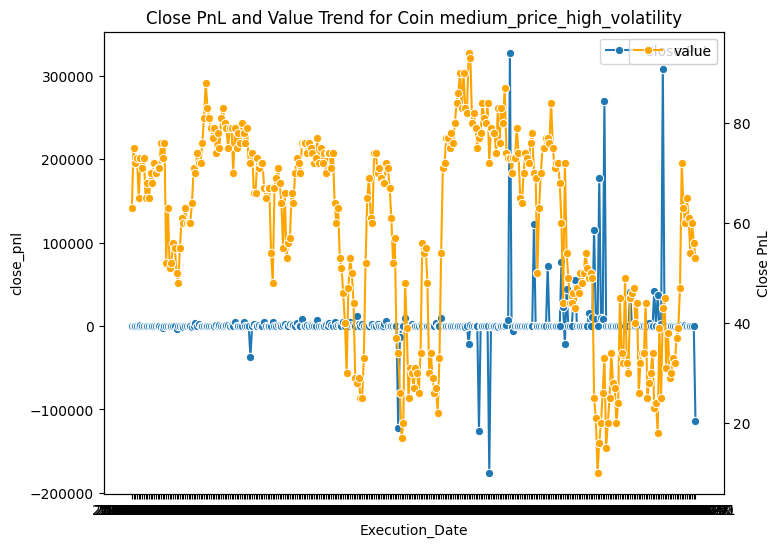

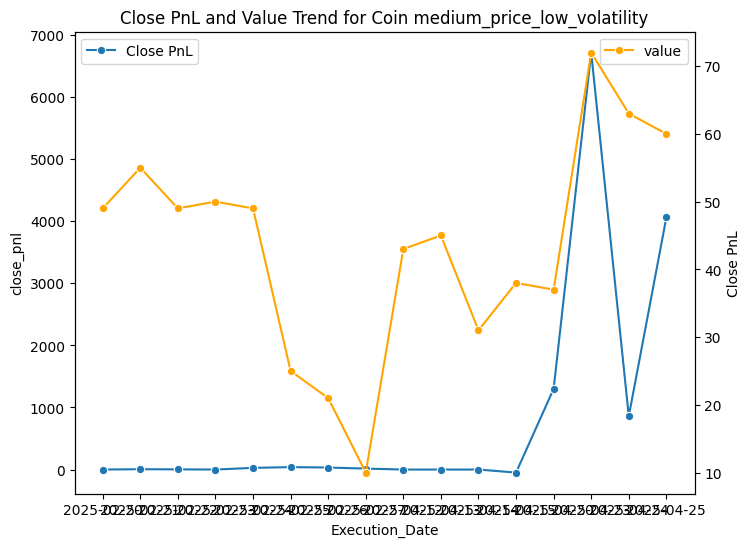

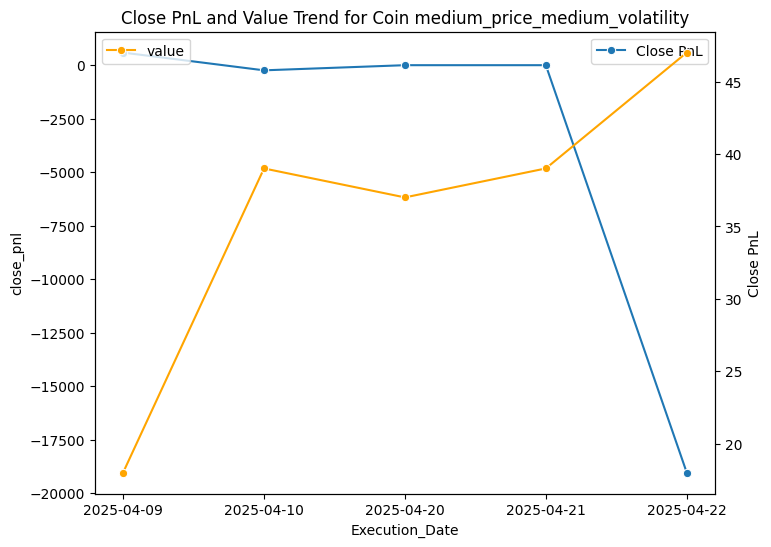

In [ ]:
# plot the Close PnL & value over time for each coin cluster
for i in agg_summary_df.Coin_Cluster.unique():
    plt.figure(figsize=(8, 6))
    sns.lineplot(data=agg_summary_df[agg_summary_df.Coin_Cluster == i], x='Execution_Date', y='close_pnl', label='Close PnL', marker='o')
    plt.twinx()
    sns.lineplot(data=agg_summary_df[agg_summary_df.Coin_Cluster == i], x='Execution_Date', y='value', label='value', marker='o', color='orange')
    plt.title(f'Close PnL and Value Trend for Coin {i}')
    plt.xlabel('Execution Date')
    plt.xticks(rotation=90)
    plt.ylabel('Close PnL')
    plt.legend()
    plt.show()

1.High volatility coins (any price level) → Show the largest PnL swings (both profits and losses), with values fluctuating sharply.

2.Medium volatility coins → PnL is more moderate, showing some spikes but less extreme compared to high volatility.

3.Low volatility coins → PnL remains mostly stable with limited fluctuations; safer but with lower profit potential.

4.Price level (high, medium, low) mainly affects the magnitude of PnL (higher price → larger $ value swings), but volatility is the bigger driver of risk.

Overall pattern → Volatility is the key factor: high volatility = high risk/reward, while low volatility = stability but lower gains.

### Coin Cluster vs Classification vs Average Execution Price

In [ ]:
# pivot_table of coin_cluster vs Classification vs Average_Execution_Price
agg_summary_df.pivot_table(index='Coin_Cluster', columns='classification', values='Average_Execution_Price', aggfunc='mean').fillna(0)

classification,Extreme Fear,Extreme Greed,Fear,Greed,Neutral
Coin_Cluster,,,,,
high_price_high_volatility,80332.199984,89410.567958,79860.560528,71260.310456,77238.983725
high_price_medium_volatility,79949.440643,0.000000,83337.735960,94021.886059,91444.096702
low_price_high_volatility,152.988250,256.339073,142.273045,213.565296,187.441102
low_price_low_volatility,7.030085,8.289593,4.885523,6.526548,6.403050
low_price_medium_volatility,575.132583,695.898333,607.352332,692.480690,651.550400
medium_price_high_volatility,2070.672472,3449.693556,2300.319186,2963.913749,2648.840145
medium_price_low_volatility,1611.054545,0.000000,1569.354681,1694.848860,1534.187753
medium_price_medium_volatility,3083.483137,0.000000,3272.682488,0.000000,3445.618455


1.High-price clusters dominate across all sentiment states – Both high_price_high_volatility and high_price_medium_volatility coins have the largest values (70K–94K range), showing they carry the bulk of market weight regardless of sentiment.

2.Volatility amplifies sentiment extremes – In high volatility clusters, the gap between Extreme Fear and Extreme Greed is much larger (e.g., ~80K vs ~89K), indicating stronger emotional-driven market swings.

3.Low-price clusters are least impacted by sentiment – For low_price_low_volatility coins, values remain very small (mostly under 10), showing minimal sensitivity to market fear/greed cycles.

4.Medium-price clusters show selective participation – Some categories like medium_price_low_volatility and medium_price_medium_volatility have zeros under certain sentiments (Extreme Greed/Greed), suggesting they are not consistently active across all market phases.

### Coin Cluster vs Classification vs Open Long Size Tokens

In [ ]:
# pivot_table of coin_cluster vs Classification vs open_long_size_tokens
agg_summary_df.pivot_table(index='Coin_Cluster', columns='classification', values='open_long_size_tokens', aggfunc='mean').fillna(0)

classification,Extreme Fear,Extreme Greed,Fear,Greed,Neutral
Coin_Cluster,,,,,
high_price_high_volatility,16.991907,2.419576e+00,22.525469,6.902234,7.415531
high_price_medium_volatility,0.000000,0.000000e+00,0.000000,0.000000,0.000000
low_price_high_volatility,8052.700100,1.510417e+02,3060.361209,1391.557074,751.609733
low_price_low_volatility,219794.366429,1.069780e+06,562384.970976,353999.112673,817451.760189
low_price_medium_volatility,49.089000,2.100000e-02,1.990429,54.772667,3.000000
medium_price_high_volatility,79.742786,5.898526e+00,70.369305,28.014275,17.723179
medium_price_low_volatility,0.000000,0.000000e+00,0.000000,0.000000,0.000000
medium_price_medium_volatility,0.000000,0.000000e+00,0.000000,0.000000,0.000000


1.Low-price low-volatility dominates across all sentiments – It shows extremely high values (e.g., ~219K in Extreme Fear, ~1M in Extreme Greed, ~817K Neutral), indicating this cluster attracts the largest participation regardless of sentiment.

2.High-price medium-volatility and medium-price low/medium-volatility clusters are inactive – They show zeros across all sentiment categories, suggesting little to no trading or relevance in the dataset.

3.Low-price high-volatility shows meaningful but smaller activity – It spikes in Extreme Fear (~8052) and decreases under Greed (~1391), showing this cluster is more sentiment-sensitive but on a smaller scale compared to low-volatility.

4.High-price high-volatility remains very low – With values <25 in most cases, this cluster barely reacts to sentiment, implying it is less favored by participants.

Overall: Low-price low-volatility coins are the real driver across sentiment regimes, while high-price and medium-price clusters play only marginal roles.

### Coin Cluster vs Classification vs Close Long Size Tokens

In [ ]:
# pivot_table of coin_cluster vs Classification vs open_long_size_tokens
agg_summary_df.pivot_table(index='Coin_Cluster', columns='classification', values='open_short_size_tokens', aggfunc='mean').fillna(0)

classification,Extreme Fear,Extreme Greed,Fear,Greed,Neutral
Coin_Cluster,,,,,
high_price_high_volatility,3.387389e+00,0.954355,9.618750,2.964926,2.529194
high_price_medium_volatility,0.000000e+00,0.000000,0.000000,0.000000,0.000000
low_price_high_volatility,3.062239e+03,319.794957,1458.084209,303.544778,390.576333
low_price_low_volatility,1.062574e+06,603874.087549,531352.962195,321257.253208,888931.293019
low_price_medium_volatility,0.000000e+00,1.505000,0.614286,0.210667,0.359600
medium_price_high_volatility,8.040463e+01,30.659824,44.067175,21.771778,67.344553
medium_price_low_volatility,5.125000e-01,0.000000,0.047060,1.154200,0.984760
medium_price_medium_volatility,2.403210e+02,0.000000,76.515667,0.000000,0.000000


1.Low-price low-volatility dominates again – It has the highest values across all sentiments (e.g., ~1.06M in Extreme Fear, ~603K in Extreme Greed, ~889K in Neutral), showing it is the most active and sentiment-sensitive cluster.

2.Low-price high-volatility plays a secondary role – It shows significant but smaller activity (~3K in Extreme Fear, ~1.4K in Fear, ~319 in Extreme Greed), indicating traders engage but at a lower scale than low-volatility assets.

3.High-price clusters remain largely irrelevant – High-price high-volatility has only single or double-digit values (max ~9.6 under Fear), and high-price medium-volatility is fully inactive (zeros everywhere).

4.Medium-price clusters have marginal impact – Medium-price high-volatility shows small values (max ~67 under Neutral), while medium-price low/medium-volatility are almost inactive with near-zero or tiny contributions.

Overall takeaway: Market activity is heavily concentrated in low-price coins, especially low-volatility ones, while high/medium-price clusters barely move sentiment-driven flows.

### Coin Cluster vs Classification vs Buy Size Tokens

In [ ]:
# pivot_table of coin_cluster vs Classification vs open_long_size_tokens
agg_summary_df.pivot_table(index='Coin_Cluster', columns='classification', values='buy_size_tokens', aggfunc='mean').fillna(0)

classification,Extreme Fear,Extreme Greed,Fear,Greed,Neutral
Coin_Cluster,,,,,
high_price_high_volatility,0.000000,0.000000,0.000000,0.000000,0.000000
high_price_medium_volatility,0.057522,0.000000,0.514182,0.939662,0.328416
low_price_high_volatility,0.000000,0.234043,0.000000,0.007593,0.000000
low_price_low_volatility,49823.852857,22035.948529,63502.744024,22954.330126,39927.710566
low_price_medium_volatility,0.000000,0.000000,0.000000,0.000000,0.000000
medium_price_high_volatility,0.000000,0.000000,0.000000,0.000000,0.000000
medium_price_low_volatility,0.000000,0.000000,2.708160,0.000000,0.247640
medium_price_medium_volatility,0.000000,0.000000,0.000000,0.000000,0.000000


1.Low-price low-volatility dominates completely – It has the largest values across all sentiments (e.g., ~49.8K in Extreme Fear, ~63.5K in Fear, ~39.9K in Neutral), making it the central driver of sentiment-linked behavior.

2.Other clusters show negligible activity – High-price clusters are essentially inactive (all near-zero values), showing no meaningful response to sentiment.

3.Small but trace activity in high-price medium-volatility & medium-price low-volatility – A few non-zero values exist (e.g., ~0.9 under Greed for high-price medium-volatility, ~2.7 under Fear for medium-price low-volatility), but they’re insignificant compared to low-price low-volatility.

4.Extreme Greed engagement is limited – Even in the dominant cluster (low-price low-volatility), activity during Extreme Greed (~22K) is much lower than during Fear (~63.5K), suggesting traders may be more cautious in greed phases.

### Coin Cluster vs Classification vs Close Long Size Tokens

In [ ]:
# pivot_table of coin_cluster vs Classification vs close_long_size_tokens
agg_summary_df.pivot_table(index='Coin_Cluster', columns='classification', values='close_long_size_tokens', aggfunc='mean').fillna(0)

classification,Extreme Fear,Extreme Greed,Fear,Greed,Neutral
Coin_Cluster,,,,,
high_price_high_volatility,15.935839,2.182327e+00,21.536957,5.721603,11.855751
high_price_medium_volatility,0.000000,0.000000e+00,0.000000,0.000000,0.000000
low_price_high_volatility,7953.773000,1.537991e+02,2660.107279,731.707907,2459.192033
low_price_low_volatility,155464.895714,1.062849e+06,558840.148415,350072.236069,822387.630943
low_price_medium_volatility,41.589000,2.100000e-02,3.133286,54.772667,2.800000
medium_price_high_volatility,78.442764,5.049164e+00,71.297327,26.499665,23.012058
medium_price_low_volatility,0.000000,0.000000e+00,0.000000,0.000000,0.000000
medium_price_medium_volatility,0.000000,0.000000e+00,0.000000,0.000000,0.000000


1.Low-price low-volatility dominates sentiment reactions – It shows the largest activity across all categories, especially in Extreme Greed (~1.06M) and Neutral (~822K), making it the most sentiment-sensitive cluster.

2.Low-price high-volatility also shows notable activity – While much smaller than low-price low-volatility, it still reacts strongly under Fear (~2.6K) and Neutral (~2.4K), indicating traders are active in this cluster during uncertain phases.

3.High-price clusters are weakly sensitive – High-price high-volatility has small but consistent values across sentiments, but high-price medium-volatility remains completely inactive (all zeros).

4.Medium-price clusters are marginal – Medium-price high-volatility shows minor movements (~71 under Fear), while both medium-price low-volatility and medium-price medium-volatility remain entirely inactive.

### Coin Cluster vs Classification vs Close short Size Tokens

In [ ]:
# pivot_table of coin_cluster vs Classification vs close_short_size_tokens
agg_summary_df.pivot_table(index='Coin_Cluster', columns='classification', values='close_short_size_tokens', aggfunc='mean').fillna(0)

classification,Extreme Fear,Extreme Greed,Fear,Greed,Neutral
Coin_Cluster,,,,,
high_price_high_volatility,1.850333e+00,1.154144,9.801232,3.155184,1.858285
high_price_medium_volatility,0.000000e+00,0.000000,0.000000,0.000000,0.000000
low_price_high_volatility,2.338252e+03,135.627404,1811.642326,419.557315,174.323500
low_price_low_volatility,1.031910e+06,616150.456961,526155.283415,428682.933019,509334.277170
low_price_medium_volatility,0.000000e+00,1.582750,0.642857,0.000000,0.343800
medium_price_high_volatility,1.004017e+02,17.887054,60.420313,25.137719,52.740760
medium_price_low_volatility,5.125000e-01,0.000000,1.695360,0.060025,0.211800
medium_price_medium_volatility,1.759160e+02,0.000000,21.468333,0.000000,229.547000


1.Low-price low-volatility dominates sentiment again – It shows the highest activity across all categories, especially in Extreme Fear (~1.03M), Extreme Greed (~616K), and Neutral (~509K), reinforcing its position as the most sentiment-sensitive cluster.

2.Low-price high-volatility shows secondary influence – Noticeable spikes occur in Extreme Fear (~2.3K) and Fear (~1.8K), suggesting traders become more active in volatile low-priced assets under fear-driven conditions.

3.Medium-price clusters show mild but visible reactions – Particularly, medium_price_high_volatility and medium_price_medium_volatility display some movement in Fear and Neutral conditions, though much smaller compared to low-price clusters.

4.High-price clusters remain mostly inactive – High_price_high_volatility shows small but consistent values across all sentiments, while high_price_medium_volatility is completely flat.

### Coin Cluster vs Classification vs Sell Size Tokens

In [ ]:
# pivot_table of coin_cluster vs Classification vs sell_size_tokens
agg_summary_df.pivot_table(index='Coin_Cluster', columns='classification', values='sell_size_tokens', aggfunc='mean').fillna(0)

classification,Extreme Fear,Extreme Greed,Fear,Greed,Neutral
Coin_Cluster,,,,,
high_price_high_volatility,0.000000,0.000000,0.000000,0.000000,0.000000
high_price_medium_volatility,0.229700,0.000000,0.342595,0.283162,0.693380
low_price_high_volatility,0.000000,0.175957,0.000000,0.057778,0.000000
low_price_low_volatility,25453.038571,67363.980588,6749.316707,12883.583648,25219.848491
low_price_medium_volatility,0.000000,0.000000,0.000000,0.000000,0.000000
medium_price_high_volatility,0.000000,0.000000,0.000000,0.000000,0.000000
medium_price_low_volatility,0.000000,0.000000,1.264300,75.825325,0.000000
medium_price_medium_volatility,0.000000,0.000000,0.000000,0.000000,0.000000


1.Low-price low-volatility dominates again – It shows the highest activity across all sentiment states: Extreme Fear (~25.4K), Extreme Greed (~67.3K), Fear (~6.7K), Greed (~12.9K), and Neutral (~25.2K).

2.Other clusters have negligible values – High-price and medium-price clusters remain almost flat, except for very tiny contributions (sub-1.0 to single digits) in Fear/Greed/Neutral.

3.Low-price high-volatility contributes slightly in Greed & Extreme Greed – It shows small but visible activity (~0.18 in Extreme Greed, ~0.06 in Greed), indicating minor trader reaction under greed-driven conditions.

4.Medium-price low-volatility only spikes under Fear & Greed – It shows activity (~1.26 Fear, ~75.8 Greed), but nowhere near the dominance of low-price low-volatility.

### Coin Cluster vs Classification vs Open Long Size USD

In [ ]:
# pivot_table of coin_cluster vs Classification vs open_long_size_usd
agg_summary_df.pivot_table(index='Coin_Cluster', columns='classification', values='open_long_size_usd', aggfunc='mean').fillna(0)

classification,Extreme Fear,Extreme Greed,Fear,Greed,Neutral
Coin_Cluster,,,,,
high_price_high_volatility,1.337173e+06,233936.725147,1.908674e+06,616599.282427,662051.956809
high_price_medium_volatility,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000
low_price_high_volatility,9.832757e+05,32985.100000,4.062573e+05,205087.796667,104153.236000
low_price_low_volatility,1.063038e+06,102575.414608,3.616131e+05,61804.585660,222451.915094
low_price_medium_volatility,2.912712e+04,13.182500,1.185848e+03,36883.676667,1985.310000
medium_price_high_volatility,1.172928e+05,18793.513462,1.872370e+05,74084.647769,49355.359535
medium_price_low_volatility,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000
medium_price_medium_volatility,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000


1.High-price high-volatility dominates sentiment extremes – It has the largest values in Extreme Fear (1.34M), Greed (616K), and Neutral (662K), showing this cluster reacts strongly in almost all sentiment states.

2.Low-price low-volatility remains strong – It shows 1.06M in Extreme Fear, and substantial values across all states (Fear ~361K, Neutral ~222K), confirming that stable low-price coins consistently respond to sentiment.

3.Low-price high-volatility spikes under Fear and Greed – With 983K in Extreme Fear and 205K in Greed, this cluster becomes active in emotional extremes, especially when fear dominates.

4.Medium-price high-volatility contributes moderately – It shows activity across Extreme Fear (~117K), Greed (~74K), and Neutral (~49K), indicating mid-priced volatile coins still respond, but at a much smaller scale than high/low-priced clusters.

### Coin Cluster vs Classification vs Open Short Size USD

In [ ]:
# pivot_table of coin_cluster vs Classification vs open_short_size_usd
agg_summary_df.pivot_table(index='Coin_Cluster', columns='classification', values='open_short_size_usd', aggfunc='mean').fillna(0)

classification,Extreme Fear,Extreme Greed,Fear,Greed,Neutral
Coin_Cluster,,,,,
high_price_high_volatility,276339.579167,91729.044853,807509.447857,226901.299612,210388.487021
high_price_medium_volatility,0.000000,0.000000,0.000000,0.000000,0.000000
low_price_high_volatility,371949.210000,84501.432340,200499.215116,57819.150000,59399.688000
low_price_low_volatility,299916.595000,68996.133922,135967.921829,76160.806478,143958.495094
low_price_medium_volatility,0.000000,1082.425000,382.958571,147.823333,252.172000
medium_price_high_volatility,139582.500000,108153.357821,102593.804844,63911.939077,169831.321860
medium_price_low_volatility,856.375000,0.000000,70.986000,1723.222500,1513.012000
medium_price_medium_volatility,742325.740000,0.000000,257332.710000,0.000000,0.000000


Extreme Fear is the strongest sentiment – it dominates across almost all coin clusters.

High-price high-volatility coins are highly sensitive, showing big values in all sentiment states.

Medium-price high-volatility coins show balanced reactions across fear and greed, making them steady movers.

Low-price low-volatility coins react heavily under fear conditions, but less under greed.

Overall, fear-driven sentiment moves the market the most, while greed has a smaller impact.

### Coin Cluster vs Classification vs Buy Size USD

In [ ]:
# pivot_table of coin_cluster vs Classification vs buy_size_usd
agg_summary_df.pivot_table(index='Coin_Cluster', columns='classification', values='buy_size_usd', aggfunc='mean').fillna(0)

classification,Extreme Fear,Extreme Greed,Fear,Greed,Neutral
Coin_Cluster,,,,,
high_price_high_volatility,0.000000,0.000000,0.000000,0.000000,0.000000
high_price_medium_volatility,4412.848000,0.000000,42675.214118,87844.426667,30807.834000
low_price_high_volatility,0.000000,32.440213,0.000000,1.087037,0.000000
low_price_low_volatility,83735.994286,111952.230490,54854.932073,52050.697296,82590.350755
low_price_medium_volatility,0.000000,0.000000,0.000000,0.000000,0.000000
medium_price_high_volatility,0.000000,0.000000,0.000000,0.000000,0.000000
medium_price_low_volatility,0.000000,0.000000,4336.026000,0.000000,399.918000
medium_price_medium_volatility,0.000000,0.000000,0.000000,0.000000,0.000000


Low-price low-volatility coins dominate sentiment impact, especially in Extreme Greed (111k) and Fear (54k).

High-price medium-volatility coins also show strong reactions in Fear (42k) and Greed (87k), making them highly sentiment-driven.

High-price high-volatility coins show no major reaction, staying almost neutral.

Medium-price low-volatility coins react only slightly in Fear (~4.3k), while other states are negligible.

Overall, sentiment impact is concentrated in specific clusters (low-price low-volatility, high-price medium-volatility), while others remain relatively unaffected.

### Coin Cluster vs Classification vs Close Long Size USD

In [ ]:
# pivot_table of coin_cluster vs Classification vs close_long_size_usd
agg_summary_df.pivot_table(index='Coin_Cluster', columns='classification', values='close_long_size_usd', aggfunc='mean').fillna(0)

classification,Extreme Fear,Extreme Greed,Fear,Greed,Neutral
Coin_Cluster,,,,,
high_price_high_volatility,1.266989e+06,212509.697941,1.828990e+06,503765.118544,1.074820e+06
high_price_medium_volatility,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000e+00
low_price_high_volatility,9.826546e+05,33783.516596,3.581818e+05,110123.809630,3.562690e+05
low_price_low_volatility,1.138176e+06,107225.883137,3.571247e+05,56905.823522,2.273186e+05
low_price_medium_volatility,2.526017e+04,13.532500,1.874713e+03,36885.803333,1.633888e+03
medium_price_high_volatility,1.157544e+05,16220.151795,1.892944e+05,69947.382692,6.369626e+04
medium_price_low_volatility,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000e+00
medium_price_medium_volatility,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000e+00


1.High-price high-volatility coins dominate sentiment – they show the highest values across all classifications, with Extreme Fear (1.26M) and Fear (1.82M) being the most significant.

2.Low-price high-volatility coins are also strongly sentiment-driven, especially in Fear (358k) and Greed (110k).

3.Low-price low-volatility coins respond notably to Extreme Fear (1.13M), but less to Greed (56k).

4.Medium-price high-volatility coins show moderate influence, especially in Fear (189k) and Greed (69k).

5.Medium- and low-volatility clusters (medium_price_low_volatility, medium_price_medium_volatility, high_price_medium_volatility) show almost no reaction, indicating weak sentiment sensitivity.

### Coin Cluster vs Classification vs Close Short Size USD

In [ ]:
# pivot_table of coin_cluster vs Classification vs close_short_size_usd
agg_summary_df.pivot_table(index='Coin_Cluster', columns='classification', values='close_short_size_usd', aggfunc='mean').fillna(0)

classification,Extreme Fear,Extreme Greed,Fear,Greed,Neutral
Coin_Cluster,,,,,
high_price_high_volatility,153118.890000,107128.634118,822389.943214,246452.018641,146026.267234
high_price_medium_volatility,0.000000,0.000000,0.000000,0.000000,0.000000
low_price_high_volatility,287940.865000,34736.168511,251313.783023,72883.672963,28056.091333
low_price_low_volatility,332452.637857,56202.409804,115840.301829,78075.359874,130578.639623
low_price_medium_volatility,0.000000,1132.277500,395.873571,0.000000,236.386000
medium_price_high_volatility,176984.847857,62017.003462,136466.079531,76674.237846,125488.661628
medium_price_low_volatility,832.415000,0.000000,2303.838000,85.012500,317.052000
medium_price_medium_volatility,542796.590000,0.000000,66393.506667,0.000000,791035.410000


1.High-price high-volatility coins dominate overall, with the highest Fear (822k) and strong signals across all classifications, showing they’re highly sentiment-driven.

2.Low-price high-volatility coins also show strong sensitivity, especially in Extreme Fear (287k) and Fear (251k), but less in Neutral.

3.Low-price low-volatility coins react strongly to Extreme Fear (332k) but maintain more balance across Greed (78k) and Neutral (130k).

4.Medium-price high-volatility coins display solid sentiment influence, with Extreme Fear (176k) and Fear (136k) standing out.

5.Medium-price medium-volatility coins show Extreme Fear (542k) dominance and very high Neutral (791k), suggesting traders hesitate or hold in uncertain markets.

### Coin Cluster vs Classification vs Sell Size USD

In [ ]:
# pivot_table of coin_cluster vs Classification vs sell_size_usd
agg_summary_df.pivot_table(index='Coin_Cluster', columns='classification', values='sell_size_usd', aggfunc='mean').fillna(0)

classification,Extreme Fear,Extreme Greed,Fear,Greed,Neutral
Coin_Cluster,,,,,
high_price_high_volatility,0.000000,0.000000,0.000000,0.000000,0.000000
high_price_medium_volatility,18794.058000,0.000000,28489.409412,26629.585000,63926.206000
low_price_high_volatility,0.000000,34.853617,0.000000,8.123519,0.000000
low_price_low_volatility,98317.680714,99312.055784,49288.346585,59452.969057,65990.258113
low_price_medium_volatility,0.000000,0.000000,0.000000,0.000000,0.000000
medium_price_high_volatility,0.000000,0.000000,0.000000,0.000000,0.000000
medium_price_low_volatility,0.000000,0.000000,2043.162000,135093.830000,0.000000
medium_price_medium_volatility,0.000000,0.000000,0.000000,0.000000,0.000000


High-price high-volatility coins show no reaction across all classifications — these coins are unaffected by sentiment in this dataset.

High-price medium-volatility coins respond strongly to Fear (28k) and Greed (26k), with solid Neutral values (~64k).

Low-price high-volatility coins show only small activity under Extreme Greed (34) and minor Greed (8), otherwise flat.

Low-price low-volatility coins are the most active here, with Extreme Fear (~98k), Extreme Greed (~99k), and balanced Greed/Neutral (~59k–65k).

Medium-price low-volatility coins show dominance in Greed (~135k), even more than Fear, highlighting risk-on behavior in this group

### Coin Cluster vs Classification vs Close PnL

In [ ]:
# pivot_table of coin_cluster vs Classification vs sell_size_usd
agg_summary_df.pivot_table(index='Coin_Cluster', columns='classification', values='close_pnl', aggfunc='mean').fillna(0)

classification,Extreme Fear,Extreme Greed,Fear,Greed,Neutral
Coin_Cluster,,,,,
high_price_high_volatility,254.736693,1483.569281,8618.743644,1121.118365,3531.496715
high_price_medium_volatility,251.575233,0.000000,27.124808,185.915624,923.173606
low_price_high_volatility,10517.950431,1067.034204,17604.493004,8417.480293,9916.279177
low_price_low_volatility,25296.829127,25550.295080,17581.411303,7649.800907,14750.248491
low_price_medium_volatility,251.659715,5.990985,-52.648692,2.158763,101.304600
medium_price_high_volatility,19594.302192,-538.667566,10547.884012,2700.277022,1431.955549
medium_price_low_volatility,23.956865,0.000000,257.748924,2908.454605,5.929103
medium_price_medium_volatility,588.956072,0.000000,-80.163280,0.000000,-19037.340561


1.Low-price low-volatility coins dominate across all emotions, especially Extreme Greed (~25.5k) and Neutral (~14.7k), showing strong sentiment-driven activity.

2.Low-price high-volatility coins also show high sensitivity, with big reactions under Fear (~17.6k) and Greed (~8.4k).

3.High-price high-volatility coins have moderate activity (~8.6k Fear, ~1.4k Extreme Greed), but much lower than low-priced clusters.

4.Medium-price clusters show mixed results — high-volatility coins are active (~10.5k Fear), but medium-price medium-volatility coins even show negative Neutral (-19k), meaning underperformance or correction.

5.High-price medium-volatility coins remain the least affected, with minimal values (<1k–900 range).